# Studio di Robustezza al Rumore — MAGIC Gamma Telescope

# Inizializzazione e Caricamento Dati

In [1]:
import os
import math
import re
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    classification_report, confusion_matrix, accuracy_score,
    recall_score, f1_score, roc_curve, roc_auc_score, log_loss
)
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import (
    adjusted_rand_score, normalized_mutual_info_score,
    silhouette_score, adjusted_mutual_info_score
)
from sklearn.impute import SimpleImputer
from sklearn.utils.class_weight import compute_class_weight
from scipy import stats
from scipy.stats.mstats import winsorize

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l2

warnings.filterwarnings('ignore')
sns.set_style('whitegrid')
print('Librerie caricate OK — TensorFlow', tf.__version__)

Librerie caricate OK — TensorFlow 2.21.0


In [2]:
# Caricamento del dataset
col_names = ['fLength', 'fWidth', 'fSize', 'fConc', 'fConc1',
             'fAsym', 'fM3Long', 'fM3Trans', 'fAlpha', 'fDist', 'class']

df = pd.read_csv('magic04.data', names=col_names)
df['class'] = df['class'].map({'h': 0, 'g': 1})

print('Dataset caricato con successo in locale! Dimensioni:', df.shape)

Dataset caricato con successo in locale! Dimensioni: (19020, 11)


## Suddivisione del Dataset (Train, Val, Test)

In [3]:
X = df.drop(['class'], axis=1)
y = df['class']
seed = 42

X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.4, random_state=seed, stratify=y)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=seed, stratify=y_temp)

df_train = pd.concat([X_train, y_train], axis=1)
print(f'Train: {X_train.shape[0]} | Val: {X_val.shape[0]} | Test: {X_test.shape[0]}')

Train: 11412 | Val: 3804 | Test: 3804


# Analisi Esplorativa

In [4]:
print('Valori mancanti per colonna:\n', df.isnull().sum())
print(f'\nDuplicati trovati prima della pulizia: {df_train.duplicated().sum()}')
# NB: la deduplica agisce solo su df_train, usato per l'EDA di questa sezione;
# X_train/y_train restano interi e i modelli si addestrano sull'intero training set.
df_train = df_train.drop_duplicates()
print('Dataset Training dopo rimozione duplicati:', df_train.shape)

Valori mancanti per colonna:
 fLength     0
fWidth      0
fSize       0
fConc       0
fConc1      0
fAsym       0
fM3Long     0
fM3Trans    0
fAlpha      0
fDist       0
class       0
dtype: int64

Duplicati trovati prima della pulizia: 41
Dataset Training dopo rimozione duplicati: (11371, 11)


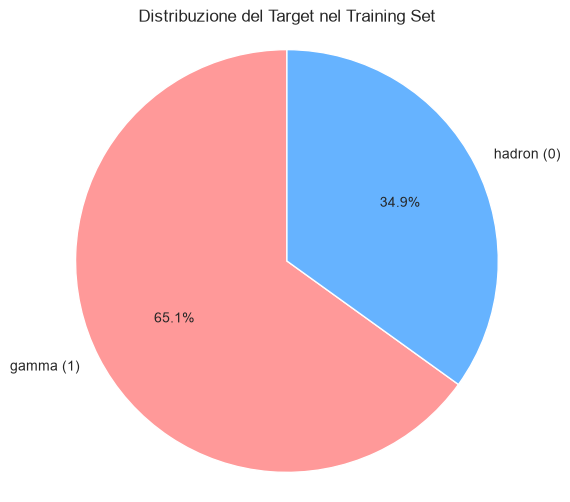

In [5]:
signal_class = df_train['class'].value_counts()
plt.figure(figsize=(6, 6))
plt.pie(signal_class, labels=['gamma (1)', 'hadron (0)'],
        autopct='%1.1f%%', startangle=90, colors=['#ff9999', '#66b3ff'])
plt.title('Distribuzione del Target nel Training Set')
plt.axis('equal'); plt.show()

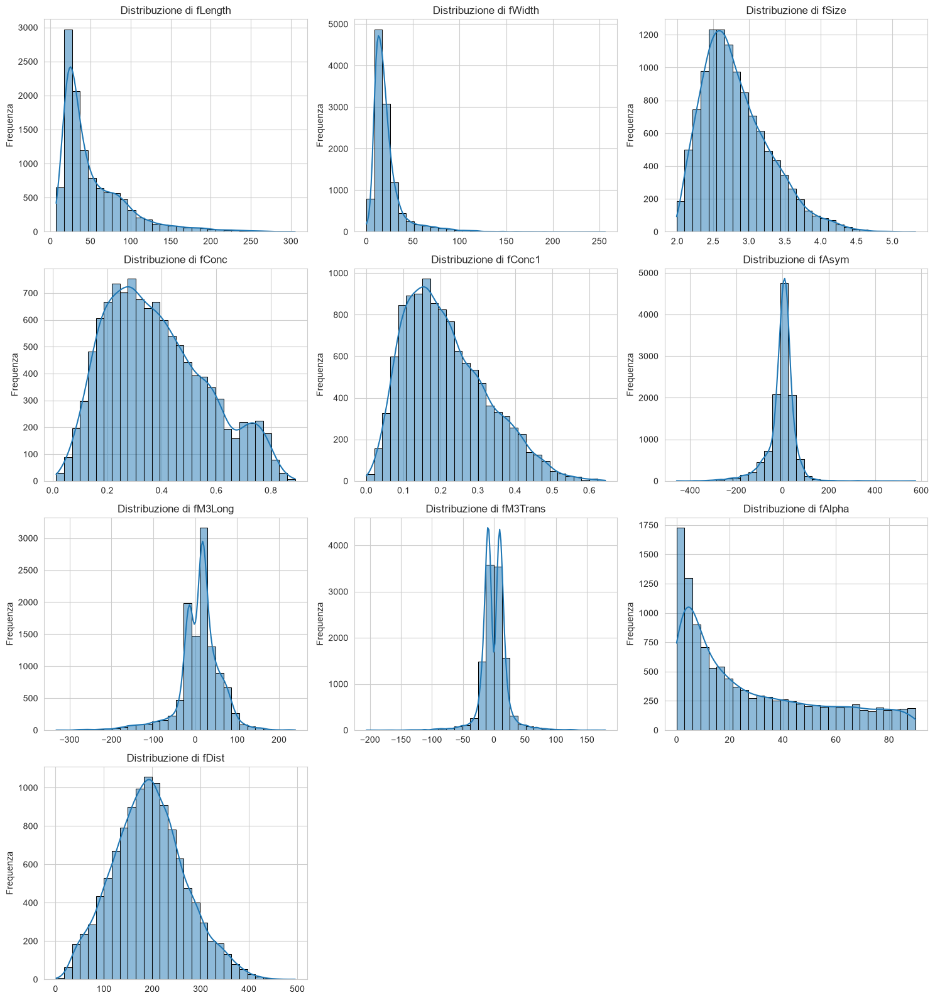

In [6]:
numeric_cols = [c for c in df_train.select_dtypes(include=['float64', 'int64']).columns if c != 'class']
n_cols = 3
n_rows = math.ceil(len(numeric_cols) / n_cols)
plt.figure(figsize=(15, 4 * n_rows))
for i, col in enumerate(numeric_cols):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.histplot(df_train[col], kde=True, bins=30, edgecolor='black')
    plt.title(f'Distribuzione di {col}'); plt.xlabel(''); plt.ylabel('Frequenza')
plt.tight_layout(); plt.show()

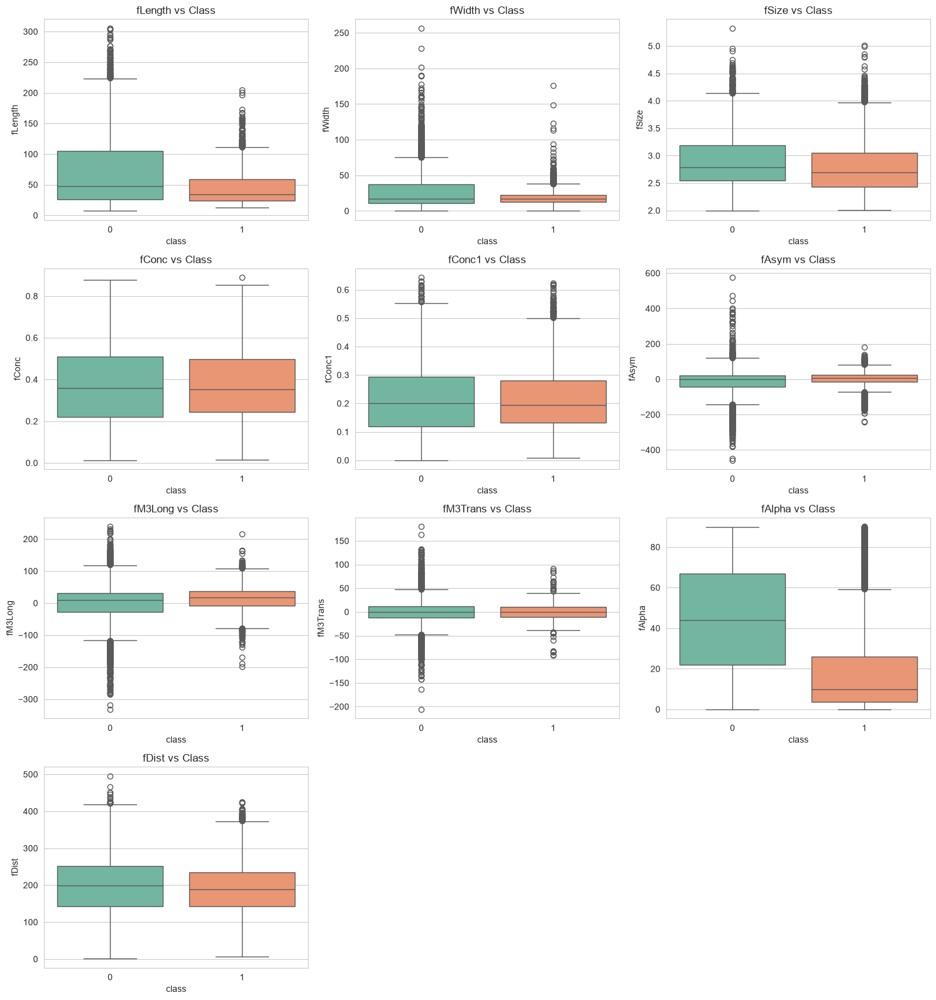

In [7]:
plt.figure(figsize=(15, 4 * n_rows))
for i, col in enumerate(numeric_cols):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.boxplot(x='class', y=col, hue='class', data=df_train, palette='Set2', legend=False)
    plt.title(f'{col} vs Class')
plt.tight_layout(); plt.show()

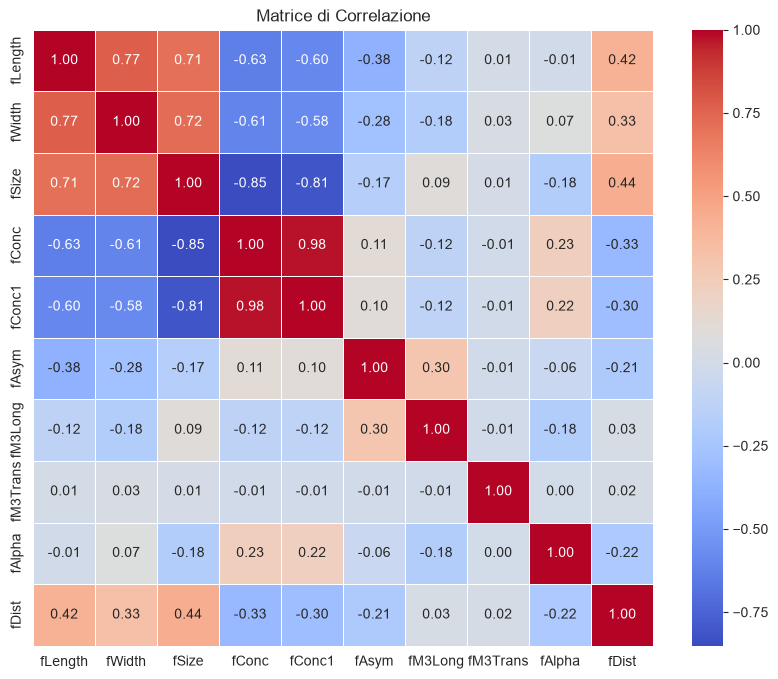

In [8]:
plt.figure(figsize=(10, 8))
sns.heatmap(df_train[numeric_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)
plt.title('Matrice di Correlazione'); plt.show()

# Preprocessing e Scalatura

In [9]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled   = scaler.transform(X_val)
X_test_scaled  = scaler.transform(X_test)

y_train = y_train.astype('int64')
y_val   = y_val.astype('int64')
y_test  = y_test.astype('int64')

feature_names = list(X.columns)
print('Scaling completato. Feature:', feature_names)

Scaling completato. Feature: ['fLength', 'fWidth', 'fSize', 'fConc', 'fConc1', 'fAsym', 'fM3Long', 'fM3Trans', 'fAlpha', 'fDist']


# Funzioni di Noise Injection

In [10]:
def add_gaussian_noise(X, noise_level=0.1, seed=42, cols=None):
    rng = np.random.default_rng(seed)
    if cols is None:
        return X + rng.normal(0.0, noise_level, size=X.shape)
    X_noisy = X.copy()
    cols = list(cols)
    X_noisy[:, cols] += rng.normal(0.0, noise_level, size=(X.shape[0], len(cols)))
    return X_noisy


def add_label_noise_random(y, noise_level=0.1, seed=42):
    rng = np.random.default_rng(seed)
    y_noisy = np.array(y).copy()
    n_flips = int(len(y_noisy) * noise_level)
    idx = rng.choice(len(y_noisy), size=n_flips, replace=False)
    y_noisy[idx] = 1 - y_noisy[idx]
    return y_noisy

add_label_noise = add_label_noise_random  # alias retrocompatibile


def add_label_noise_borderline(X_scaled, y, noise_level=0.1, seed=42):
    """Inverte le etichette dei campioni piu' vicini al centroide della classe opposta."""
    y_arr = np.array(y).copy()
    n_flips = int(len(y_arr) * noise_level)
    centroids = {c: X_scaled[y_arr == c].mean(axis=0) for c in [0, 1]}
    distances = np.array([np.linalg.norm(X_scaled[i] - centroids[1 - y_arr[i]])
                          for i in range(len(y_arr))])
    borderline_idx = np.argsort(distances)[:n_flips]
    y_arr[borderline_idx] = 1 - y_arr[borderline_idx]
    return y_arr


def add_missing_values(X, missing_rate=0.1, seed=42):
    rng = np.random.default_rng(seed)
    X_missing = X.astype(float).copy()
    X_missing[rng.random(X.shape) < missing_rate] = np.nan
    return X_missing


def impute_missing(X_train_m, X_test_m, strategy='mean'):
    imp = SimpleImputer(strategy=strategy)
    return imp.fit_transform(X_train_m), imp.transform(X_test_m)


def impute_train_val_test(X_tr, X_val, X_te, strategy='mean'):
    """Un solo imputer fittato sul train, applicato a val e test (no leakage)."""
    imp = SimpleImputer(strategy=strategy)
    X_tr_i = imp.fit_transform(X_tr)
    return X_tr_i, imp.transform(X_val), imp.transform(X_te)


def add_outliers(X, outlier_rate=0.05, magnitude=5.0, seed=42):
    rng = np.random.default_rng(seed)
    X_out = X.copy()
    n_out = int(len(X_out) * outlier_rate)
    idx = rng.choice(len(X_out), size=n_out, replace=False)
    sign = rng.choice([-1, 1], size=(n_out, X_out.shape[1]))
    X_out[idx] = sign * magnitude
    return X_out


def winsorize_features(X, limits=(0.05, 0.05)):
    """Tronca le code (5% per lato) di ogni feature: attenua gli outlier senza eliminarli."""
    return np.column_stack([np.asarray(winsorize(X[:, j], limits=limits))
                            for j in range(X.shape[1])])


def impute_outliers(X, thresh=4.0, strategy='median'):
    """Marca come NaN i valori |z|>thresh e li imputa (mediana)."""
    Xc = X.astype(float).copy()
    Xc[np.abs(Xc) > thresh] = np.nan
    return SimpleImputer(strategy=strategy).fit_transform(Xc)


def delete_feature(X, feature_idx):
    """Azzera una o piu' feature (sensore guasto). feature_idx: int o lista."""
    X_del = X.copy()
    idxs = [feature_idx] if np.isscalar(feature_idx) else list(feature_idx)
    for fi in idxs:
        X_del[:, fi] = 0.0
    return X_del


NOISE_LEVELS = [0.10, 0.25, 0.40]
print('Funzioni di noise definite OK | livelli:', NOISE_LEVELS)

Funzioni di noise definite OK | livelli: [0.1, 0.25, 0.4]


# Modelli

In [11]:
def train_base_network(X_tr, y_tr, X_val, y_val, epochs=75, batch_size=32, verbose=0, random_state=42):
    tf.keras.utils.set_random_seed(random_state)
    model = Sequential([
        Input(shape=(X_tr.shape[1],)),
        Dense(32, activation='relu'),
        Dense(16, activation='relu'),
        Dense(1, activation='sigmoid'),
    ])
    model.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(1e-3), metrics=['accuracy'])
    history = model.fit(X_tr, y_tr, epochs=epochs, batch_size=batch_size,
                        validation_data=(X_val, y_val), verbose=verbose)
    return model, history


def train_pro_network(X_tr, y_tr, X_val, y_val, epochs=150, batch_size=32, verbose=0,
                      dropout_rate=0.2, l2_lambda=1e-4, patience=15, random_state=42):
    tf.keras.utils.set_random_seed(random_state)
    model = Sequential([
        Input(shape=(X_tr.shape[1],)),
        Dense(32, activation='relu', kernel_regularizer=l2(l2_lambda)),
        Dropout(dropout_rate),
        Dense(16, activation='relu', kernel_regularizer=l2(l2_lambda)),
        Dropout(dropout_rate),
        Dense(1, activation='sigmoid'),
    ])
    model.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(1e-3), metrics=['accuracy'])
    classes = np.unique(y_tr)
    weights = compute_class_weight('balanced', classes=classes, y=np.array(y_tr))
    cw = {int(c): w for c, w in zip(classes, weights)}
    es = EarlyStopping(monitor='val_loss', patience=patience, restore_best_weights=True)
    history = model.fit(X_tr, y_tr, epochs=epochs, batch_size=batch_size,
                        validation_data=(X_val, y_val), class_weight=cw,
                        callbacks=[es], verbose=verbose)
    return model, history


def train_random_forest(X_tr, y_tr, n_estimators=200, random_state=42):
    rf = RandomForestClassifier(n_estimators=n_estimators, random_state=random_state, n_jobs=-1)
    rf.fit(X_tr, y_tr)
    return rf

print('Funzioni di training definite OK')

Funzioni di training definite OK


In [12]:
def model_proba(model, X):
    """Probabilita' della classe positiva, unificata per Keras e sklearn."""
    if hasattr(model, 'predict_proba'):          # Random Forest (sklearn)
        return model.predict_proba(X)[:, 1]
    return np.asarray(model.predict(X, verbose=0)).ravel()  # Keras


def evaluate_network(model, history, X_test, y_test, model_name='Modello'):
    """Report completo per una rete Keras: curve train/val + confusion matrix + classification report."""
    print('\n' + '=' * 60)
    print(f' RISULTATI: {model_name}')
    print('=' * 60)
    proba = np.asarray(model.predict(X_test, verbose=0)).ravel()
    y_pred = (proba > 0.5).astype('int64')
    print(f'Test loss: {log_loss(y_test, proba):.4f} - Test accuracy: {accuracy_score(y_test, y_pred):.4f}')

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    axes[0].plot(history.history['accuracy'], label='Train')
    axes[0].plot(history.history['val_accuracy'], label='Validation')
    axes[0].set_title(f'{model_name} - Accuracy'); axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Accuracy')
    axes[0].legend(loc='lower right'); axes[0].grid(True)
    axes[1].plot(history.history['loss'], label='Train')
    axes[1].plot(history.history['val_loss'], label='Validation')
    axes[1].set_title(f'{model_name} - Loss'); axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Loss')
    axes[1].legend(loc='upper right'); axes[1].grid(True)
    plt.tight_layout(); plt.show()

    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted'); plt.ylabel('True'); plt.title(f'Confusion Matrix — {model_name}')
    plt.show()

    print(f'AUC: {roc_auc_score(y_test, proba):.4f}')
    print('\nReport di Classificazione:')
    print(classification_report(y_test, y_pred, zero_division=0))
    print('=' * 60)


def evaluate_rf(model, X_test, y_test, model_name='RF'):
    """Report per Random Forest: confusion matrix + classification report (niente curve)."""
    print('\n' + '=' * 60)
    print(f' RISULTATI: {model_name}')
    print('=' * 60)
    proba = model.predict_proba(X_test)[:, 1]
    y_pred = (proba > 0.5).astype('int64')
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Greens')
    plt.xlabel('Predicted'); plt.ylabel('True'); plt.title(f'Confusion Matrix — {model_name}')
    plt.show()
    print(f'Accuracy: {accuracy_score(y_test, y_pred):.4f}')
    print(f'AUC: {roc_auc_score(y_test, proba):.4f}')
    print('\nReport di Classificazione:')
    print(classification_report(y_test, y_pred, zero_division=0))
    print('=' * 60)

print('Funzioni di valutazione definite OK')

Funzioni di valutazione definite OK


In [13]:
PALETTE = ['#1f77b4', '#d62728', '#2ca02c', '#9467bd', '#ff7f0e', '#8c564b', '#17becf']

# Scala comune dell'asse y per tutti i grafici di confronto (permette il raffronto diretto)
YLIM_CONFRONTO = (0.5, 0.9)


def compute_metrics(model, X_test, y_test):
    proba = model_proba(model, X_test)
    y_pred = (proba > 0.5).astype(int)
    return {
        'accuracy':     accuracy_score(y_test, y_pred),
        'recall_macro': recall_score(y_test, y_pred, average='macro', zero_division=0),
        'f1_macro':     f1_score(y_test, y_pred, average='macro', zero_division=0),
        'auc':          roc_auc_score(y_test, proba),
    }


def plot_three_models(df_base, df_pro, df_rf, metric='accuracy', tipo='Feature noise', title=None):
    """Confronto NN base vs NN pro vs RF su una metrica, al variare del livello di rumore."""
    plt.figure(figsize=(10, 5.5))
    for df_, color, label, mark in [
        (df_base, PALETTE[0], 'NN Base', 'o'),
        (df_pro,  PALETTE[1], 'NN Pro',  's'),
        (df_rf,   PALETTE[2], 'RF',      '^'),
    ]:
        d = df_.sort_values('livello')
        plt.plot(d['livello'], d[metric], marker=mark, lw=2.2, color=color, label=label, markersize=8)
    plt.xlabel('Livello di rumore (%)'); plt.ylabel(metric.replace('_', ' ').upper())
    plt.ylim(*YLIM_CONFRONTO)
    plt.title(title or f'Confronto modelli — {tipo} ({metric})', fontweight='bold')
    plt.grid(alpha=0.3); plt.legend(frameon=True); plt.tight_layout(); plt.show()


def plot_aggregate_per_model(model_name, dfs_by_noise, metric='accuracy'):
    """Una figura per modello: una linea per tipo di rumore (x = livello)."""
    plt.figure(figsize=(10, 6))
    for (noise_name, df_), color in zip(dfs_by_noise.items(), PALETTE):
        d = df_.sort_values('livello')
        plt.plot(d['livello'], d[metric], marker='o', lw=2, color=color, label=noise_name)
    plt.xlabel('Livello di rumore (%)'); plt.ylabel(metric.replace('_', ' ').upper())
    plt.ylim(*YLIM_CONFRONTO)
    plt.title(f'{model_name} — robustezza per tipo di rumore ({metric})', fontweight='bold')
    plt.grid(alpha=0.3); plt.legend(frameon=True, fontsize=9); plt.tight_layout(); plt.show()


def run_noise_section(noise_name, make_data, levels=NOISE_LEVELS, evaluate=True, seed=42):
    """Driver: addestra NN base, NN pro, RF su baseline + livelli, emette i report completi
    e i grafici di confronto, e restituisce {'NN base': df, 'NN pro': df, 'RF': df}.

    make_data(lvl, seed) -> (X_tr, y_tr, X_val, y_val, X_te, y_te)
    """
    rows = {'NN base': [], 'NN pro': [], 'RF': []}
    for lvl in [0.0] + list(levels):
        Xtr, ytr, Xval, yval, Xte, yte = make_data(lvl, seed)
        livello = int(round(lvl * 100))
        key = 'Baseline' if lvl == 0 else f'Rumore {livello}%'

        mb, hb = train_base_network(Xtr, ytr, Xval, yval, random_state=seed)
        mp, hp = train_pro_network(Xtr, ytr, Xval, yval, random_state=seed)
        mr = train_random_forest(Xtr, ytr, random_state=seed)

        if evaluate:
            evaluate_network(mb, hb, Xte, yte, f'NN base — {noise_name} {key}')
            evaluate_network(mp, hp, Xte, yte, f'NN pro — {noise_name} {key}')
            evaluate_rf(mr, Xte, yte, f'RF — {noise_name} {key}')

        for name, model in [('NN base', mb), ('NN pro', mp), ('RF', mr)]:
            rows[name].append({'modello': name, 'tipo_rumore': noise_name,
                               'livello': livello, **compute_metrics(model, Xte, yte)})

    dfs = {m: pd.DataFrame(rows[m]).sort_values('livello').reset_index(drop=True) for m in rows}
    print(f'\n>>> Confronto modelli — {noise_name}')
    plot_three_models(dfs['NN base'], dfs['NN pro'], dfs['RF'], 'accuracy', noise_name)
    plot_three_models(dfs['NN base'], dfs['NN pro'], dfs['RF'], 'f1_macro', noise_name)
    return dfs

print('Driver e funzioni di plotting definiti OK')

Driver e funzioni di plotting definiti OK


## Baseline su dati puliti

>>> BASELINE su dati puliti

 RISULTATI: NN base — Baseline pulita
Test loss: 0.3236 - Test accuracy: 0.8678


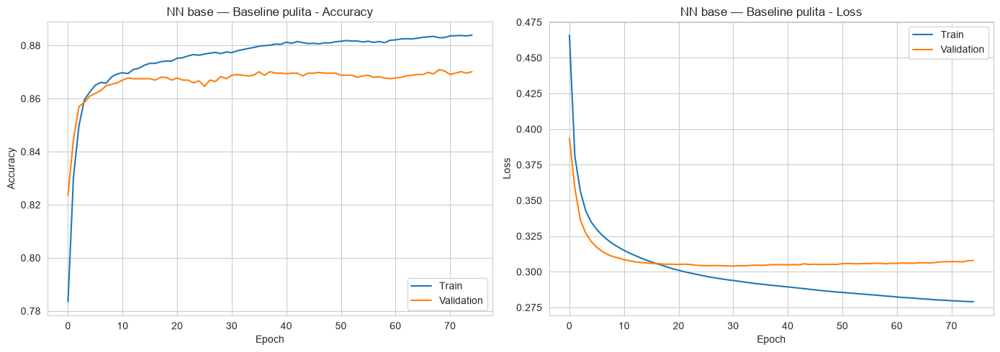

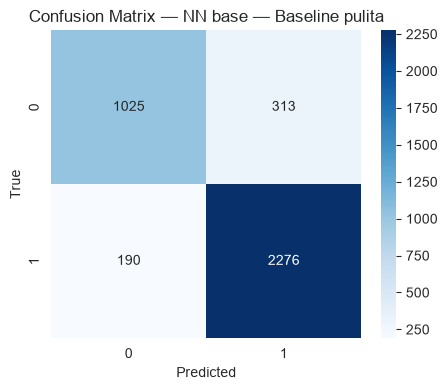

AUC: 0.9214

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.77      0.80      1338
           1       0.88      0.92      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.87      0.87      0.87      3804


 RISULTATI: NN pro — Baseline pulita
Test loss: 0.3321 - Test accuracy: 0.8601


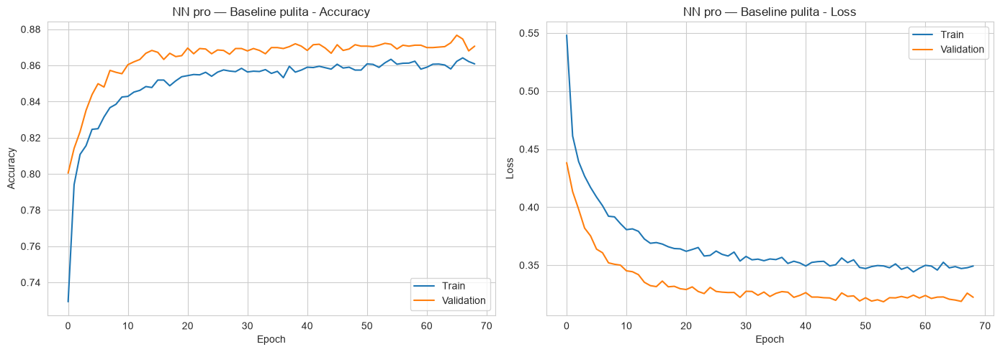

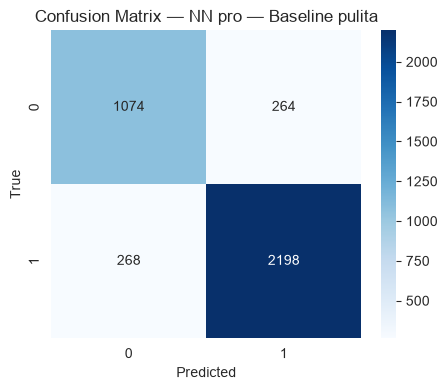

AUC: 0.9238

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.85      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Baseline pulita


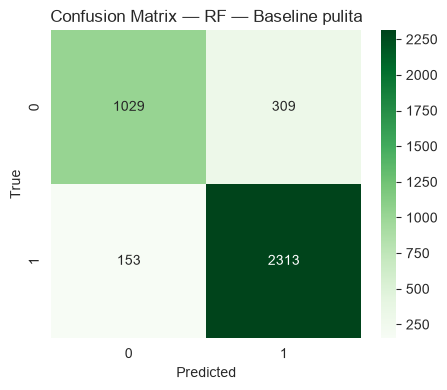

Accuracy: 0.8785
AUC: 0.9300

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.77      0.82      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.88      3804



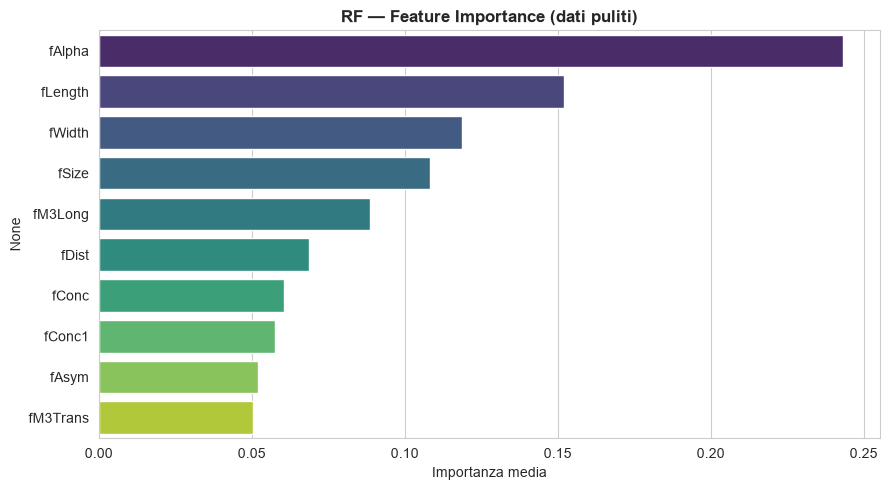

In [14]:
print('>>> BASELINE su dati puliti')
m_base_clean, h_base_clean = train_base_network(X_train_scaled, y_train, X_val_scaled, y_val, random_state=seed)
evaluate_network(m_base_clean, h_base_clean, X_test_scaled, y_test, 'NN base — Baseline pulita')

m_pro_clean, h_pro_clean = train_pro_network(X_train_scaled, y_train, X_val_scaled, y_val, random_state=seed)
evaluate_network(m_pro_clean, h_pro_clean, X_test_scaled, y_test, 'NN pro — Baseline pulita')

rf_clean = train_random_forest(X_train_scaled, y_train, random_state=seed)
evaluate_rf(rf_clean, X_test_scaled, y_test, 'RF — Baseline pulita')

fi = pd.Series(rf_clean.feature_importances_, index=feature_names).sort_values(ascending=False)
plt.figure(figsize=(9, 5))
sns.barplot(x=fi.values, y=fi.index, palette='viridis')
plt.title('RF — Feature Importance (dati puliti)', fontweight='bold')
plt.xlabel('Importanza media'); plt.tight_layout(); plt.show()

# Dizionario che raccoglie il df canonico di ogni rumore, per il confronto aggregato finale
AGG = {'NN base': {}, 'NN pro': {}, 'RF': {}}

# Sezione A — Feature Noise (rumore gaussiano)


 RISULTATI: NN base — Feature noise Baseline
Test loss: 0.3236 - Test accuracy: 0.8678


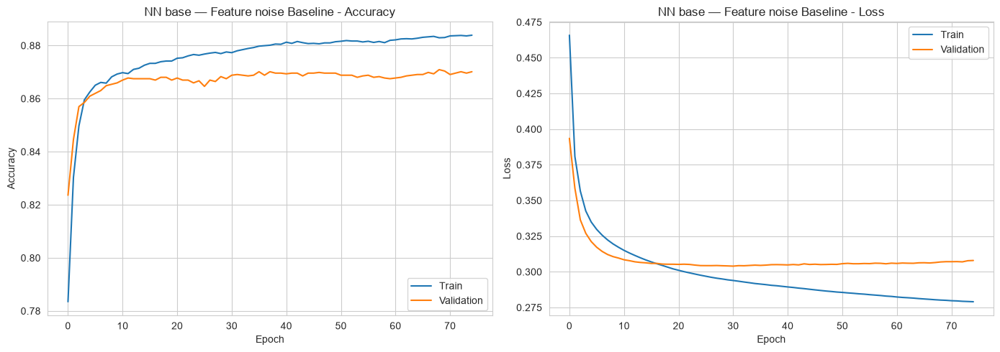

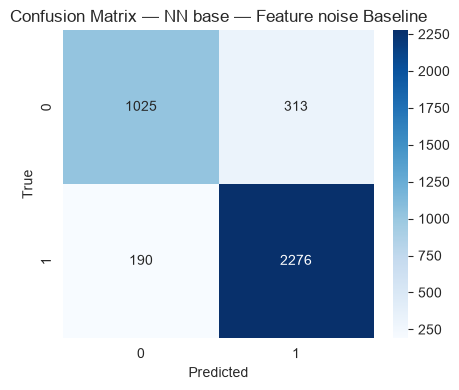

AUC: 0.9214

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.77      0.80      1338
           1       0.88      0.92      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.87      0.87      0.87      3804


 RISULTATI: NN pro — Feature noise Baseline
Test loss: 0.3321 - Test accuracy: 0.8601


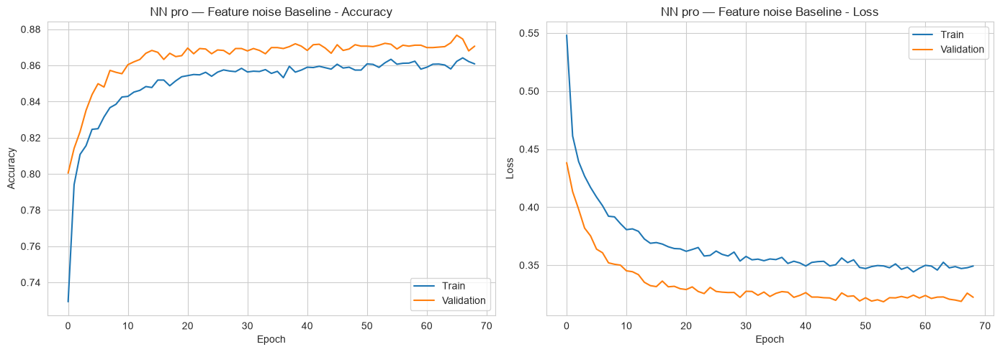

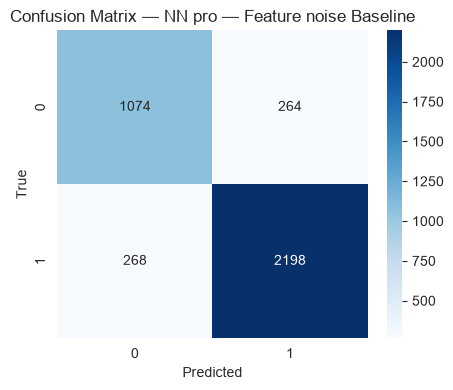

AUC: 0.9238

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.85      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Feature noise Baseline


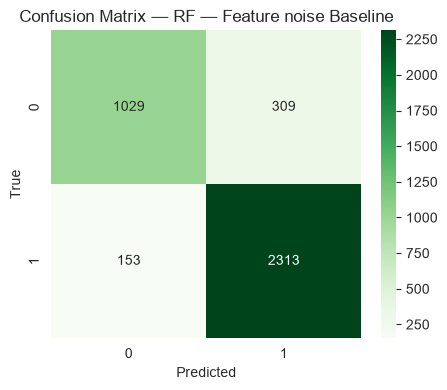

Accuracy: 0.8785
AUC: 0.9300

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.77      0.82      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.88      3804


 RISULTATI: NN base — Feature noise Rumore 10%
Test loss: 0.3275 - Test accuracy: 0.8657


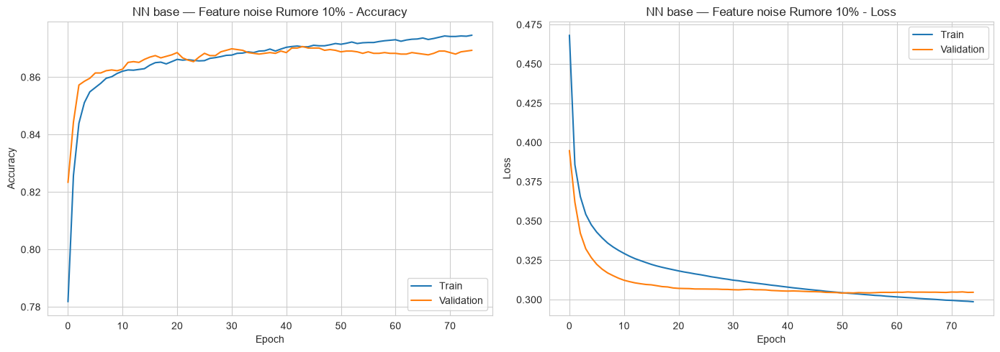

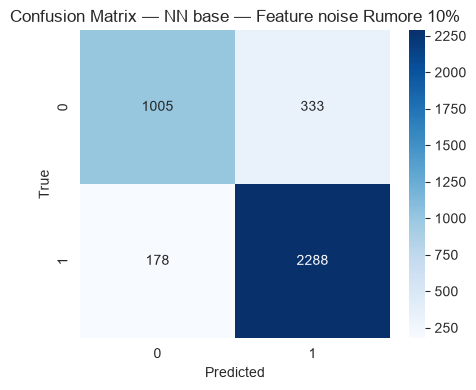

AUC: 0.9187

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.85      0.75      0.80      1338
           1       0.87      0.93      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.86      0.87      0.86      3804


 RISULTATI: NN pro — Feature noise Rumore 10%
Test loss: 0.3363 - Test accuracy: 0.8636


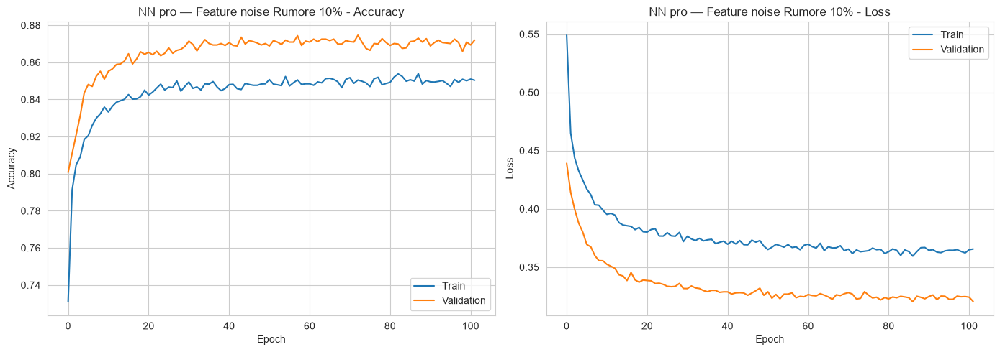

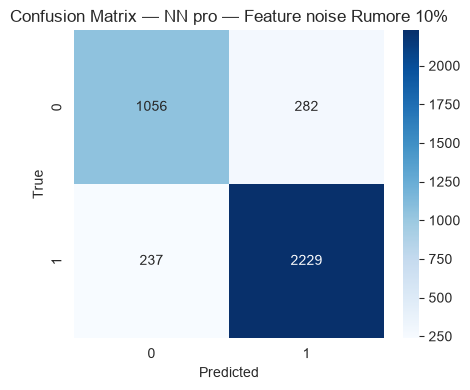

AUC: 0.9204

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.82      0.79      0.80      1338
           1       0.89      0.90      0.90      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.85      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Feature noise Rumore 10%


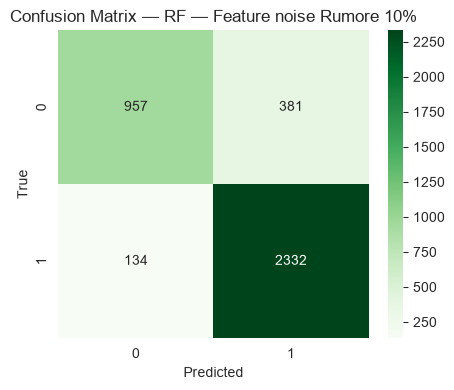

Accuracy: 0.8646
AUC: 0.9222

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.88      0.72      0.79      1338
           1       0.86      0.95      0.90      2466

    accuracy                           0.86      3804
   macro avg       0.87      0.83      0.84      3804
weighted avg       0.87      0.86      0.86      3804


 RISULTATI: NN base — Feature noise Rumore 25%
Test loss: 0.3513 - Test accuracy: 0.8520


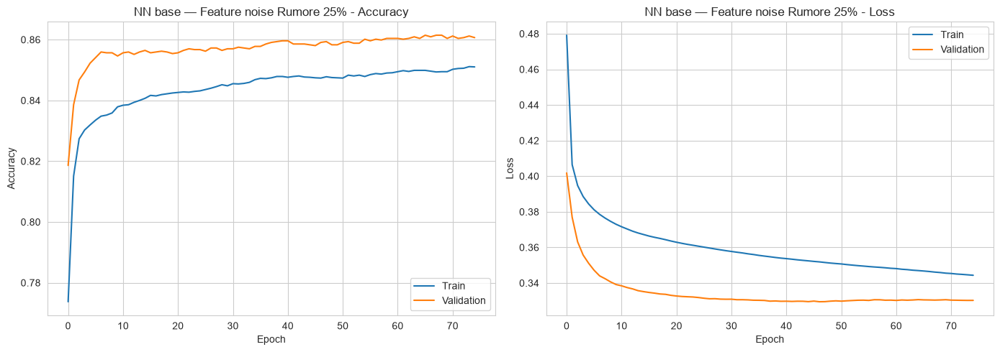

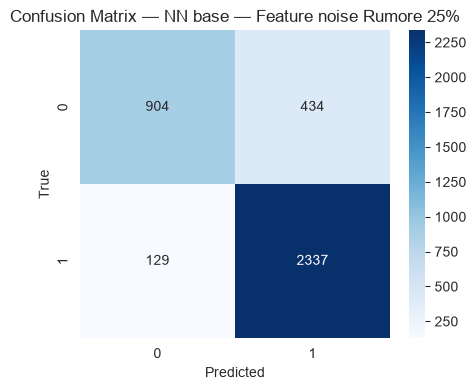

AUC: 0.9074

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.88      0.68      0.76      1338
           1       0.84      0.95      0.89      2466

    accuracy                           0.85      3804
   macro avg       0.86      0.81      0.83      3804
weighted avg       0.85      0.85      0.85      3804


 RISULTATI: NN pro — Feature noise Rumore 25%
Test loss: 0.3630 - Test accuracy: 0.8465


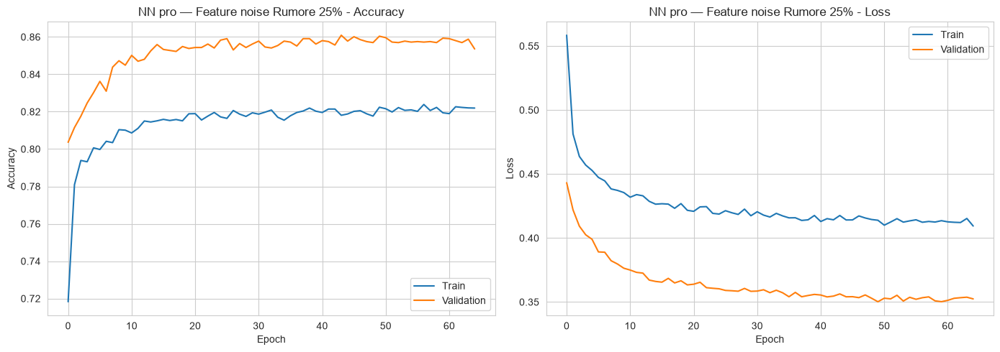

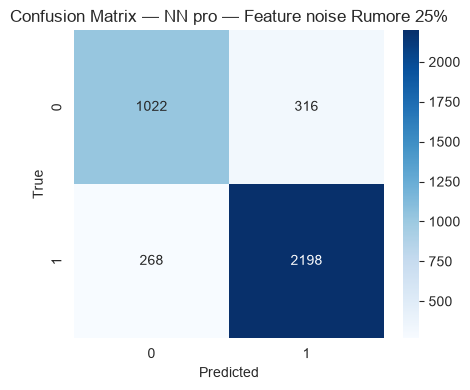

AUC: 0.9071

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.79      0.76      0.78      1338
           1       0.87      0.89      0.88      2466

    accuracy                           0.85      3804
   macro avg       0.83      0.83      0.83      3804
weighted avg       0.85      0.85      0.85      3804


 RISULTATI: RF — Feature noise Rumore 25%


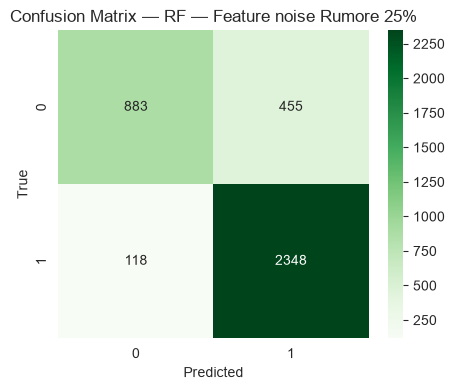

Accuracy: 0.8494
AUC: 0.9041

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.88      0.66      0.76      1338
           1       0.84      0.95      0.89      2466

    accuracy                           0.85      3804
   macro avg       0.86      0.81      0.82      3804
weighted avg       0.85      0.85      0.84      3804


 RISULTATI: NN base — Feature noise Rumore 40%
Test loss: 0.3810 - Test accuracy: 0.8328


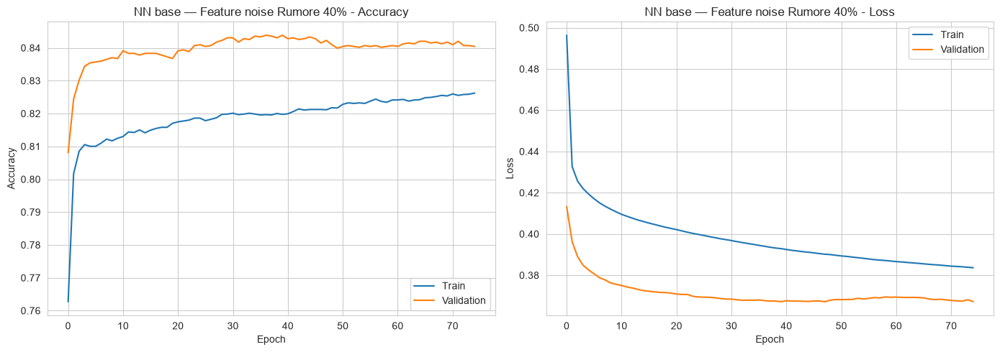

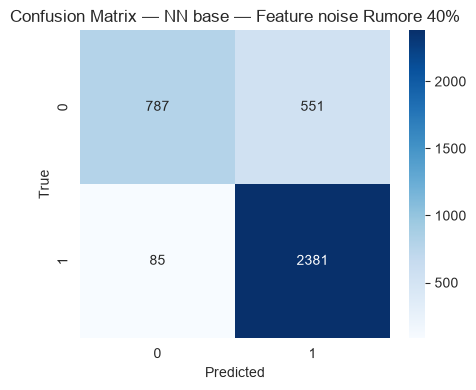

AUC: 0.8941

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.90      0.59      0.71      1338
           1       0.81      0.97      0.88      2466

    accuracy                           0.83      3804
   macro avg       0.86      0.78      0.80      3804
weighted avg       0.84      0.83      0.82      3804


 RISULTATI: NN pro — Feature noise Rumore 40%
Test loss: 0.3892 - Test accuracy: 0.8417


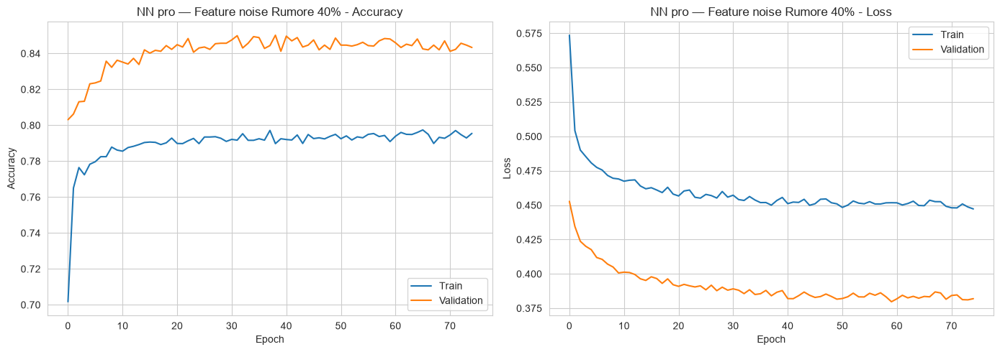

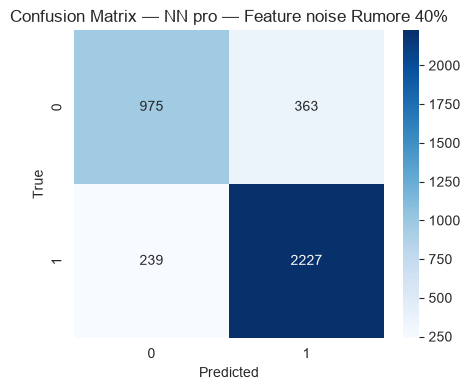

AUC: 0.8940

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.73      0.76      1338
           1       0.86      0.90      0.88      2466

    accuracy                           0.84      3804
   macro avg       0.83      0.82      0.82      3804
weighted avg       0.84      0.84      0.84      3804


 RISULTATI: RF — Feature noise Rumore 40%


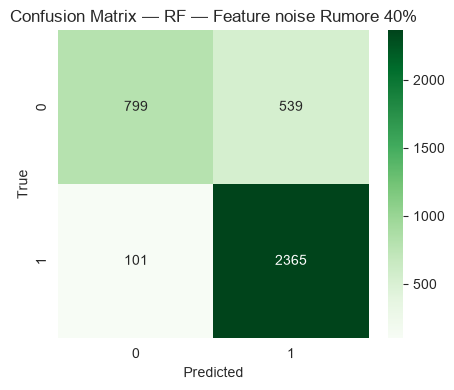

Accuracy: 0.8318
AUC: 0.8913

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.89      0.60      0.71      1338
           1       0.81      0.96      0.88      2466

    accuracy                           0.83      3804
   macro avg       0.85      0.78      0.80      3804
weighted avg       0.84      0.83      0.82      3804


>>> Confronto modelli — Feature noise


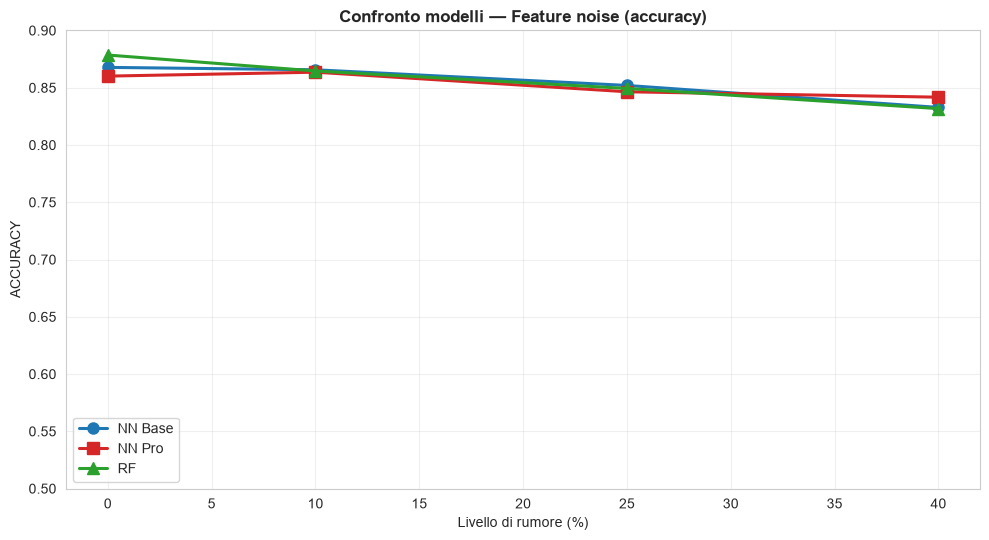

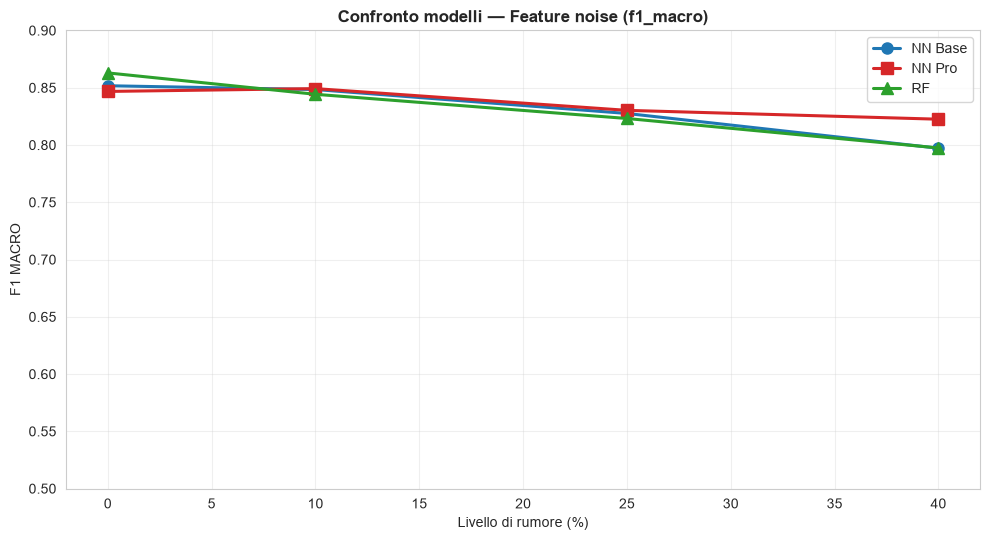

In [15]:
def make_fn(lvl, s):
    Xtr = X_train_scaled if lvl == 0 else add_gaussian_noise(X_train_scaled, noise_level=lvl, seed=s)
    return Xtr, np.array(y_train), X_val_scaled, np.array(y_val), X_test_scaled, np.array(y_test)

dfs_fn = run_noise_section('Feature noise', make_fn, seed=seed)
for m in AGG:
    AGG[m]['Feature noise'] = dfs_fn[m]

  livello 0% -> rumore sigma=0.35 su 0 feature: []

 RISULTATI: NN base — Feature noise localizzato Baseline
Test loss: 0.3236 - Test accuracy: 0.8678


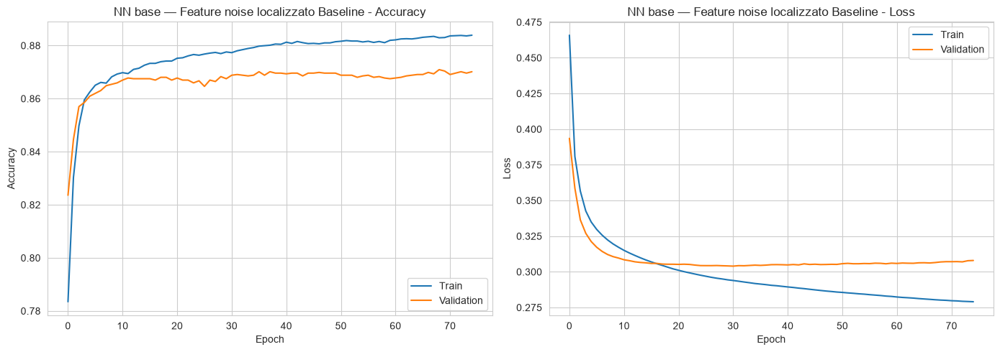

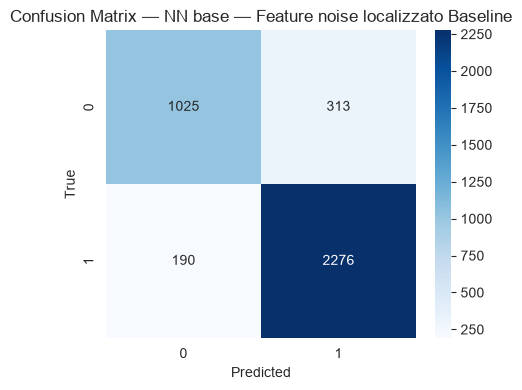

AUC: 0.9214

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.77      0.80      1338
           1       0.88      0.92      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.87      0.87      0.87      3804


 RISULTATI: NN pro — Feature noise localizzato Baseline
Test loss: 0.3321 - Test accuracy: 0.8601


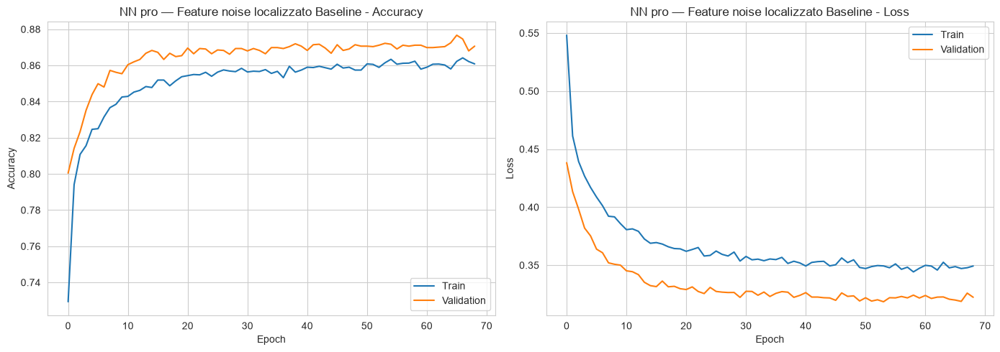

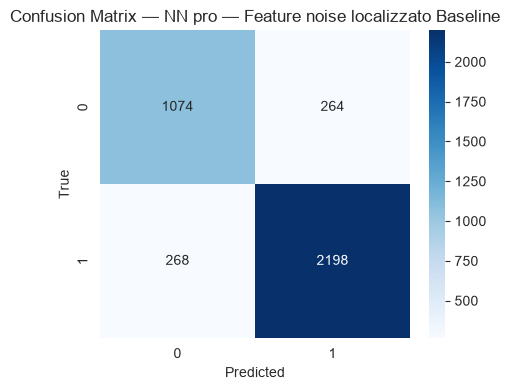

AUC: 0.9238

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.85      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Feature noise localizzato Baseline


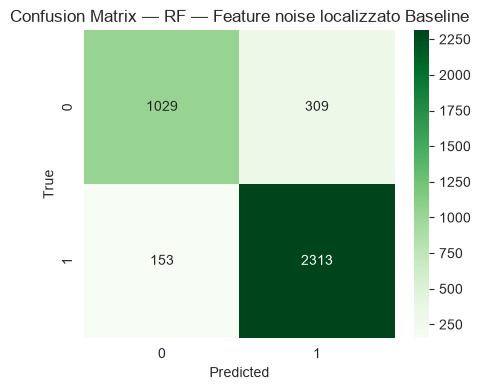

Accuracy: 0.8785
AUC: 0.9300

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.77      0.82      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.88      3804

  livello 10% -> rumore sigma=0.35 su 1 feature: ['fAlpha']

 RISULTATI: NN base — Feature noise localizzato Rumore 10%
Test loss: 0.3242 - Test accuracy: 0.8651


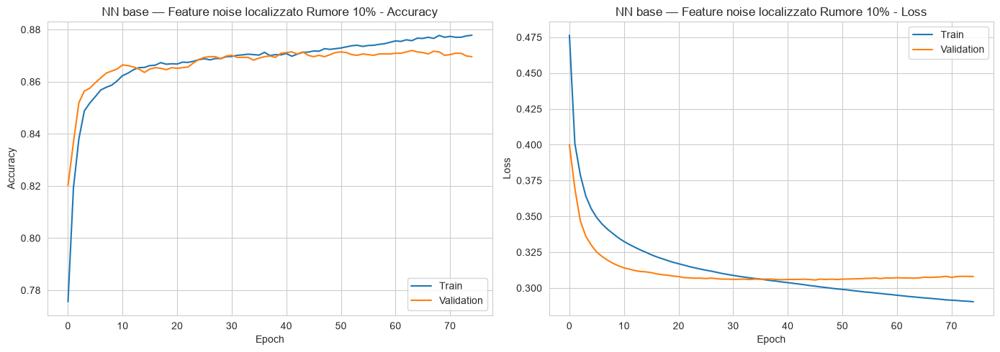

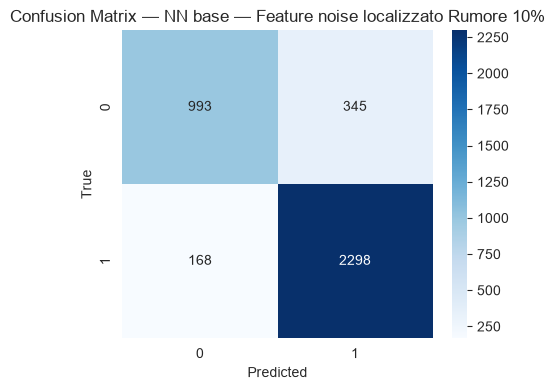

AUC: 0.9211

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.86      0.74      0.79      1338
           1       0.87      0.93      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.86      0.87      0.86      3804


 RISULTATI: NN pro — Feature noise localizzato Rumore 10%
Test loss: 0.3322 - Test accuracy: 0.8651


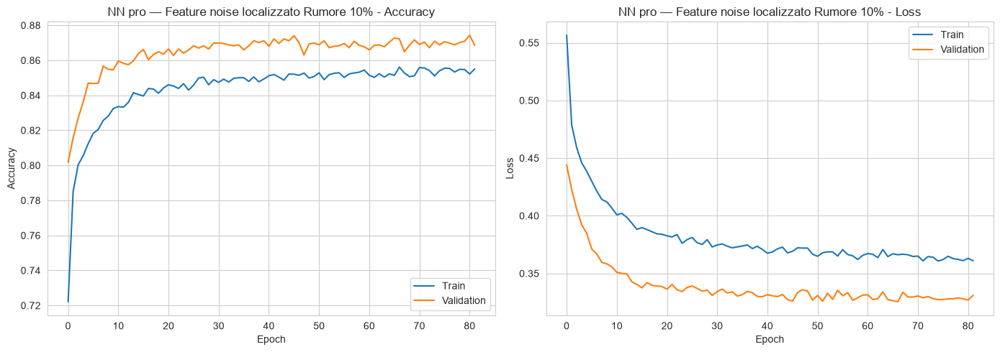

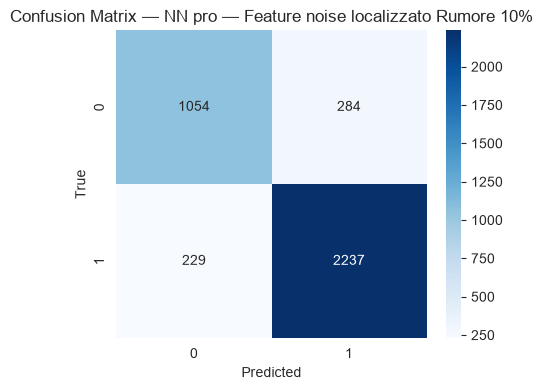

AUC: 0.9243

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.82      0.79      0.80      1338
           1       0.89      0.91      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.85      0.85      0.85      3804
weighted avg       0.86      0.87      0.86      3804


 RISULTATI: RF — Feature noise localizzato Rumore 10%


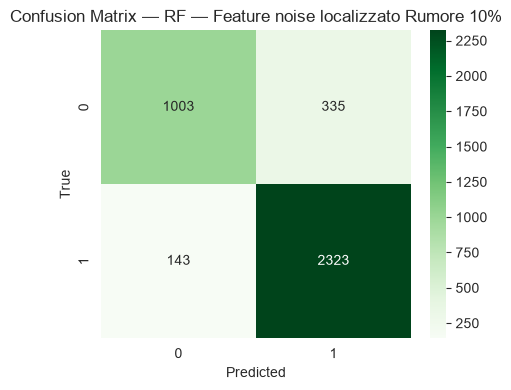

Accuracy: 0.8743
AUC: 0.9274

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.88      0.75      0.81      1338
           1       0.87      0.94      0.91      2466

    accuracy                           0.87      3804
   macro avg       0.87      0.85      0.86      3804
weighted avg       0.87      0.87      0.87      3804

  livello 25% -> rumore sigma=0.35 su 3 feature: ['fAlpha', 'fLength', 'fWidth']

 RISULTATI: NN base — Feature noise localizzato Rumore 25%
Test loss: 0.3566 - Test accuracy: 0.8523


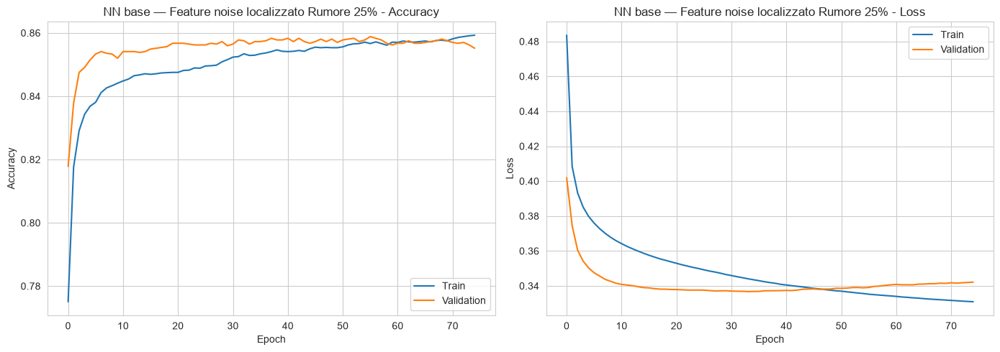

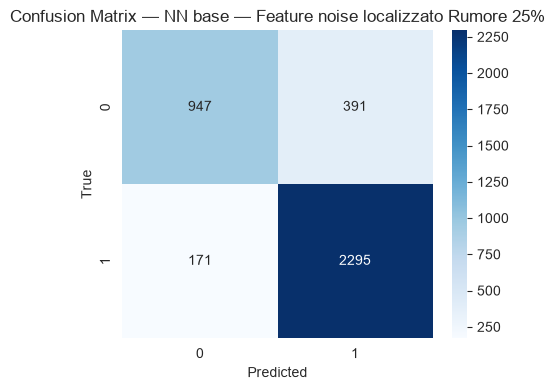

AUC: 0.9043

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.85      0.71      0.77      1338
           1       0.85      0.93      0.89      2466

    accuracy                           0.85      3804
   macro avg       0.85      0.82      0.83      3804
weighted avg       0.85      0.85      0.85      3804


 RISULTATI: NN pro — Feature noise localizzato Rumore 25%
Test loss: 0.3658 - Test accuracy: 0.8478


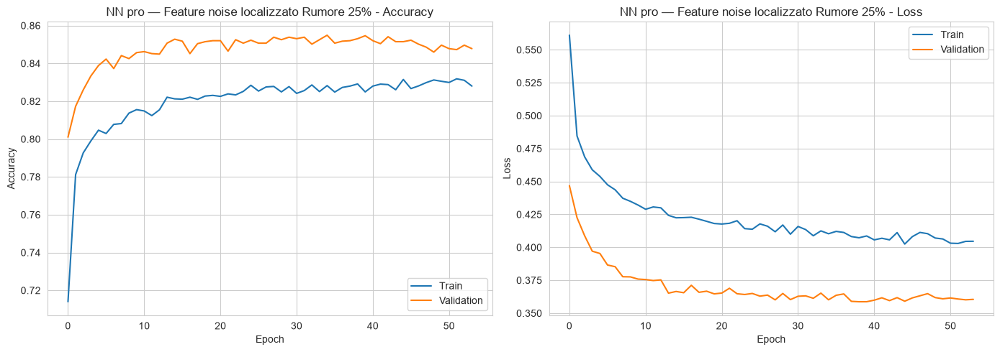

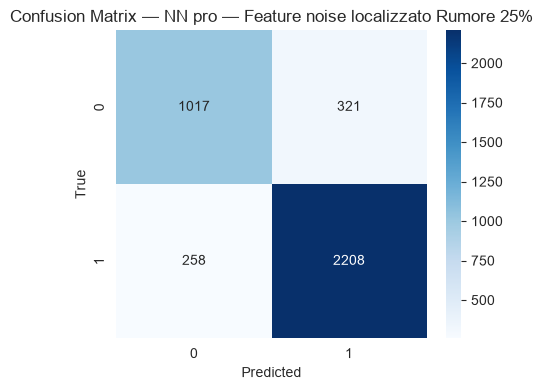

AUC: 0.9058

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.76      0.78      1338
           1       0.87      0.90      0.88      2466

    accuracy                           0.85      3804
   macro avg       0.84      0.83      0.83      3804
weighted avg       0.85      0.85      0.85      3804


 RISULTATI: RF — Feature noise localizzato Rumore 25%


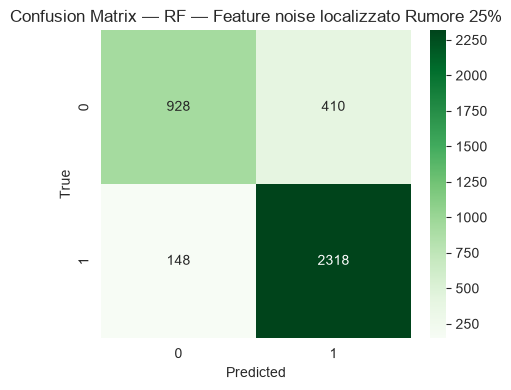

Accuracy: 0.8533
AUC: 0.9056

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.86      0.69      0.77      1338
           1       0.85      0.94      0.89      2466

    accuracy                           0.85      3804
   macro avg       0.86      0.82      0.83      3804
weighted avg       0.85      0.85      0.85      3804

  livello 40% -> rumore sigma=0.35 su 5 feature: ['fAlpha', 'fLength', 'fWidth', 'fSize', 'fM3Long']

 RISULTATI: NN base — Feature noise localizzato Rumore 40%
Test loss: 0.3673 - Test accuracy: 0.8452


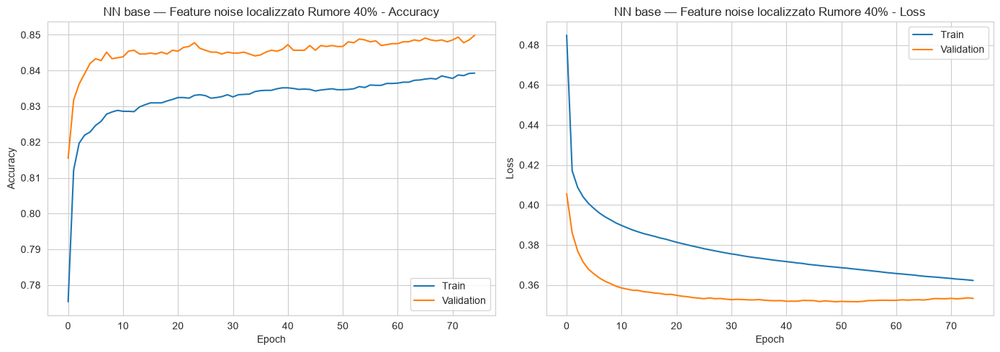

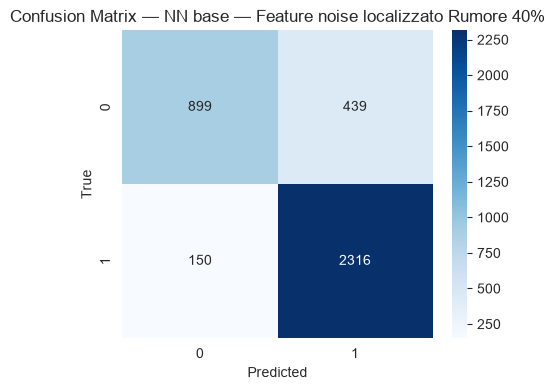

AUC: 0.8991

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.86      0.67      0.75      1338
           1       0.84      0.94      0.89      2466

    accuracy                           0.85      3804
   macro avg       0.85      0.81      0.82      3804
weighted avg       0.85      0.85      0.84      3804


 RISULTATI: NN pro — Feature noise localizzato Rumore 40%
Test loss: 0.3834 - Test accuracy: 0.8386


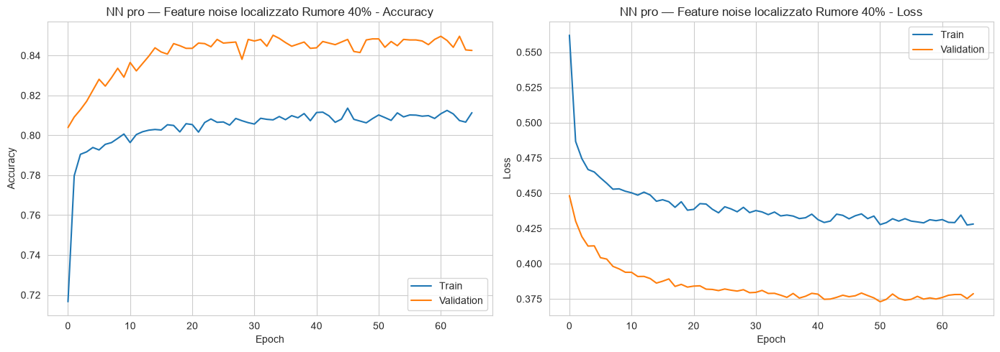

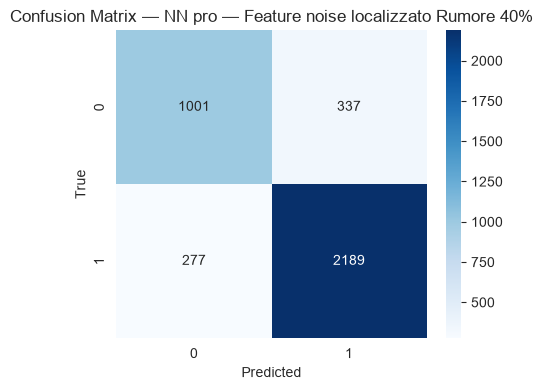

AUC: 0.8973

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.78      0.75      0.77      1338
           1       0.87      0.89      0.88      2466

    accuracy                           0.84      3804
   macro avg       0.82      0.82      0.82      3804
weighted avg       0.84      0.84      0.84      3804


 RISULTATI: RF — Feature noise localizzato Rumore 40%


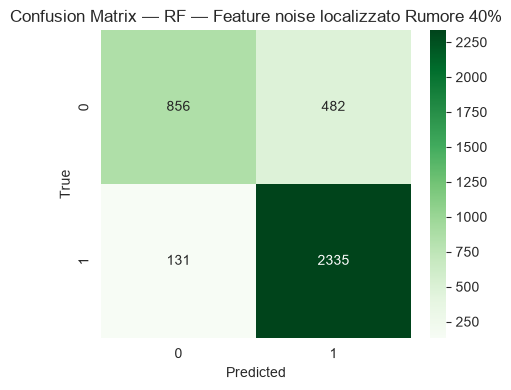

Accuracy: 0.8389
AUC: 0.8931

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.64      0.74      1338
           1       0.83      0.95      0.88      2466

    accuracy                           0.84      3804
   macro avg       0.85      0.79      0.81      3804
weighted avg       0.84      0.84      0.83      3804


>>> Confronto modelli — Feature noise localizzato


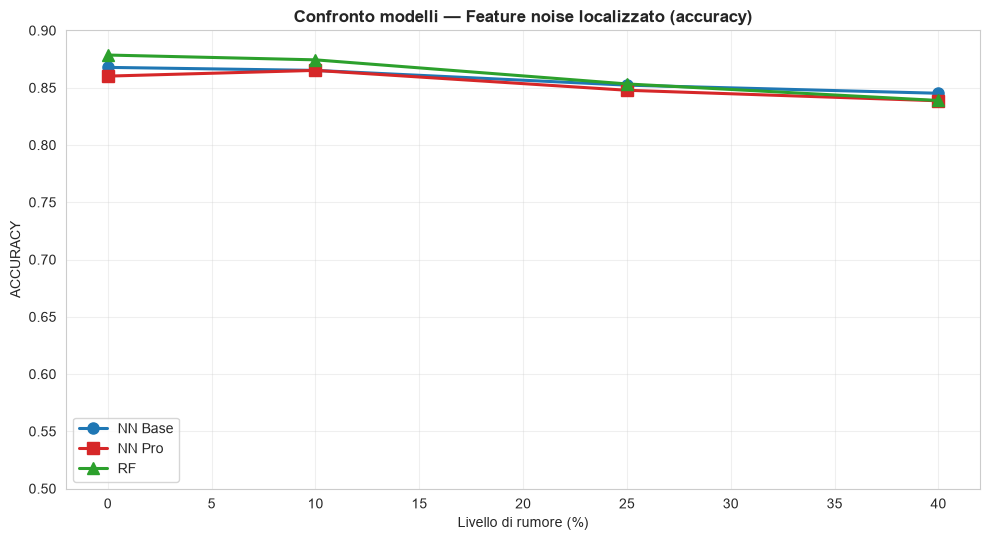

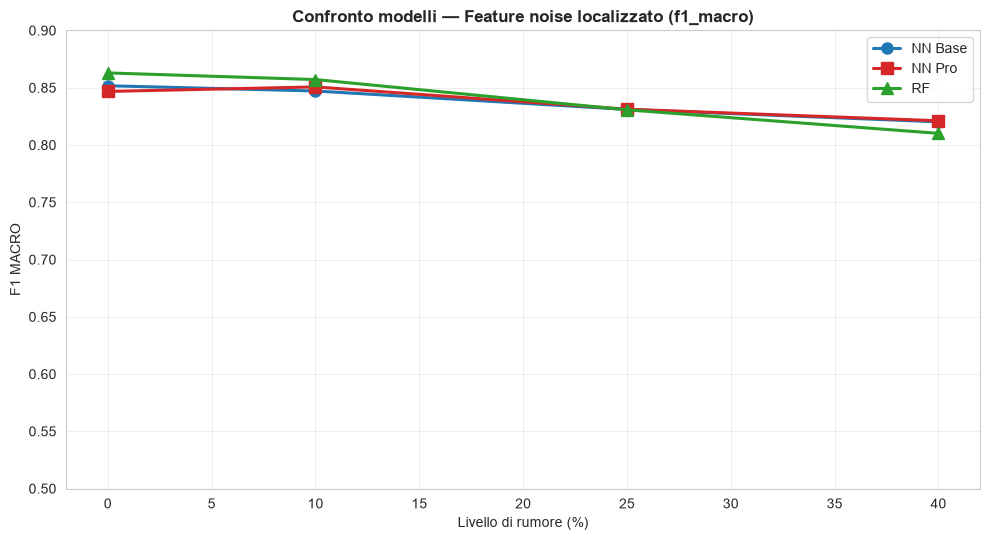

In [16]:
# --- ESTENSIONE: Feature noise localizzato ------------------------------------
# Rumore gaussiano a intensita' FISSA (sigma = 0.35) applicato solo alle feature
# piu' importanti, le stesse del Missing feature. Qui il "livello" indica QUANTE
# feature vengono colpite (k = 1, 3, 5), non l'intensita' del rumore.
SIGMA_FN_LOC = 0.35
top_feats_fnloc = list(fi.index)                 # feature ordinate per importanza (baseline RF)
FNLOC_LEVEL_TO_K = {0: 0, 10: 1, 25: 3, 40: 5}   # stessa mappa del Missing feature

def make_fn_local(lvl, s):
    k = FNLOC_LEVEL_TO_K[int(round(lvl * 100))]
    idxs = [feature_names.index(f) for f in top_feats_fnloc[:k]]
    Xtr = X_train_scaled if not idxs else add_gaussian_noise(X_train_scaled, noise_level=SIGMA_FN_LOC, seed=s, cols=idxs)
    print(f'  livello {int(round(lvl*100))}% -> rumore sigma={SIGMA_FN_LOC} su {k} feature: {top_feats_fnloc[:k]}')
    return Xtr, np.array(y_train), X_val_scaled, np.array(y_val), X_test_scaled, np.array(y_test)

dfs_fn_local = run_noise_section('Feature noise localizzato', make_fn_local, seed=seed)
for m in AGG:
    AGG[m]['Feature noise localizzato'] = dfs_fn_local[m]  # incluso nel confronto aggregato (7° colore in PALETTE)

# Sezione B — Label Noise Random


 RISULTATI: NN base — Label noise random Baseline
Test loss: 0.3236 - Test accuracy: 0.8678


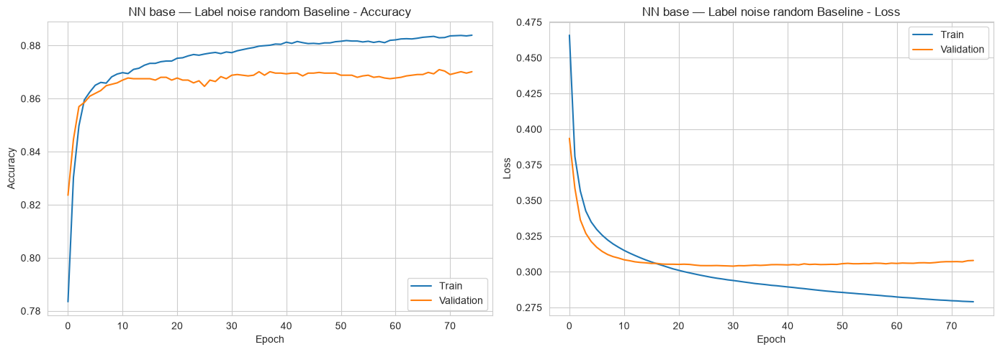

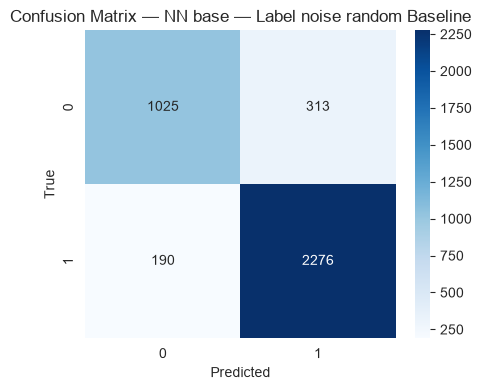

AUC: 0.9214

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.77      0.80      1338
           1       0.88      0.92      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.87      0.87      0.87      3804


 RISULTATI: NN pro — Label noise random Baseline
Test loss: 0.3321 - Test accuracy: 0.8601


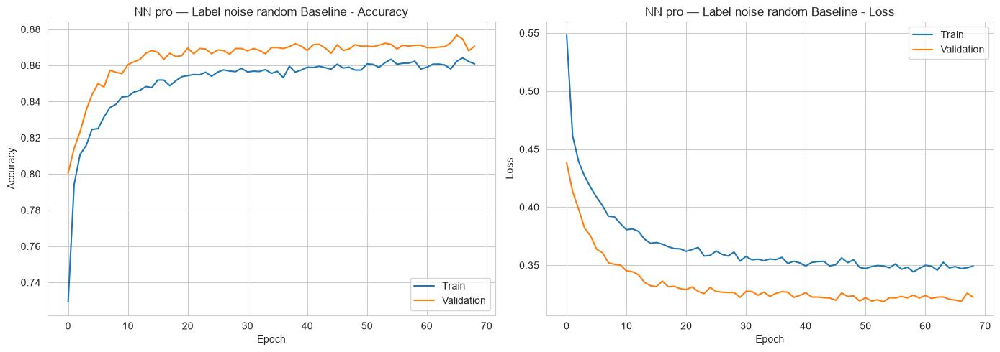

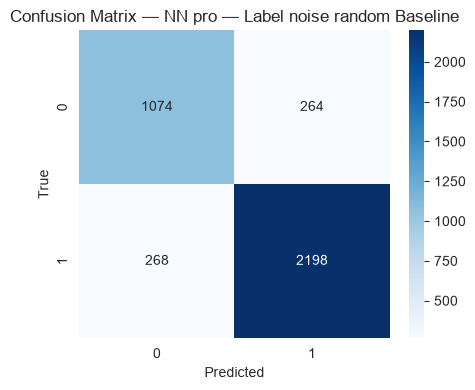

AUC: 0.9238

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.85      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Label noise random Baseline


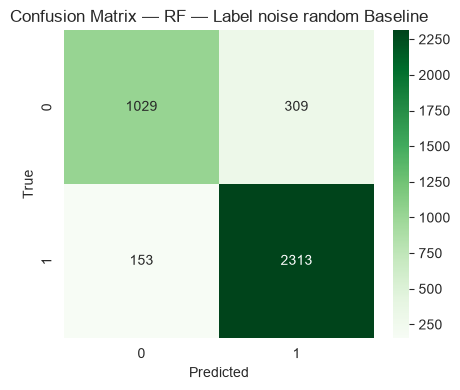

Accuracy: 0.8785
AUC: 0.9300

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.77      0.82      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.88      3804


 RISULTATI: NN base — Label noise random Rumore 10%
Test loss: 0.3551 - Test accuracy: 0.8623


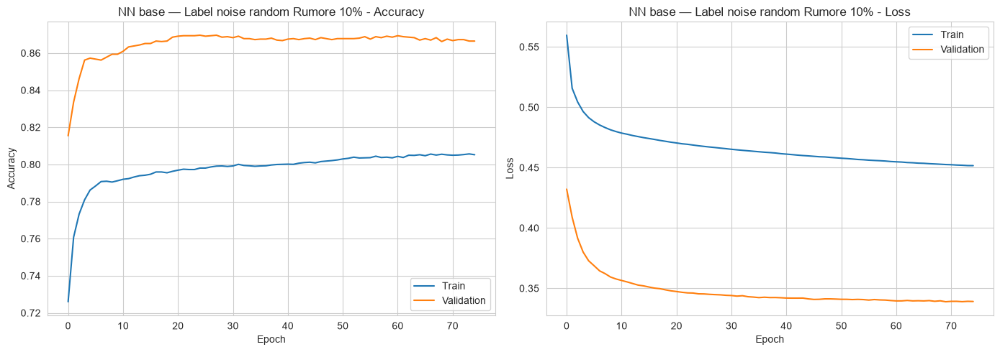

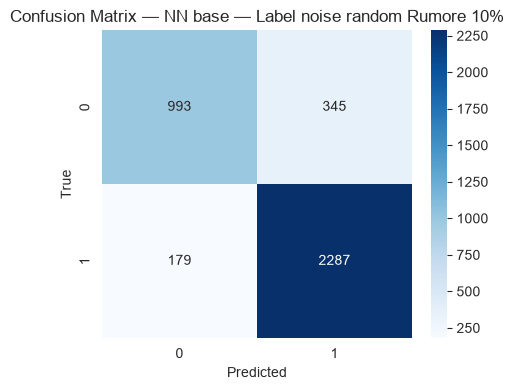

AUC: 0.9128

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.85      0.74      0.79      1338
           1       0.87      0.93      0.90      2466

    accuracy                           0.86      3804
   macro avg       0.86      0.83      0.84      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: NN pro — Label noise random Rumore 10%
Test loss: 0.3908 - Test accuracy: 0.8570


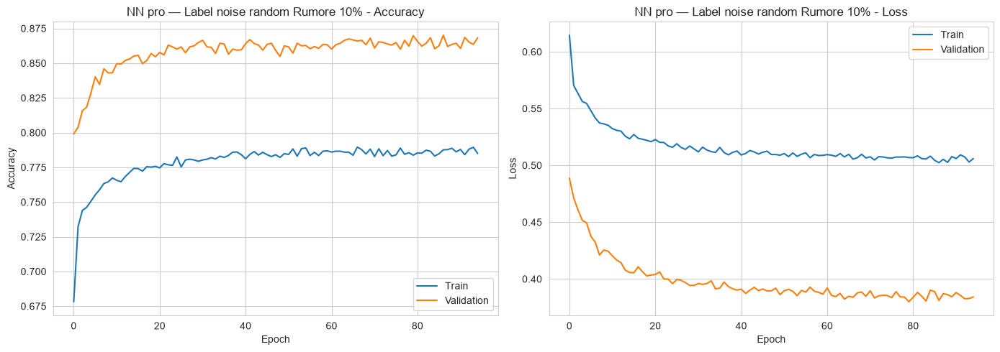

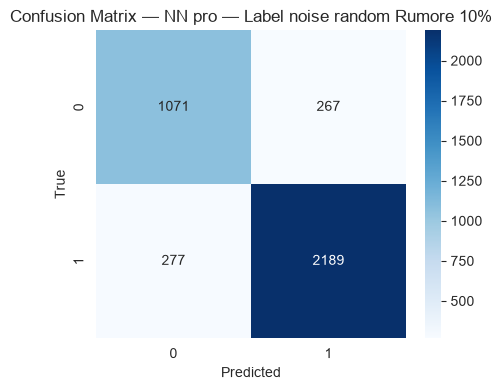

AUC: 0.9200

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.79      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.84      0.84      0.84      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Label noise random Rumore 10%


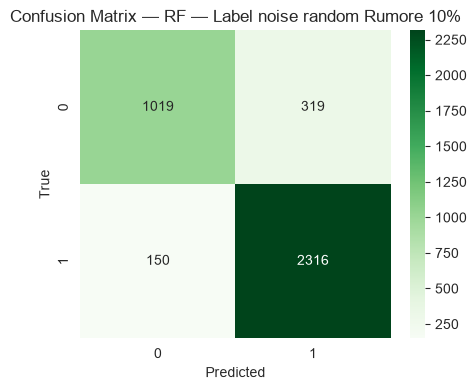

Accuracy: 0.8767
AUC: 0.9214

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.76      0.81      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.87      3804


 RISULTATI: NN base — Label noise random Rumore 25%
Test loss: 0.4752 - Test accuracy: 0.8410


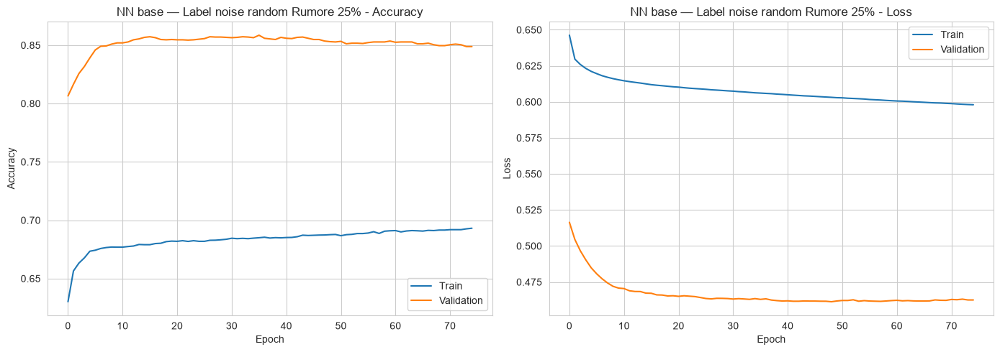

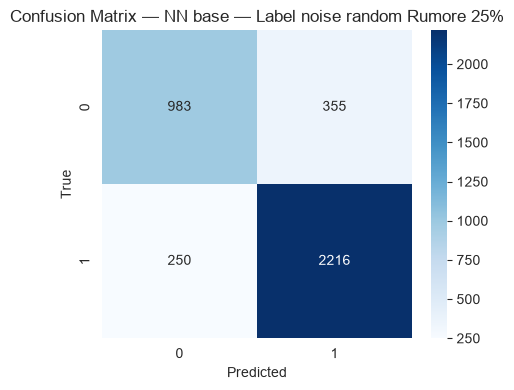

AUC: 0.8882

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.73      0.76      1338
           1       0.86      0.90      0.88      2466

    accuracy                           0.84      3804
   macro avg       0.83      0.82      0.82      3804
weighted avg       0.84      0.84      0.84      3804


 RISULTATI: NN pro — Label noise random Rumore 25%
Test loss: 0.4969 - Test accuracy: 0.8378


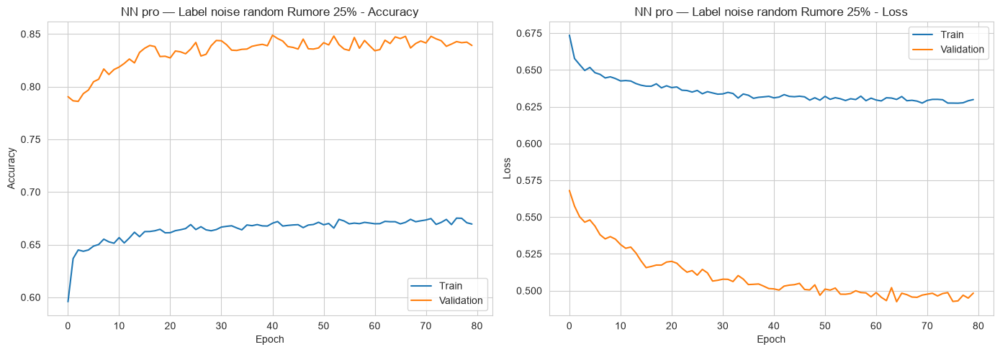

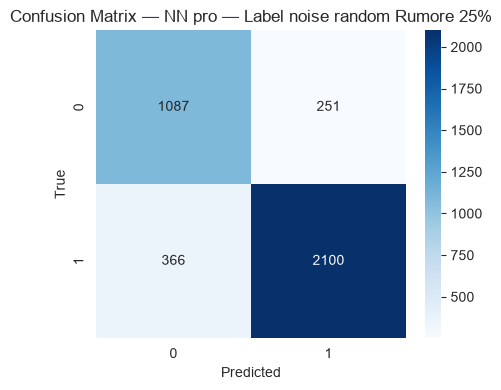

AUC: 0.9081

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.75      0.81      0.78      1338
           1       0.89      0.85      0.87      2466

    accuracy                           0.84      3804
   macro avg       0.82      0.83      0.83      3804
weighted avg       0.84      0.84      0.84      3804


 RISULTATI: RF — Label noise random Rumore 25%


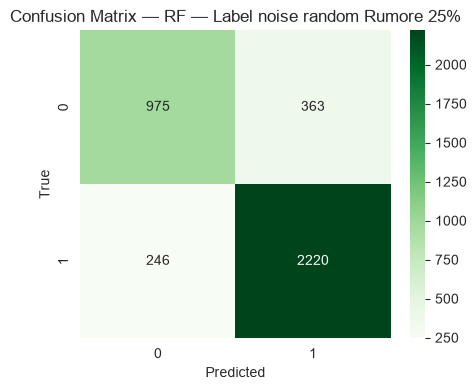

Accuracy: 0.8399
AUC: 0.8884

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.73      0.76      1338
           1       0.86      0.90      0.88      2466

    accuracy                           0.84      3804
   macro avg       0.83      0.81      0.82      3804
weighted avg       0.84      0.84      0.84      3804


 RISULTATI: NN base — Label noise random Rumore 40%
Test loss: 0.5968 - Test accuracy: 0.7419


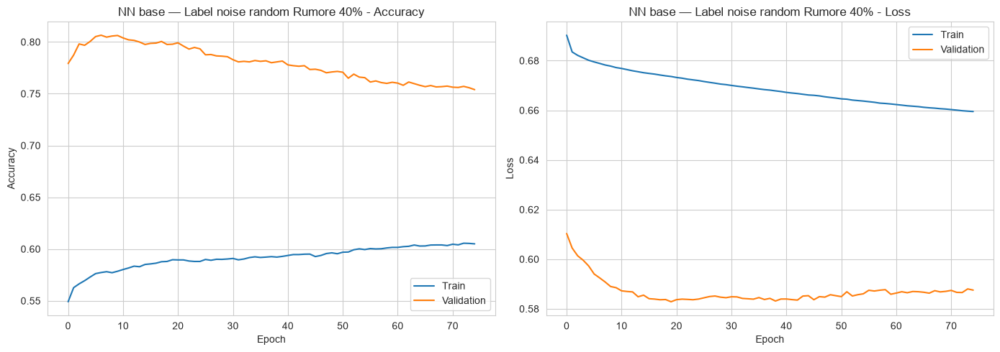

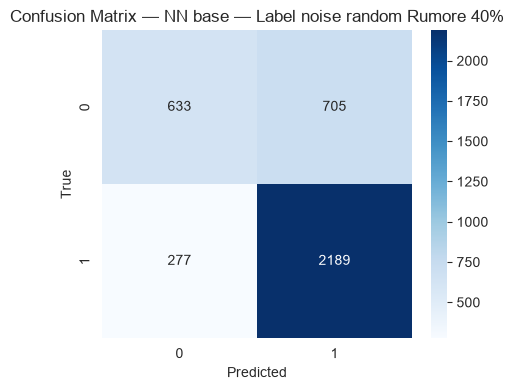

AUC: 0.7513

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.70      0.47      0.56      1338
           1       0.76      0.89      0.82      2466

    accuracy                           0.74      3804
   macro avg       0.73      0.68      0.69      3804
weighted avg       0.74      0.74      0.73      3804


 RISULTATI: NN pro — Label noise random Rumore 40%
Test loss: 0.6137 - Test accuracy: 0.8044


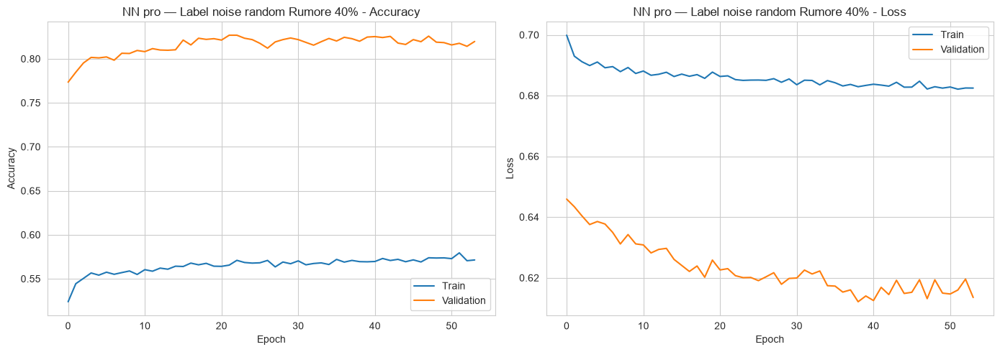

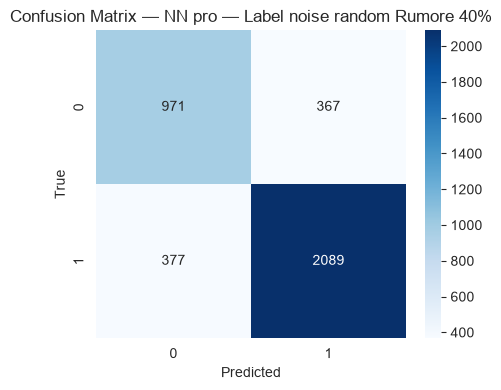

AUC: 0.8677

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.72      0.73      0.72      1338
           1       0.85      0.85      0.85      2466

    accuracy                           0.80      3804
   macro avg       0.79      0.79      0.79      3804
weighted avg       0.80      0.80      0.80      3804


 RISULTATI: RF — Label noise random Rumore 40%


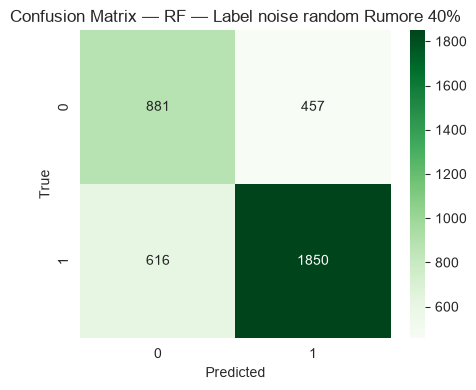

Accuracy: 0.7179
AUC: 0.7673

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.59      0.66      0.62      1338
           1       0.80      0.75      0.78      2466

    accuracy                           0.72      3804
   macro avg       0.70      0.70      0.70      3804
weighted avg       0.73      0.72      0.72      3804


>>> Confronto modelli — Label noise random


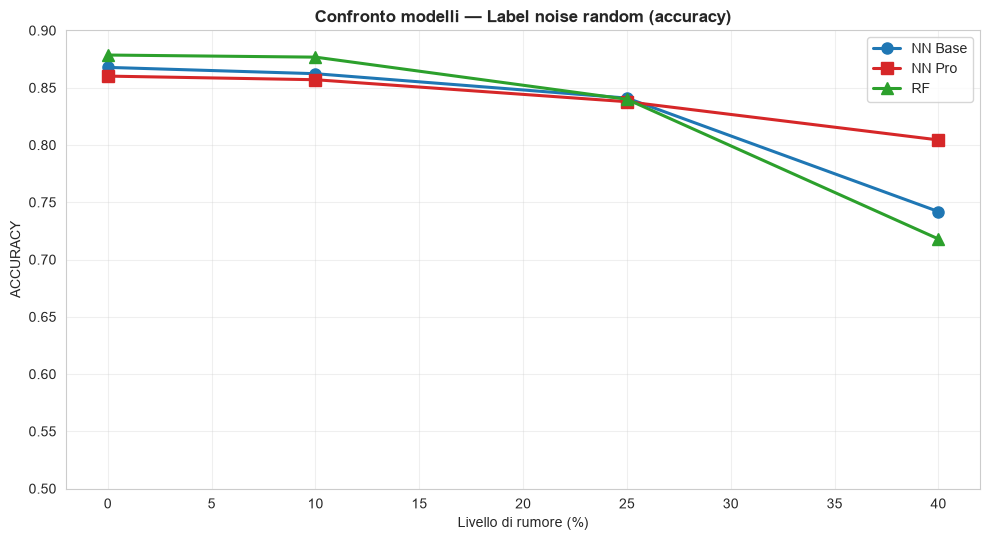

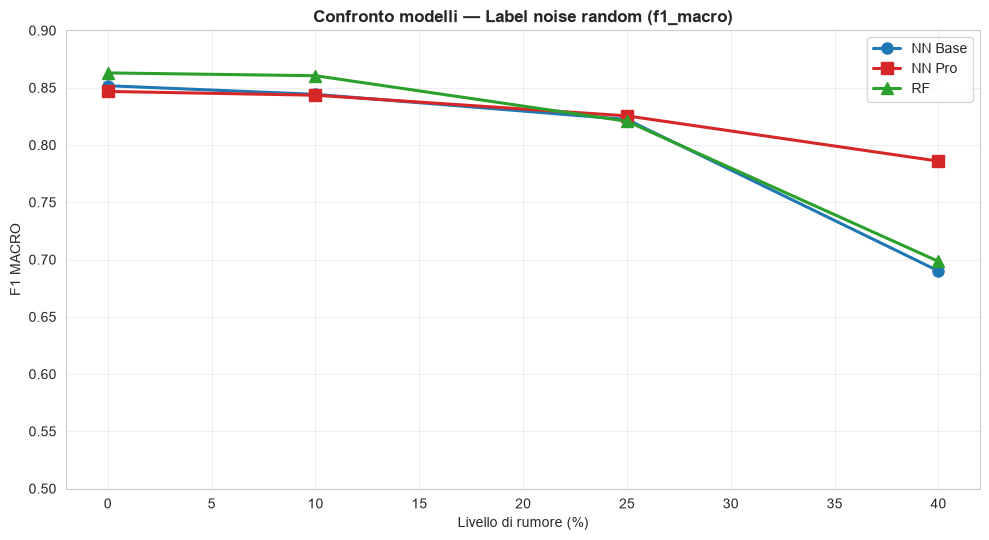

In [17]:
def make_ln(lvl, s):
    ytr = np.array(y_train) if lvl == 0 else add_label_noise_random(y_train, noise_level=lvl, seed=s)
    return X_train_scaled, ytr, X_val_scaled, np.array(y_val), X_test_scaled, np.array(y_test)

dfs_ln = run_noise_section('Label noise random', make_ln, seed=seed)
for m in AGG:
    AGG[m]['Label noise random'] = dfs_ln[m]

# Sezione C — Label Noise Borderline


 RISULTATI: NN base — Label noise borderline Baseline
Test loss: 0.3236 - Test accuracy: 0.8678


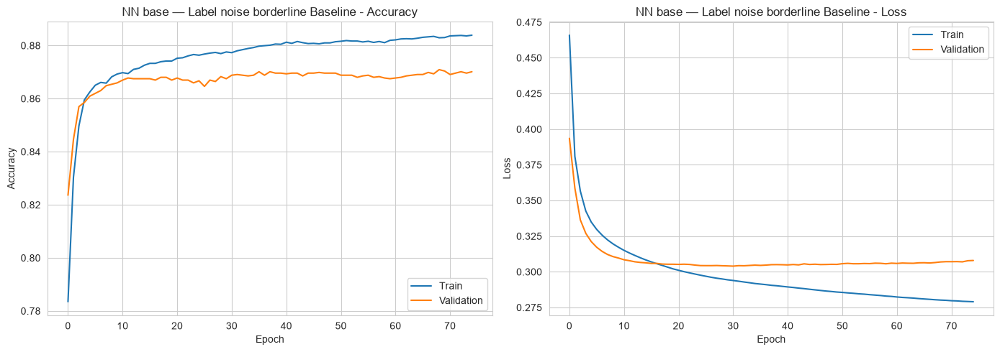

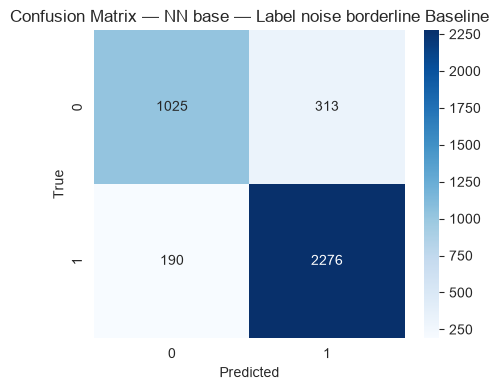

AUC: 0.9214

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.77      0.80      1338
           1       0.88      0.92      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.87      0.87      0.87      3804


 RISULTATI: NN pro — Label noise borderline Baseline
Test loss: 0.3321 - Test accuracy: 0.8601


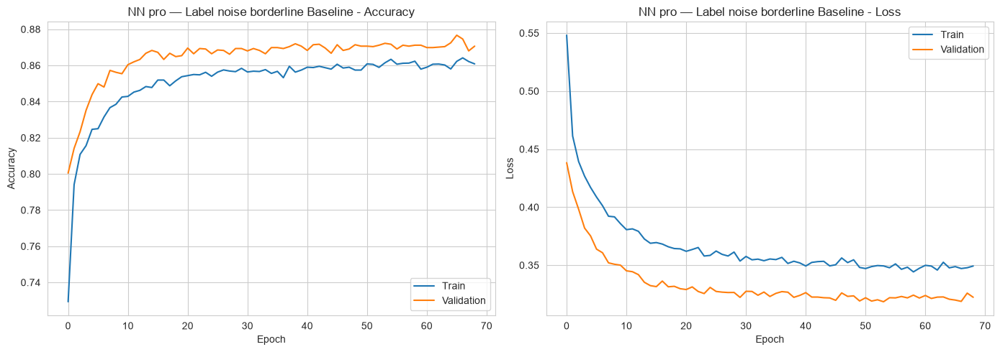

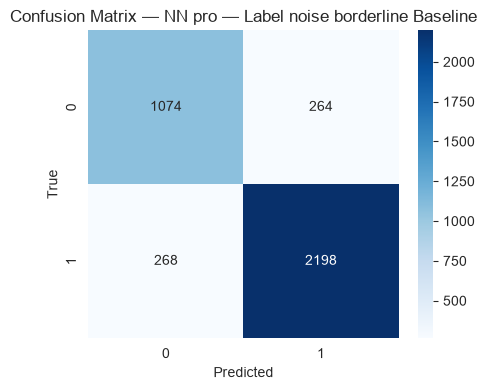

AUC: 0.9238

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.85      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Label noise borderline Baseline


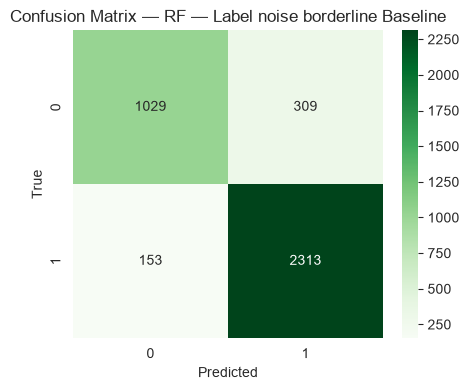

Accuracy: 0.8785
AUC: 0.9300

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.77      0.82      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.88      3804


 RISULTATI: NN base — Label noise borderline Rumore 10%
Test loss: 0.4809 - Test accuracy: 0.8252


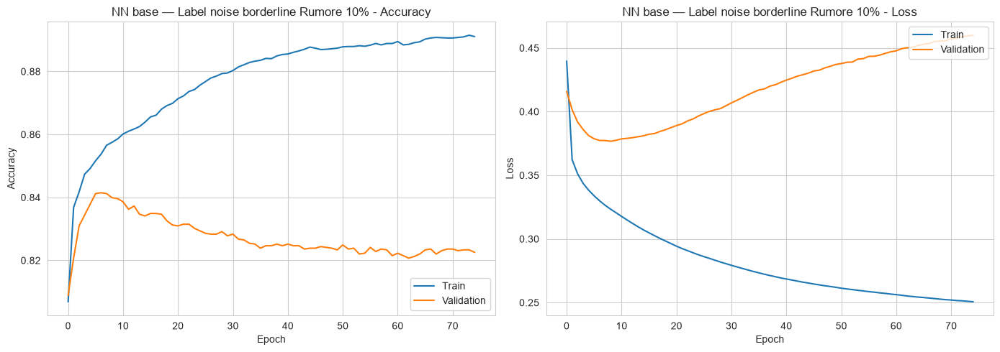

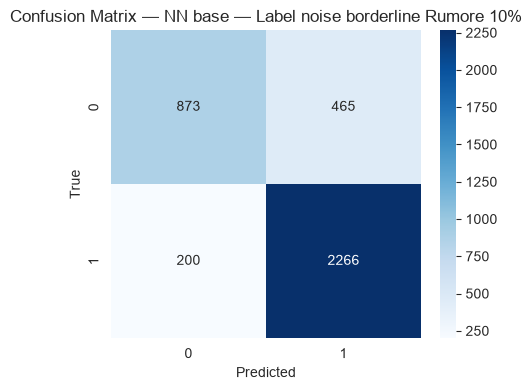

AUC: 0.8680

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.81      0.65      0.72      1338
           1       0.83      0.92      0.87      2466

    accuracy                           0.83      3804
   macro avg       0.82      0.79      0.80      3804
weighted avg       0.82      0.83      0.82      3804


 RISULTATI: NN pro — Label noise borderline Rumore 10%
Test loss: 0.3913 - Test accuracy: 0.8352


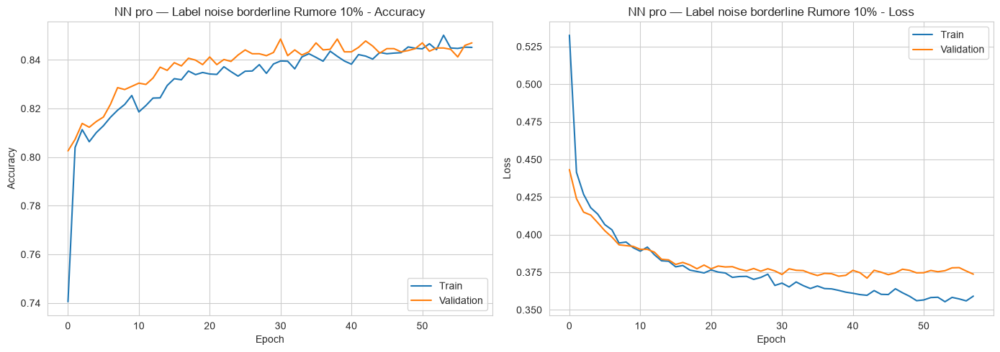

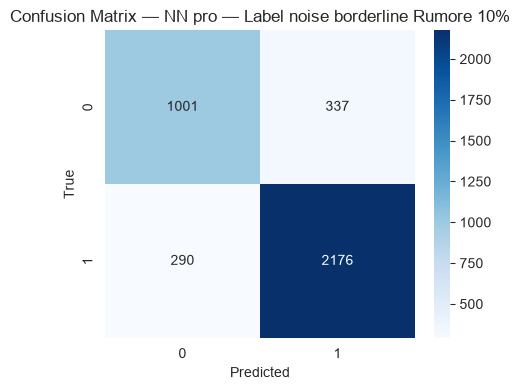

AUC: 0.8915

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.78      0.75      0.76      1338
           1       0.87      0.88      0.87      2466

    accuracy                           0.84      3804
   macro avg       0.82      0.82      0.82      3804
weighted avg       0.83      0.84      0.83      3804


 RISULTATI: RF — Label noise borderline Rumore 10%


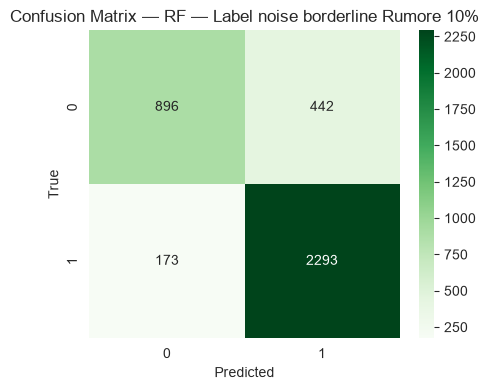

Accuracy: 0.8383
AUC: 0.8886

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.67      0.74      1338
           1       0.84      0.93      0.88      2466

    accuracy                           0.84      3804
   macro avg       0.84      0.80      0.81      3804
weighted avg       0.84      0.84      0.83      3804


 RISULTATI: NN base — Label noise borderline Rumore 25%
Test loss: 0.7025 - Test accuracy: 0.7326


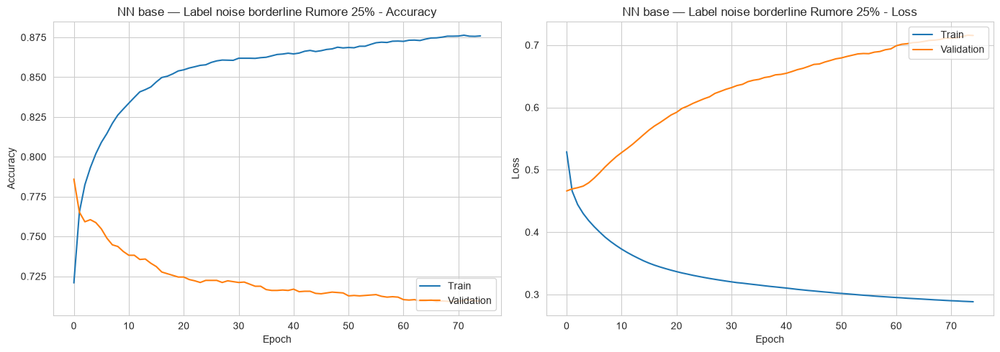

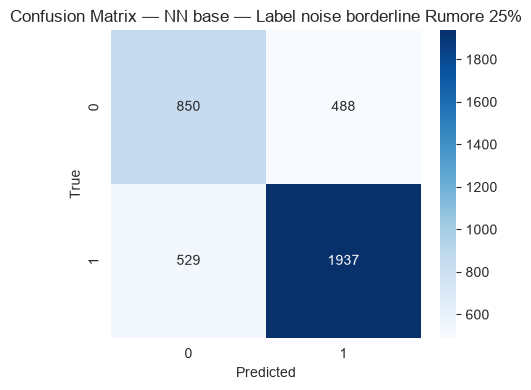

AUC: 0.7879

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.62      0.64      0.63      1338
           1       0.80      0.79      0.79      2466

    accuracy                           0.73      3804
   macro avg       0.71      0.71      0.71      3804
weighted avg       0.73      0.73      0.73      3804


 RISULTATI: NN pro — Label noise borderline Rumore 25%
Test loss: 0.4931 - Test accuracy: 0.7403


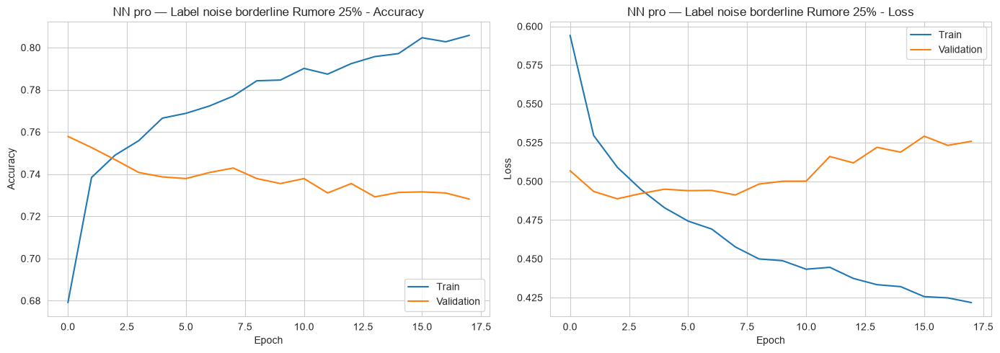

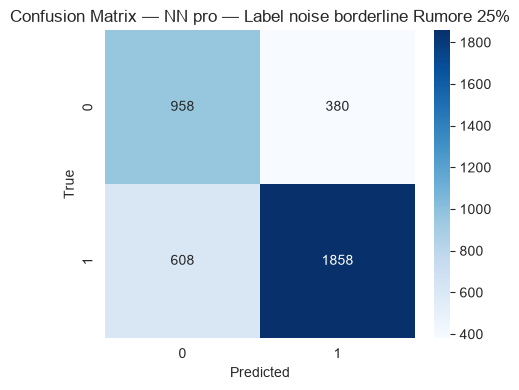

AUC: 0.8265

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.61      0.72      0.66      1338
           1       0.83      0.75      0.79      2466

    accuracy                           0.74      3804
   macro avg       0.72      0.73      0.72      3804
weighted avg       0.75      0.74      0.74      3804


 RISULTATI: RF — Label noise borderline Rumore 25%


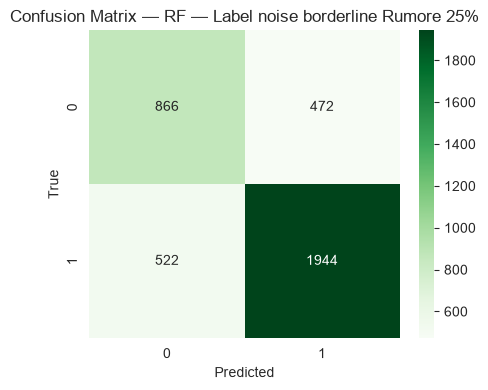

Accuracy: 0.7387
AUC: 0.8043

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.62      0.65      0.64      1338
           1       0.80      0.79      0.80      2466

    accuracy                           0.74      3804
   macro avg       0.71      0.72      0.72      3804
weighted avg       0.74      0.74      0.74      3804


 RISULTATI: NN base — Label noise borderline Rumore 40%
Test loss: 1.0570 - Test accuracy: 0.6002


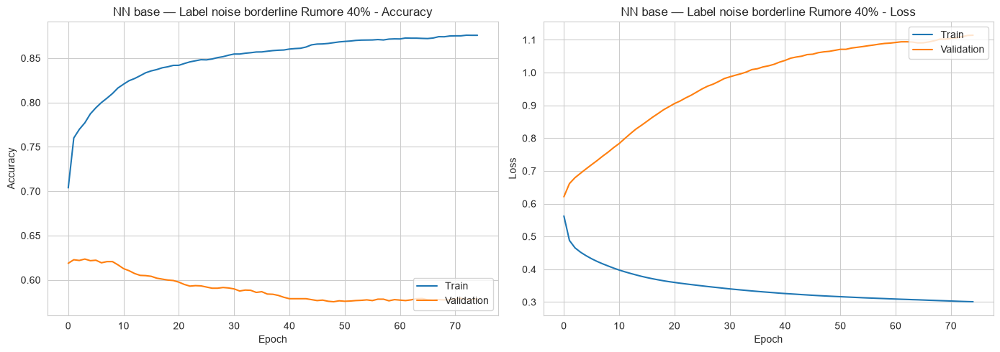

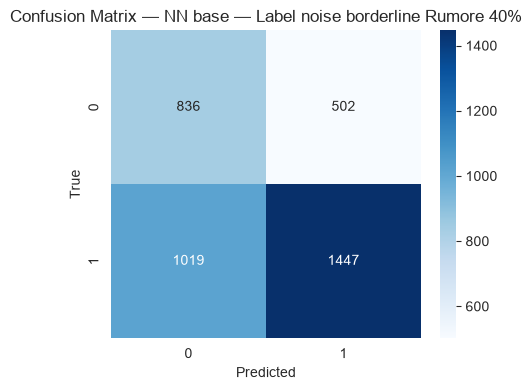

AUC: 0.6656

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.45      0.62      0.52      1338
           1       0.74      0.59      0.66      2466

    accuracy                           0.60      3804
   macro avg       0.60      0.61      0.59      3804
weighted avg       0.64      0.60      0.61      3804


 RISULTATI: NN pro — Label noise borderline Rumore 40%
Test loss: 0.6111 - Test accuracy: 0.6354


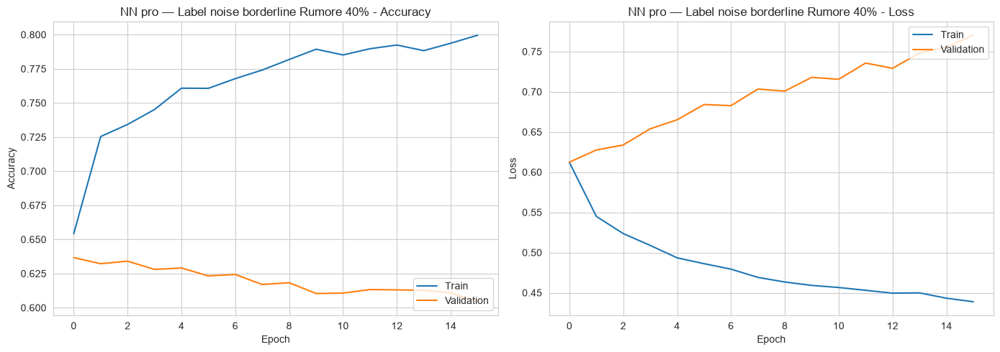

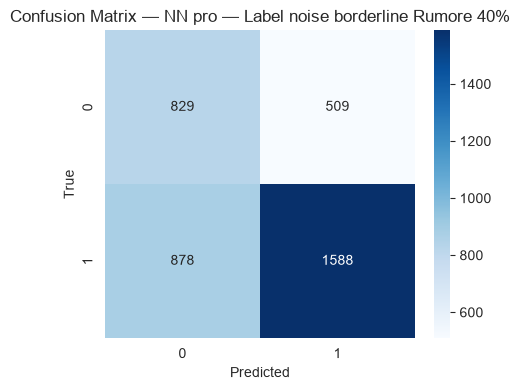

AUC: 0.7084

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.49      0.62      0.54      1338
           1       0.76      0.64      0.70      2466

    accuracy                           0.64      3804
   macro avg       0.62      0.63      0.62      3804
weighted avg       0.66      0.64      0.64      3804


 RISULTATI: RF — Label noise borderline Rumore 40%


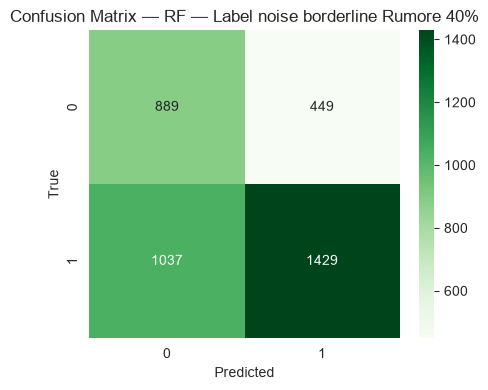

Accuracy: 0.6094
AUC: 0.6774

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.46      0.66      0.54      1338
           1       0.76      0.58      0.66      2466

    accuracy                           0.61      3804
   macro avg       0.61      0.62      0.60      3804
weighted avg       0.66      0.61      0.62      3804


>>> Confronto modelli — Label noise borderline


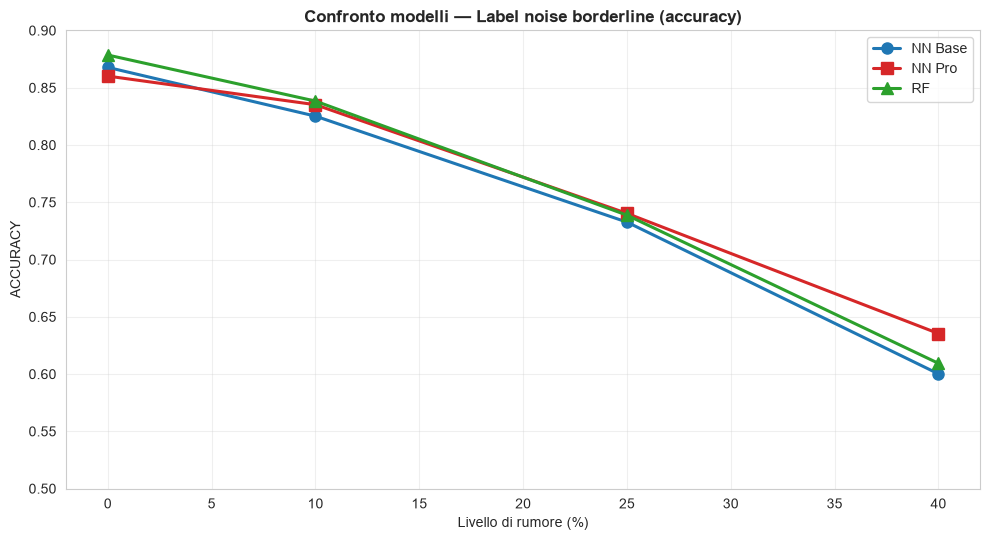

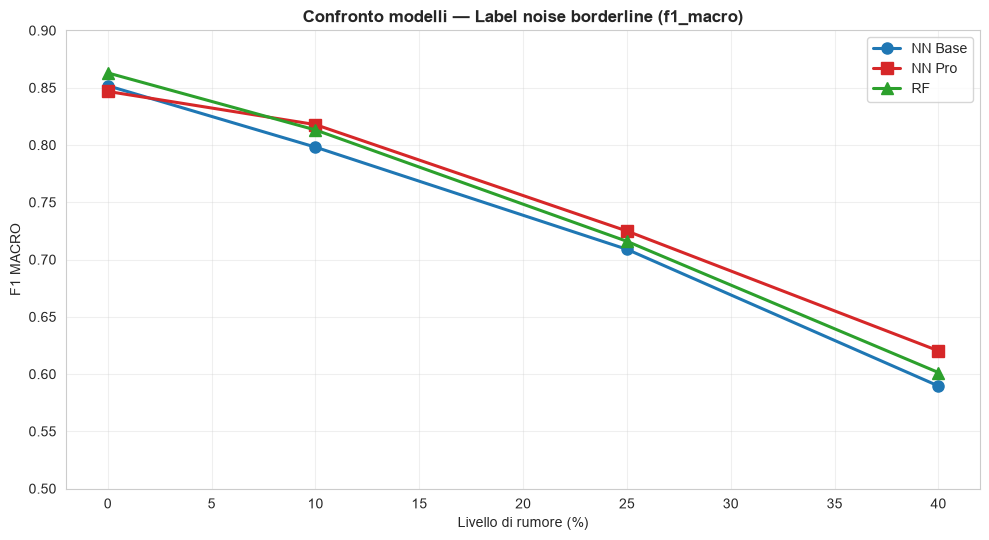

In [18]:
def make_lnb(lvl, s):
    ytr = np.array(y_train) if lvl == 0 else add_label_noise_borderline(X_train_scaled, y_train, noise_level=lvl, seed=s)
    return X_train_scaled, ytr, X_val_scaled, np.array(y_val), X_test_scaled, np.array(y_test)

dfs_lnb = run_noise_section('Label noise borderline', make_lnb, seed=seed)
for m in AGG:
    AGG[m]['Label noise borderline'] = dfs_lnb[m]

# Sezione D — Missing Values

### Missing Values — imputazione MEDIA ###

 RISULTATI: NN base — Missing values (media) Baseline
Test loss: 0.3236 - Test accuracy: 0.8678


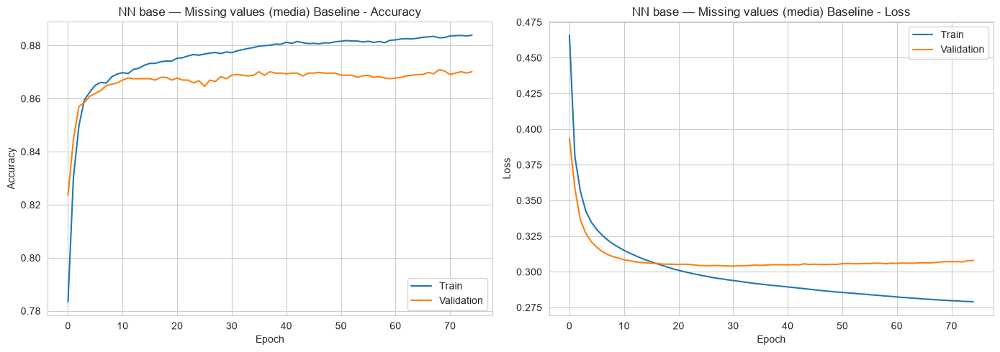

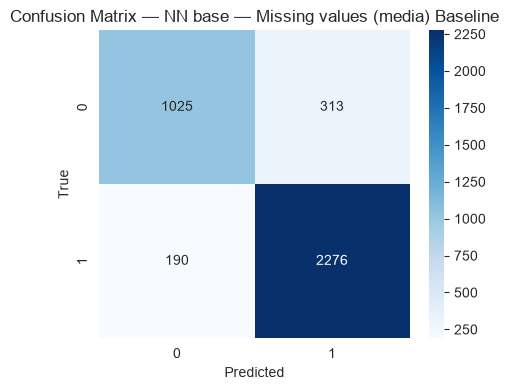

AUC: 0.9214

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.77      0.80      1338
           1       0.88      0.92      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.87      0.87      0.87      3804


 RISULTATI: NN pro — Missing values (media) Baseline
Test loss: 0.3321 - Test accuracy: 0.8601


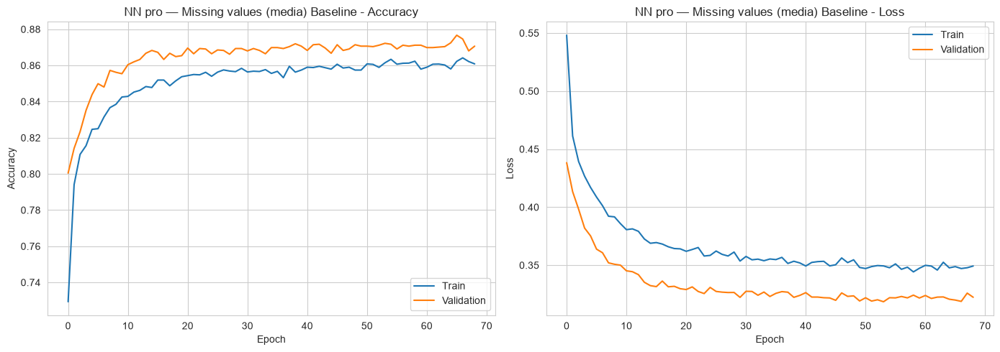

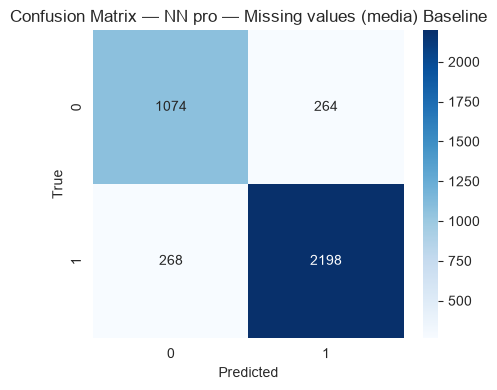

AUC: 0.9238

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.85      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Missing values (media) Baseline


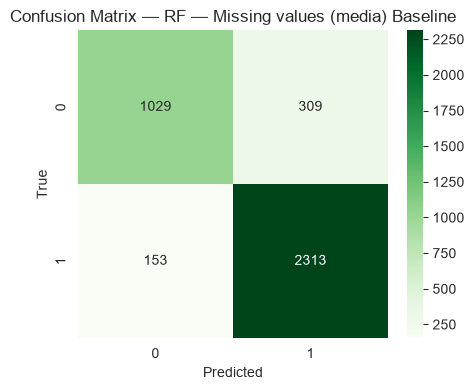

Accuracy: 0.8785
AUC: 0.9300

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.77      0.82      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.88      3804


 RISULTATI: NN base — Missing values (media) Rumore 10%
Test loss: 0.3354 - Test accuracy: 0.8596


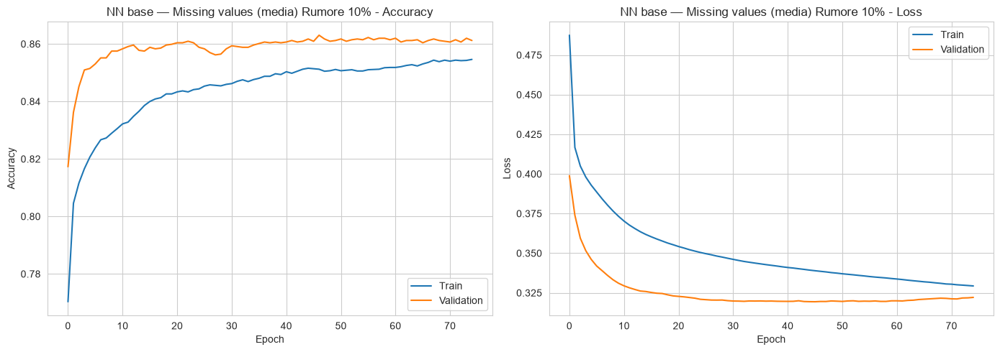

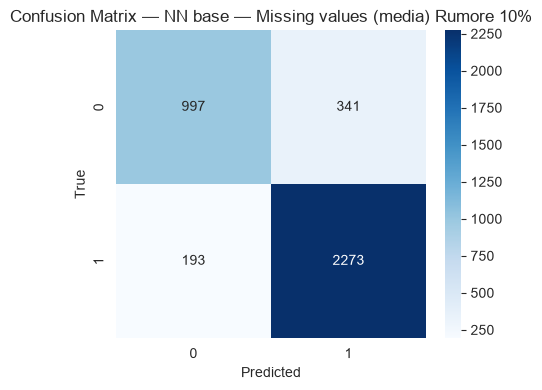

AUC: 0.9159

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.75      0.79      1338
           1       0.87      0.92      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.83      0.84      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: NN pro — Missing values (media) Rumore 10%
Test loss: 0.3445 - Test accuracy: 0.8588


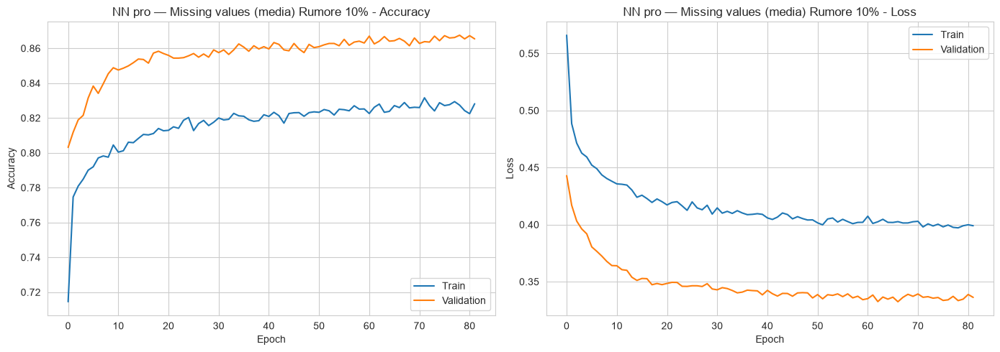

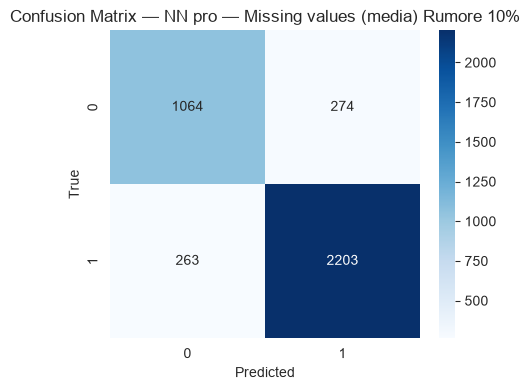

AUC: 0.9185

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.84      0.84      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Missing values (media) Rumore 10%


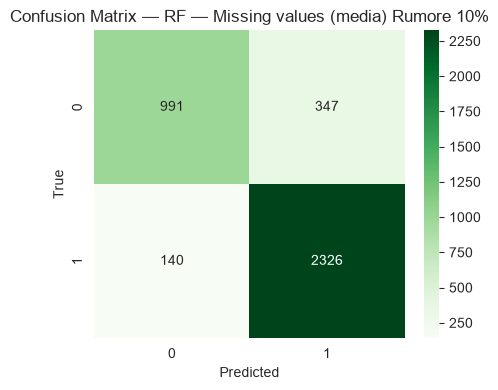

Accuracy: 0.8720
AUC: 0.9232

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.88      0.74      0.80      1338
           1       0.87      0.94      0.91      2466

    accuracy                           0.87      3804
   macro avg       0.87      0.84      0.85      3804
weighted avg       0.87      0.87      0.87      3804


 RISULTATI: NN base — Missing values (media) Rumore 25%
Test loss: 0.3665 - Test accuracy: 0.8417


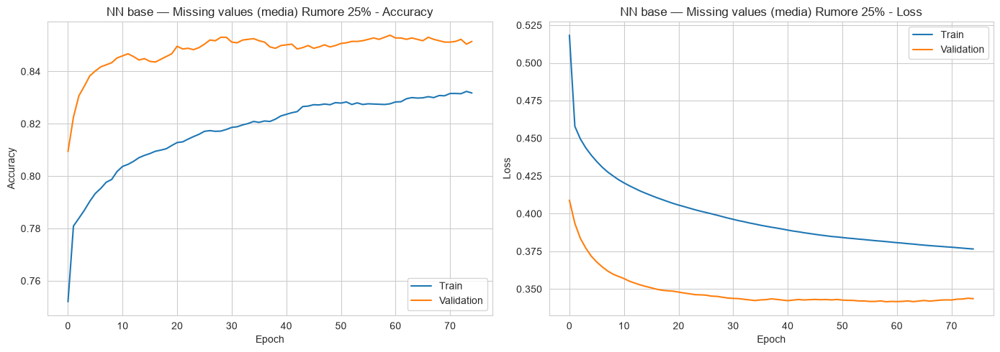

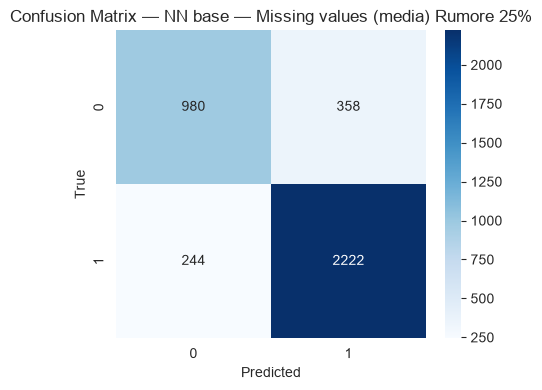

AUC: 0.9027

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.73      0.77      1338
           1       0.86      0.90      0.88      2466

    accuracy                           0.84      3804
   macro avg       0.83      0.82      0.82      3804
weighted avg       0.84      0.84      0.84      3804


 RISULTATI: NN pro — Missing values (media) Rumore 25%
Test loss: 0.3729 - Test accuracy: 0.8467


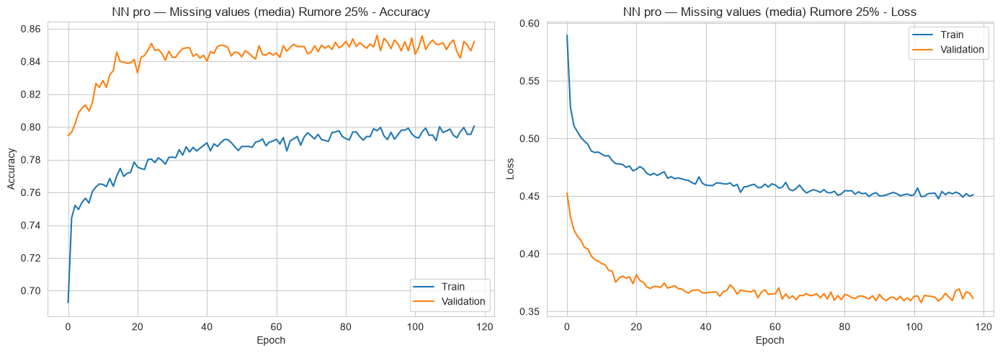

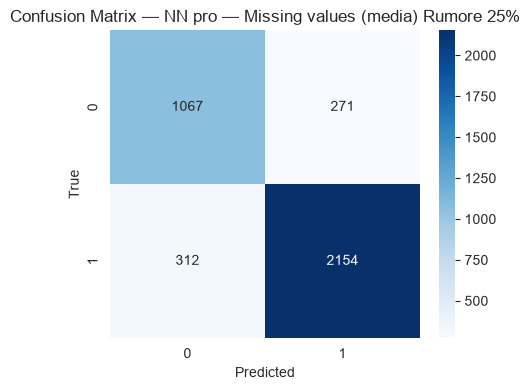

AUC: 0.9097

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.77      0.80      0.79      1338
           1       0.89      0.87      0.88      2466

    accuracy                           0.85      3804
   macro avg       0.83      0.84      0.83      3804
weighted avg       0.85      0.85      0.85      3804


 RISULTATI: RF — Missing values (media) Rumore 25%


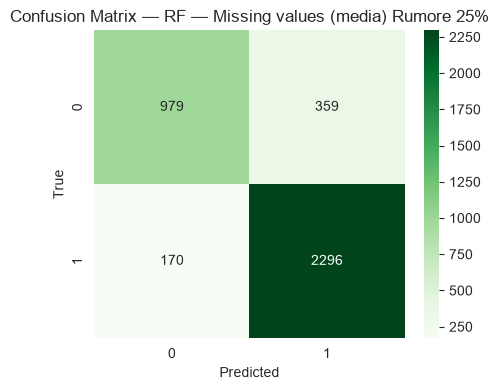

Accuracy: 0.8609
AUC: 0.9143

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.85      0.73      0.79      1338
           1       0.86      0.93      0.90      2466

    accuracy                           0.86      3804
   macro avg       0.86      0.83      0.84      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: NN base — Missing values (media) Rumore 40%
Test loss: 0.3914 - Test accuracy: 0.8218


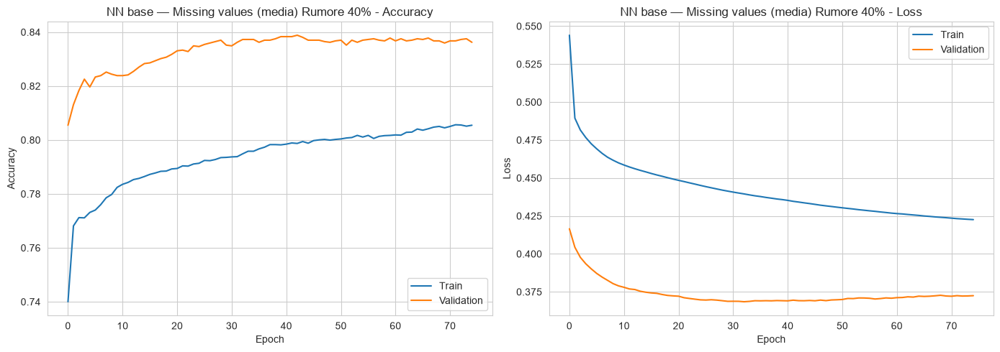

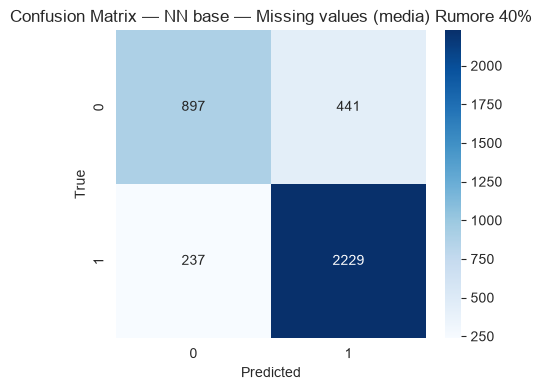

AUC: 0.8881

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.79      0.67      0.73      1338
           1       0.83      0.90      0.87      2466

    accuracy                           0.82      3804
   macro avg       0.81      0.79      0.80      3804
weighted avg       0.82      0.82      0.82      3804


 RISULTATI: NN pro — Missing values (media) Rumore 40%
Test loss: 0.3988 - Test accuracy: 0.8320


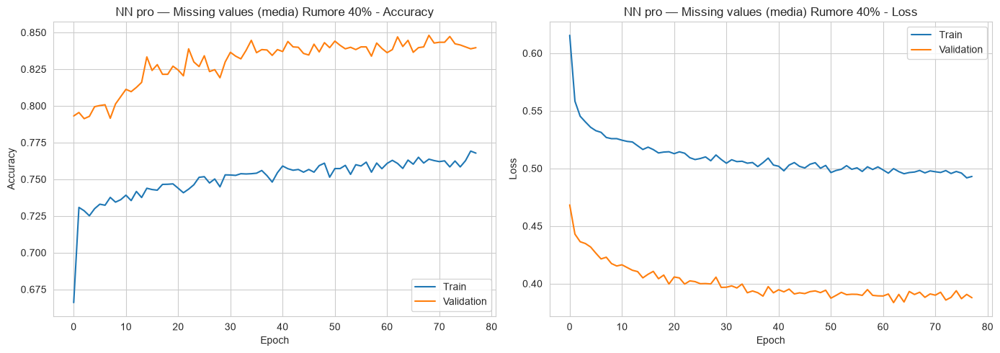

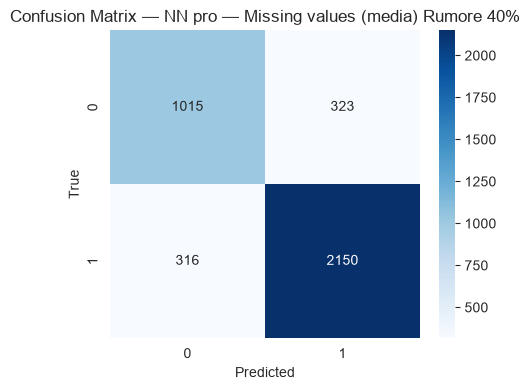

AUC: 0.8957

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.76      0.76      0.76      1338
           1       0.87      0.87      0.87      2466

    accuracy                           0.83      3804
   macro avg       0.82      0.82      0.82      3804
weighted avg       0.83      0.83      0.83      3804


 RISULTATI: RF — Missing values (media) Rumore 40%


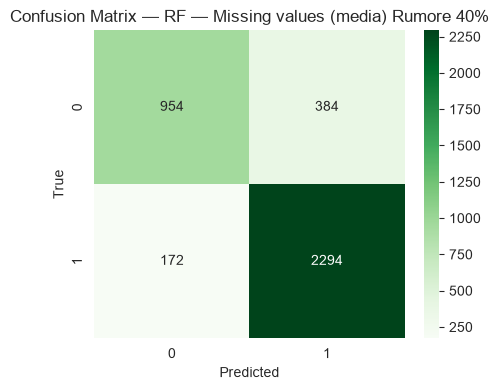

Accuracy: 0.8538
AUC: 0.9053

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.85      0.71      0.77      1338
           1       0.86      0.93      0.89      2466

    accuracy                           0.85      3804
   macro avg       0.85      0.82      0.83      3804
weighted avg       0.85      0.85      0.85      3804


>>> Confronto modelli — Missing values (media)


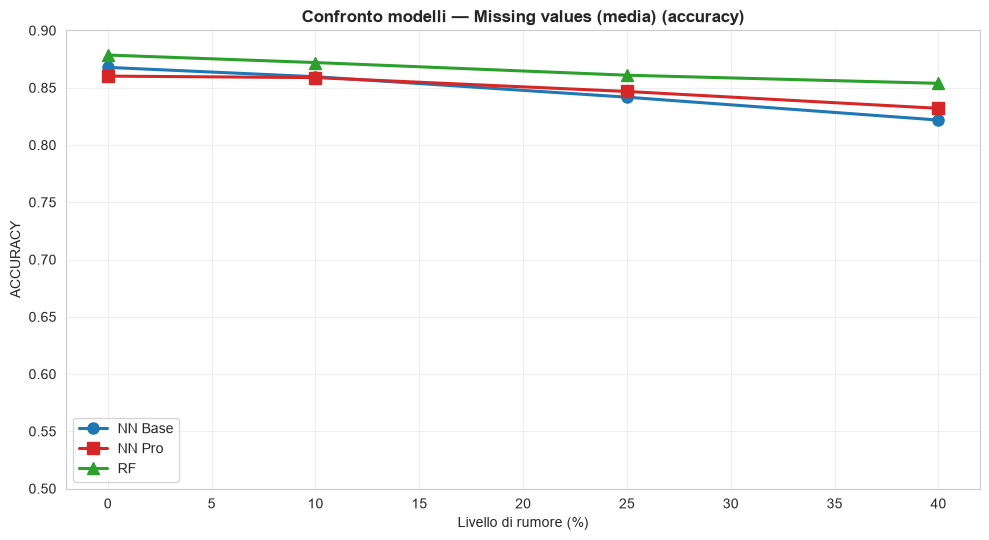

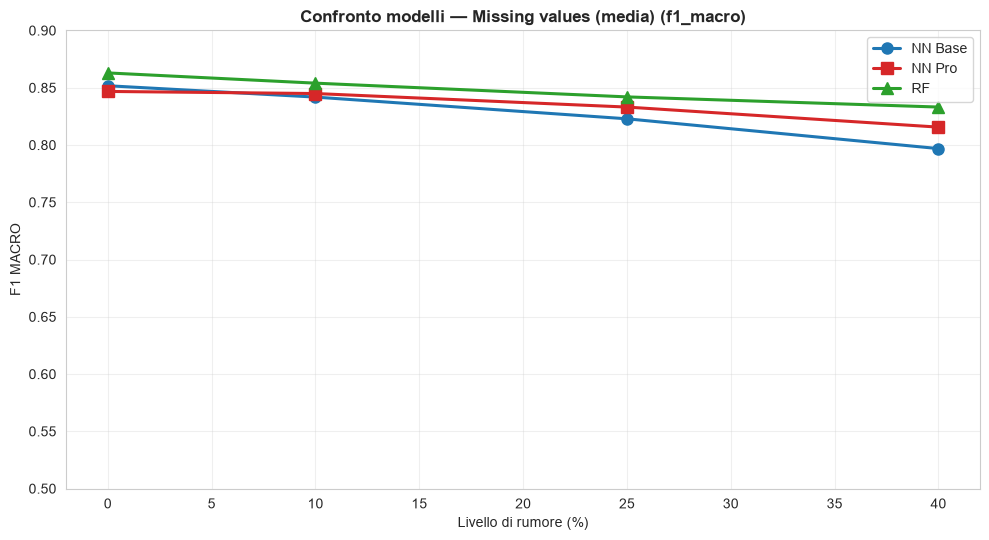

### Missing Values — imputazione MEDIANA ###

 RISULTATI: NN base — Missing values (mediana) Baseline
Test loss: 0.3236 - Test accuracy: 0.8678


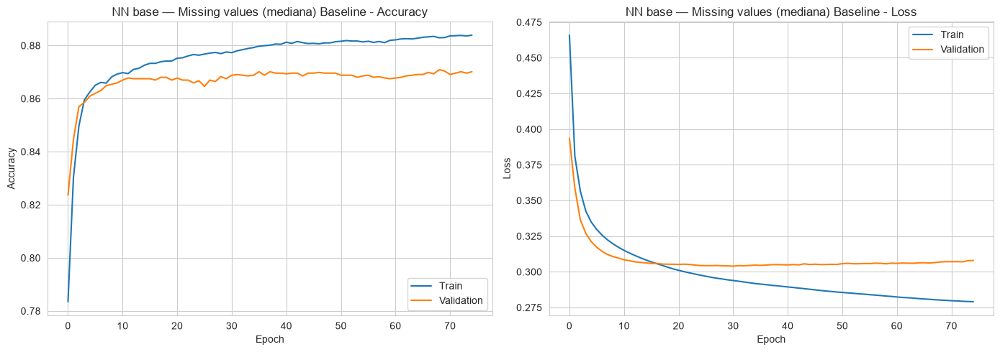

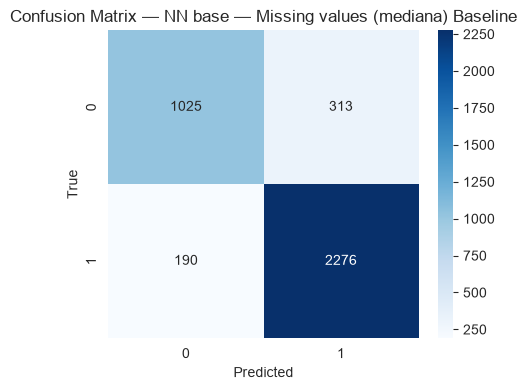

AUC: 0.9214

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.77      0.80      1338
           1       0.88      0.92      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.87      0.87      0.87      3804


 RISULTATI: NN pro — Missing values (mediana) Baseline
Test loss: 0.3321 - Test accuracy: 0.8601


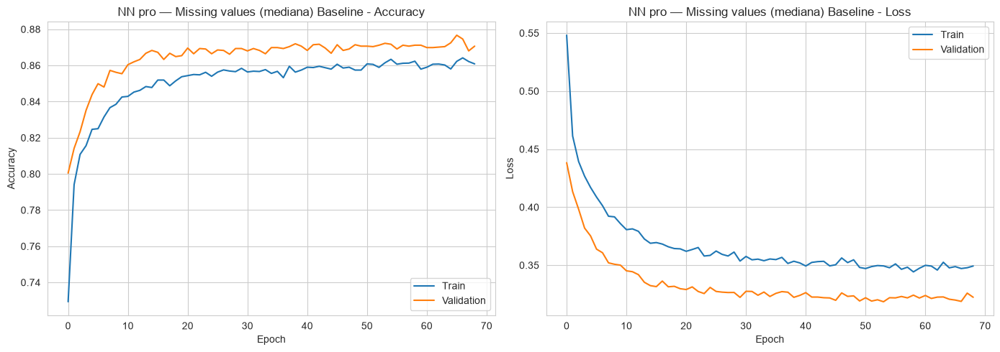

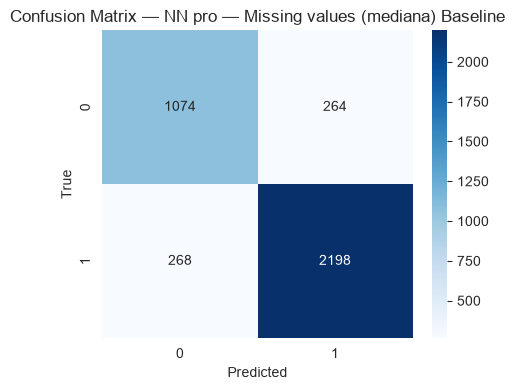

AUC: 0.9238

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.85      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Missing values (mediana) Baseline


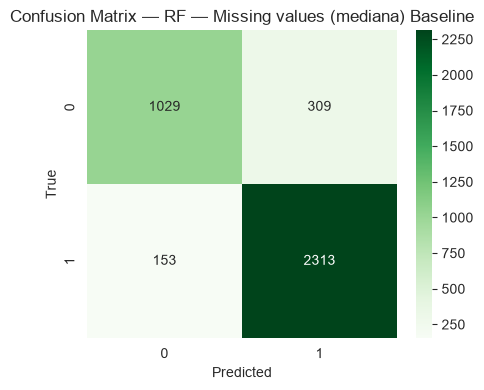

Accuracy: 0.8785
AUC: 0.9300

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.77      0.82      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.88      3804


 RISULTATI: NN base — Missing values (mediana) Rumore 10%
Test loss: 0.3324 - Test accuracy: 0.8617


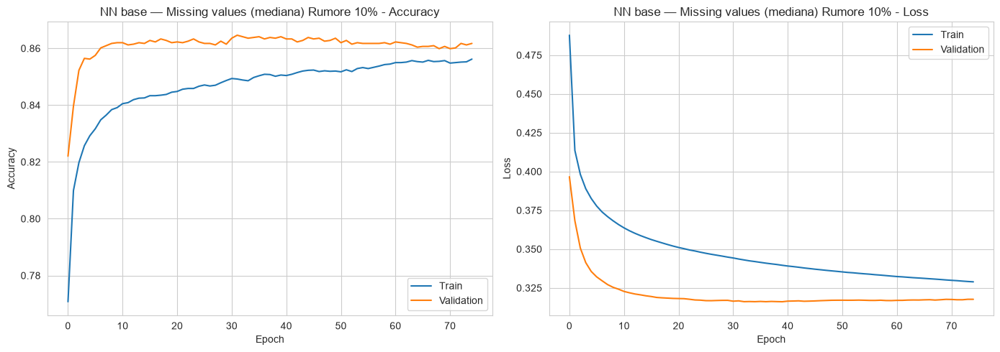

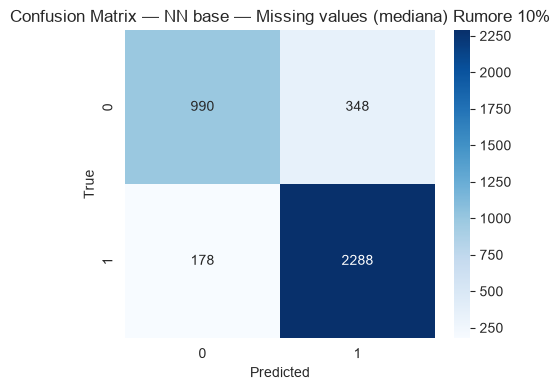

AUC: 0.9172

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.85      0.74      0.79      1338
           1       0.87      0.93      0.90      2466

    accuracy                           0.86      3804
   macro avg       0.86      0.83      0.84      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: NN pro — Missing values (mediana) Rumore 10%
Test loss: 0.3449 - Test accuracy: 0.8570


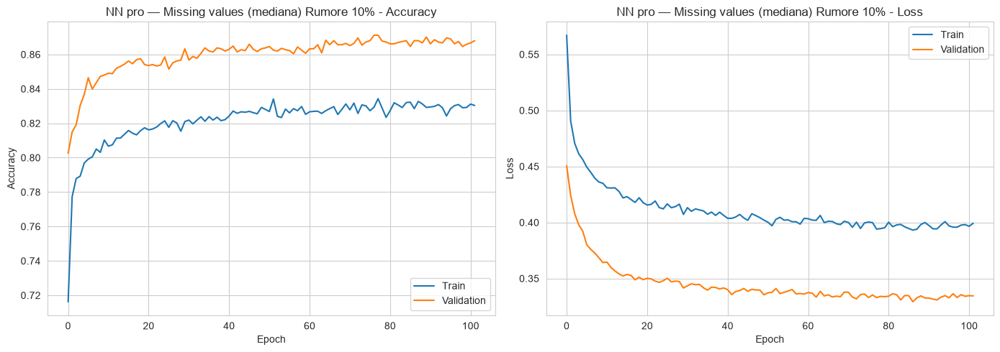

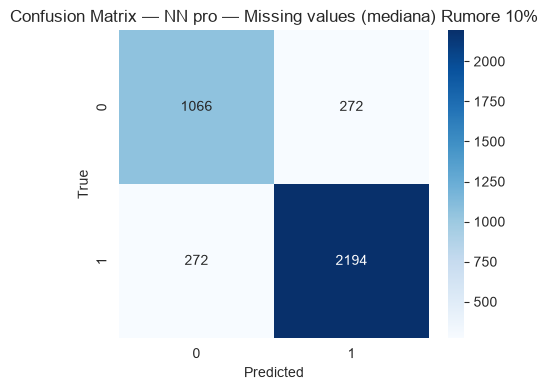

AUC: 0.9190

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.84      0.84      0.84      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Missing values (mediana) Rumore 10%


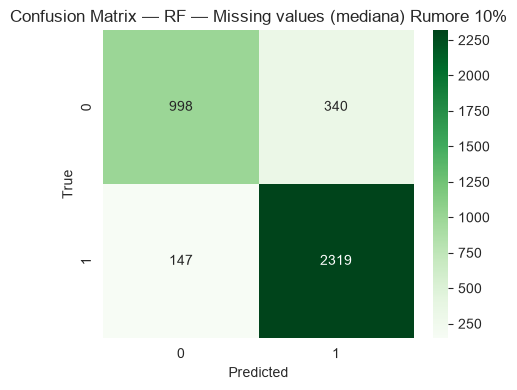

Accuracy: 0.8720
AUC: 0.9208

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.75      0.80      1338
           1       0.87      0.94      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.87      0.84      0.85      3804
weighted avg       0.87      0.87      0.87      3804


 RISULTATI: NN base — Missing values (mediana) Rumore 25%
Test loss: 0.3584 - Test accuracy: 0.8425


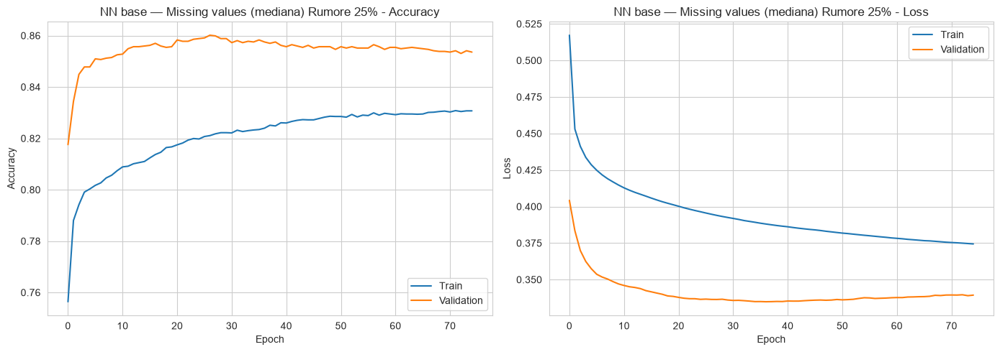

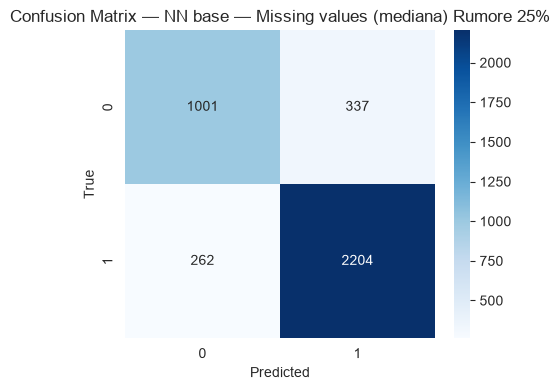

AUC: 0.9057

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.79      0.75      0.77      1338
           1       0.87      0.89      0.88      2466

    accuracy                           0.84      3804
   macro avg       0.83      0.82      0.83      3804
weighted avg       0.84      0.84      0.84      3804


 RISULTATI: NN pro — Missing values (mediana) Rumore 25%
Test loss: 0.3853 - Test accuracy: 0.8328


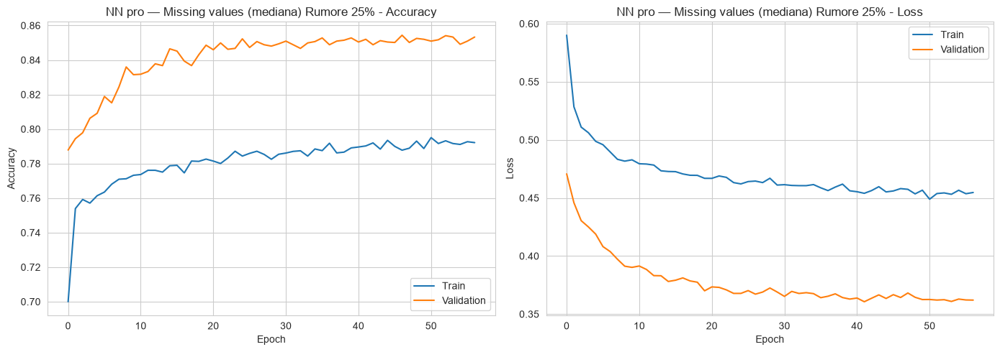

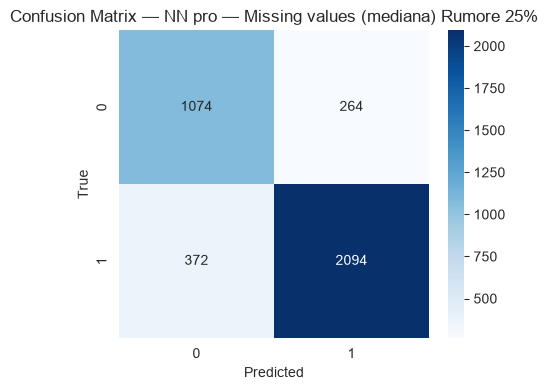

AUC: 0.9046

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.74      0.80      0.77      1338
           1       0.89      0.85      0.87      2466

    accuracy                           0.83      3804
   macro avg       0.82      0.83      0.82      3804
weighted avg       0.84      0.83      0.83      3804


 RISULTATI: RF — Missing values (mediana) Rumore 25%


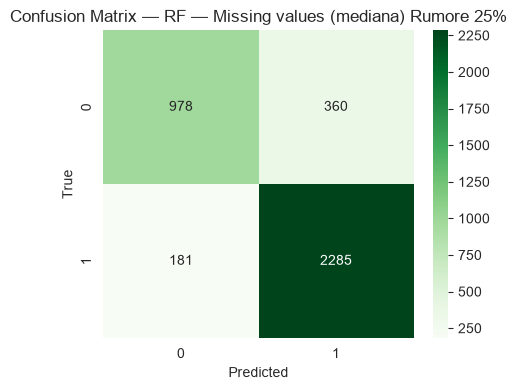

Accuracy: 0.8578
AUC: 0.9129

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.73      0.78      1338
           1       0.86      0.93      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.83      0.84      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: NN base — Missing values (mediana) Rumore 40%
Test loss: 0.3869 - Test accuracy: 0.8328


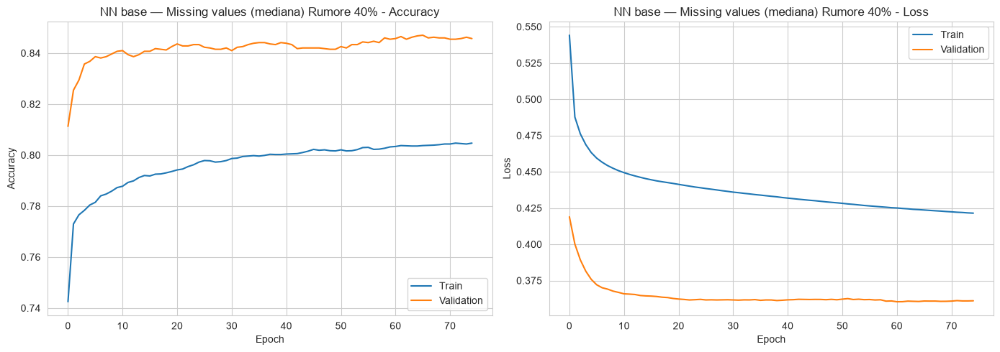

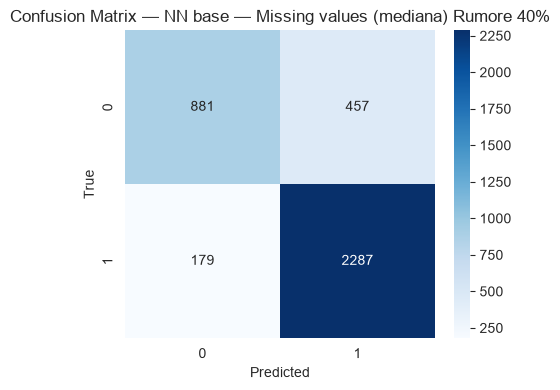

AUC: 0.8915

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.83      0.66      0.73      1338
           1       0.83      0.93      0.88      2466

    accuracy                           0.83      3804
   macro avg       0.83      0.79      0.81      3804
weighted avg       0.83      0.83      0.83      3804


 RISULTATI: NN pro — Missing values (mediana) Rumore 40%
Test loss: 0.4127 - Test accuracy: 0.8226


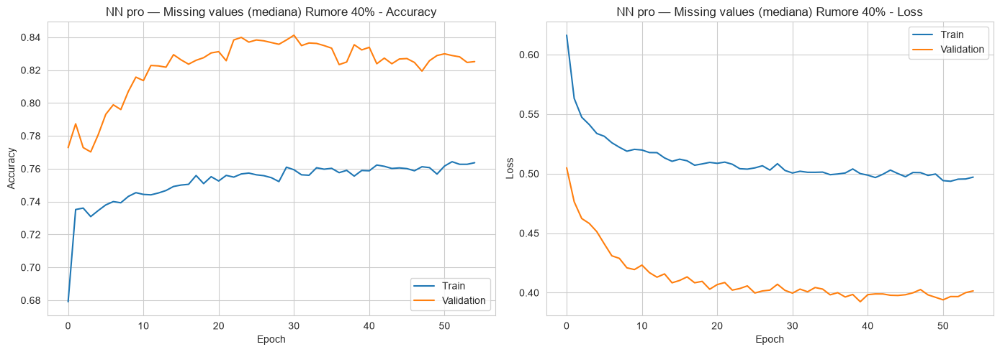

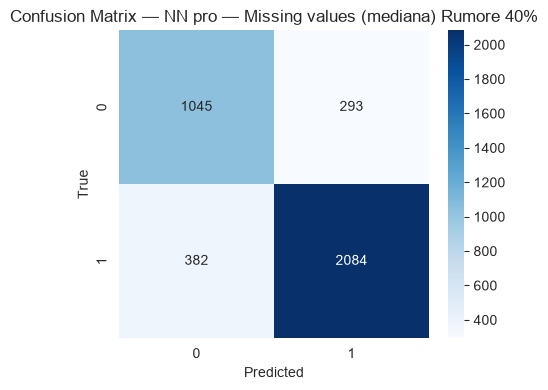

AUC: 0.8937

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.73      0.78      0.76      1338
           1       0.88      0.85      0.86      2466

    accuracy                           0.82      3804
   macro avg       0.80      0.81      0.81      3804
weighted avg       0.83      0.82      0.82      3804


 RISULTATI: RF — Missing values (mediana) Rumore 40%


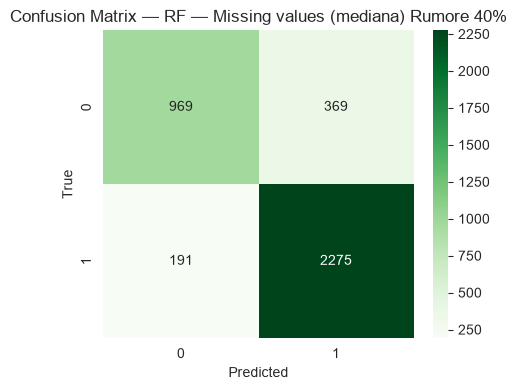

Accuracy: 0.8528
AUC: 0.9039

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.72      0.78      1338
           1       0.86      0.92      0.89      2466

    accuracy                           0.85      3804
   macro avg       0.85      0.82      0.83      3804
weighted avg       0.85      0.85      0.85      3804


>>> Confronto modelli — Missing values (mediana)


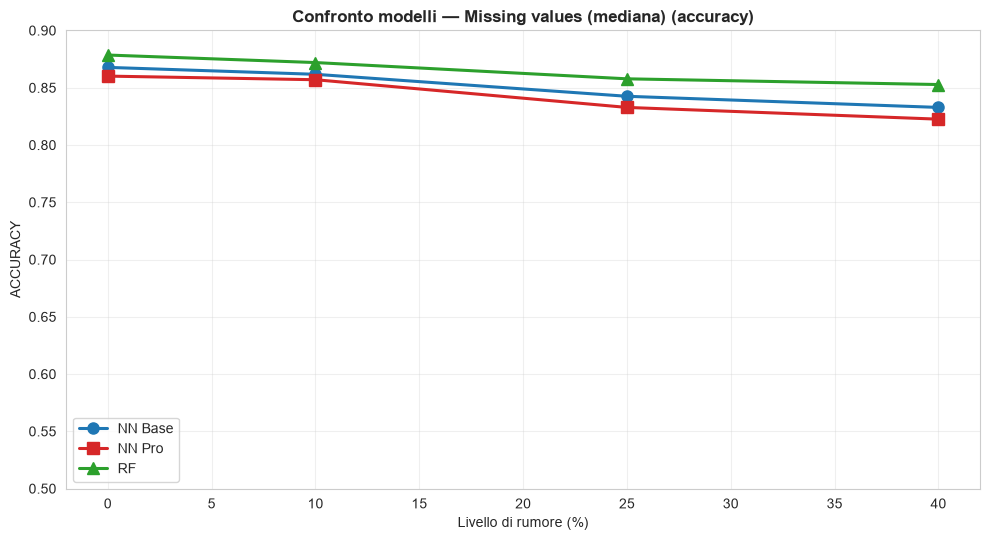

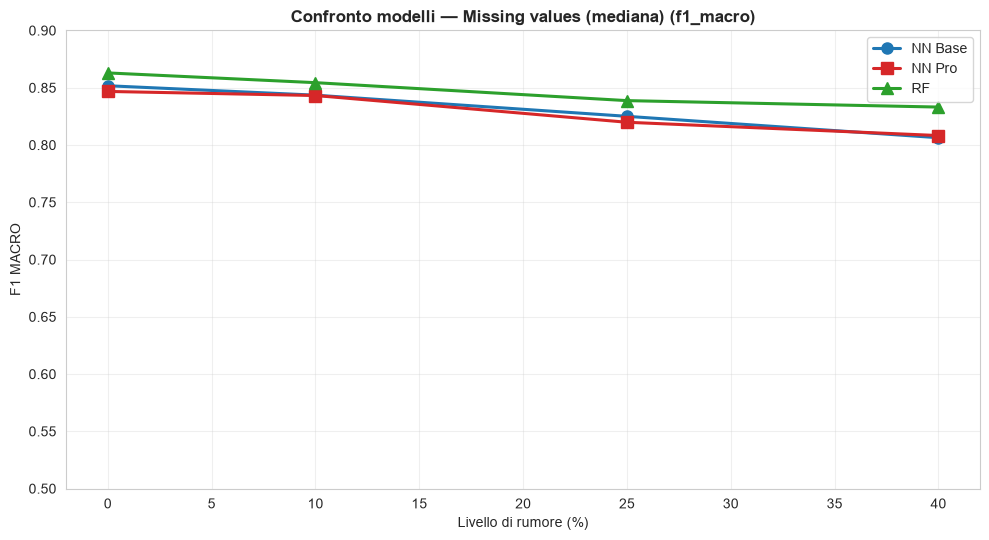

In [19]:
def make_missing(strategy):
    def _f(lvl, s):
        if lvl == 0:
            return X_train_scaled, np.array(y_train), X_val_scaled, np.array(y_val), X_test_scaled, np.array(y_test)
        Xtr_m = add_missing_values(X_train_scaled, missing_rate=lvl, seed=s)
        Xtr_i = SimpleImputer(strategy=strategy).fit_transform(Xtr_m)
        return Xtr_i, np.array(y_train), X_val_scaled, np.array(y_val), X_test_scaled, np.array(y_test)
    return _f

print('### Missing Values — imputazione MEDIA ###')
dfs_miss_mean   = run_noise_section('Missing values (media)',   make_missing('mean'),   seed=seed)
print('### Missing Values — imputazione MEDIANA ###')
dfs_miss_median = run_noise_section('Missing values (mediana)', make_missing('median'), seed=seed)

for m in AGG:
    AGG[m]['Missing values'] = dfs_miss_median[m]  # variante canonica = mediana

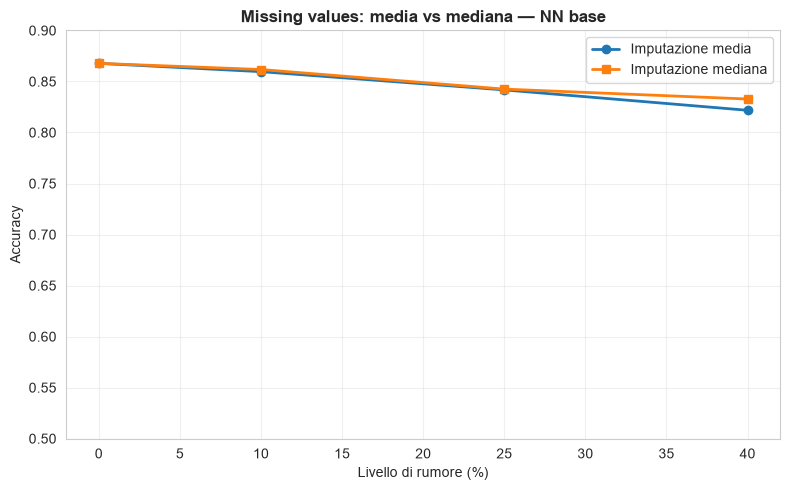

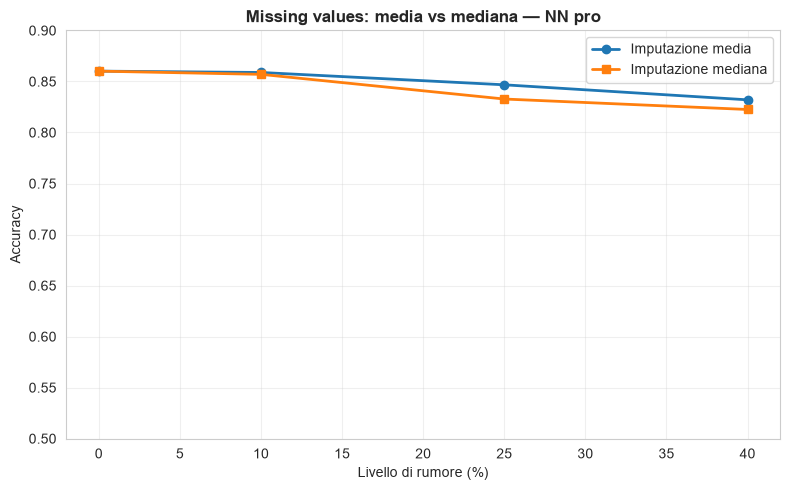

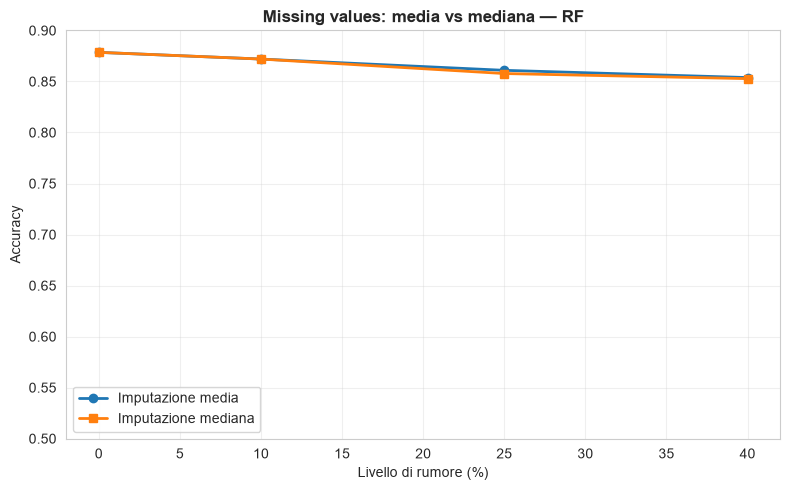

In [20]:
# Confronto diretto media vs mediana (accuracy) per ogni modello
for m in ['NN base', 'NN pro', 'RF']:
    plt.figure(figsize=(8, 5))
    plt.plot(dfs_miss_mean[m]['livello'],   dfs_miss_mean[m]['accuracy'],   marker='o', lw=2, label='Imputazione media')
    plt.plot(dfs_miss_median[m]['livello'], dfs_miss_median[m]['accuracy'], marker='s', lw=2, label='Imputazione mediana')
    plt.xlabel('Livello di rumore (%)'); plt.ylabel('Accuracy')
    plt.ylim(*YLIM_CONFRONTO)
    plt.title(f'Missing values: media vs mediana — {m}', fontweight='bold')
    plt.grid(alpha=0.3); plt.legend(); plt.tight_layout(); plt.show()

# Sezione E — Outlier

### Outlier — LASCIATI ###

 RISULTATI: NN base — Outlier (lasciati) Baseline
Test loss: 0.3236 - Test accuracy: 0.8678


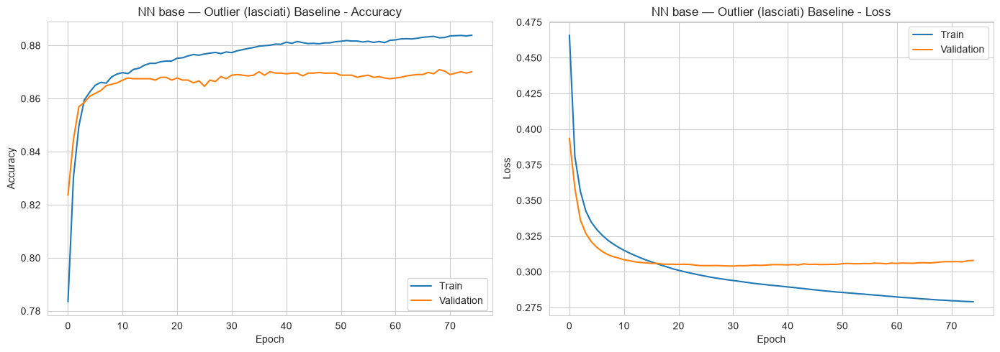

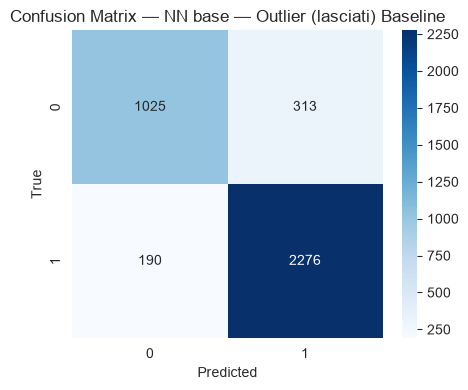

AUC: 0.9214

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.77      0.80      1338
           1       0.88      0.92      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.87      0.87      0.87      3804


 RISULTATI: NN pro — Outlier (lasciati) Baseline
Test loss: 0.3321 - Test accuracy: 0.8601


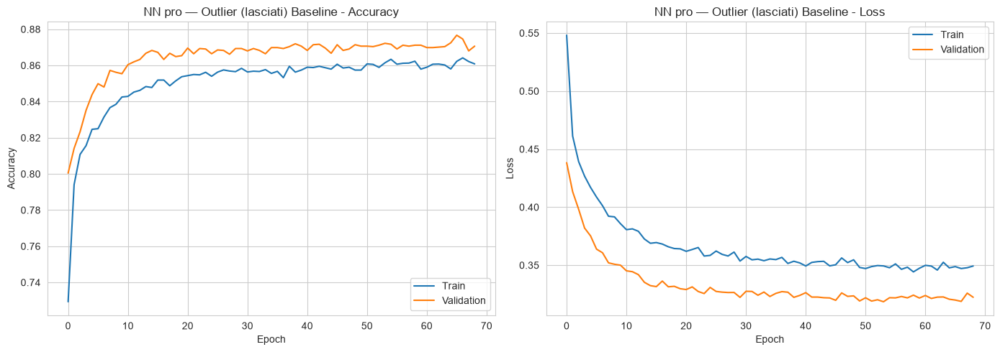

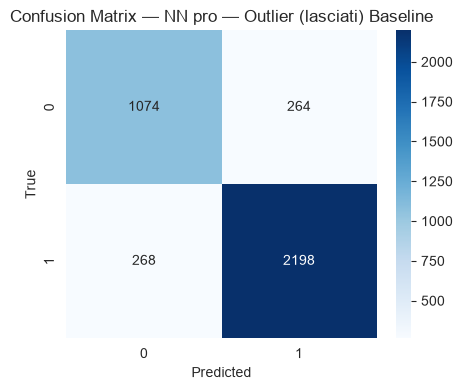

AUC: 0.9238

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.85      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Outlier (lasciati) Baseline


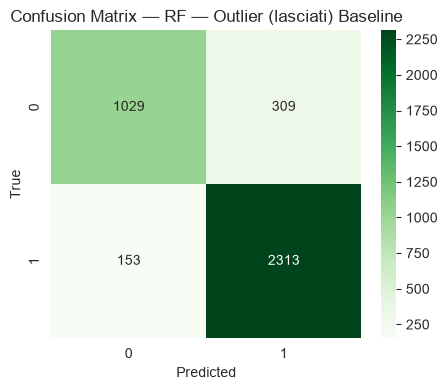

Accuracy: 0.8785
AUC: 0.9300

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.77      0.82      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.88      3804


 RISULTATI: NN base — Outlier (lasciati) Rumore 10%
Test loss: 0.3299 - Test accuracy: 0.8638


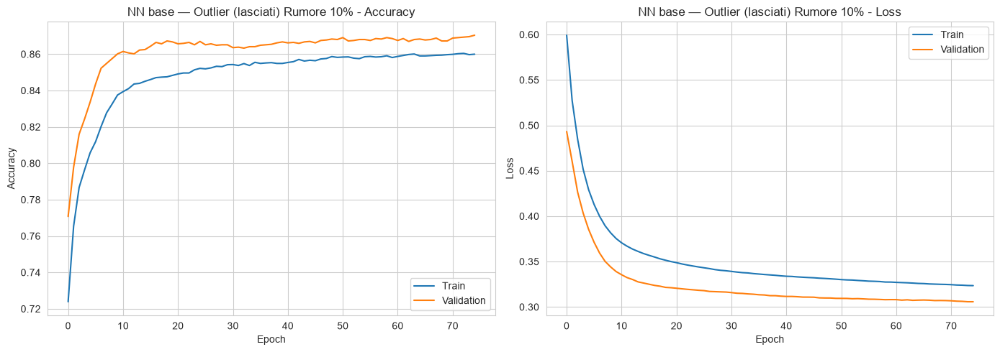

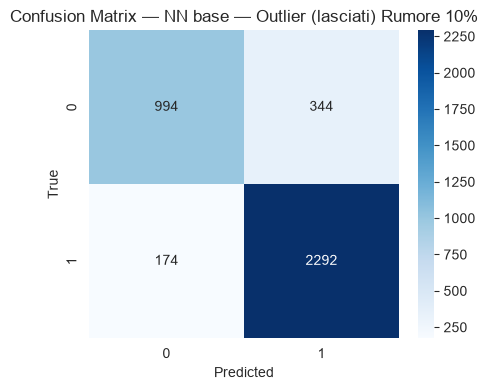

AUC: 0.9167

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.85      0.74      0.79      1338
           1       0.87      0.93      0.90      2466

    accuracy                           0.86      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: NN pro — Outlier (lasciati) Rumore 10%
Test loss: 0.3451 - Test accuracy: 0.8533


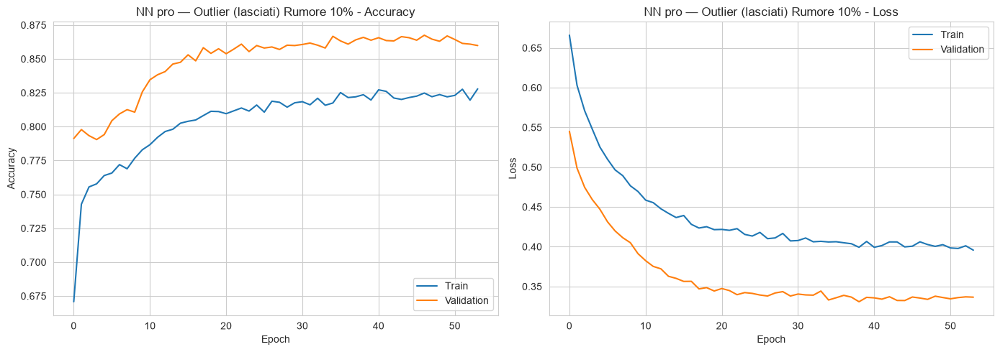

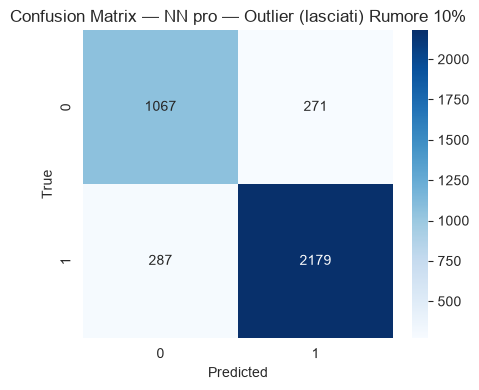

AUC: 0.9189

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.79      0.80      0.79      1338
           1       0.89      0.88      0.89      2466

    accuracy                           0.85      3804
   macro avg       0.84      0.84      0.84      3804
weighted avg       0.85      0.85      0.85      3804


 RISULTATI: RF — Outlier (lasciati) Rumore 10%


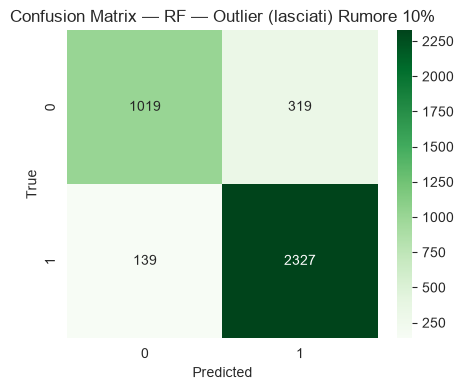

Accuracy: 0.8796
AUC: 0.9293

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.88      0.76      0.82      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.88      3804


 RISULTATI: NN base — Outlier (lasciati) Rumore 25%
Test loss: 0.3315 - Test accuracy: 0.8609


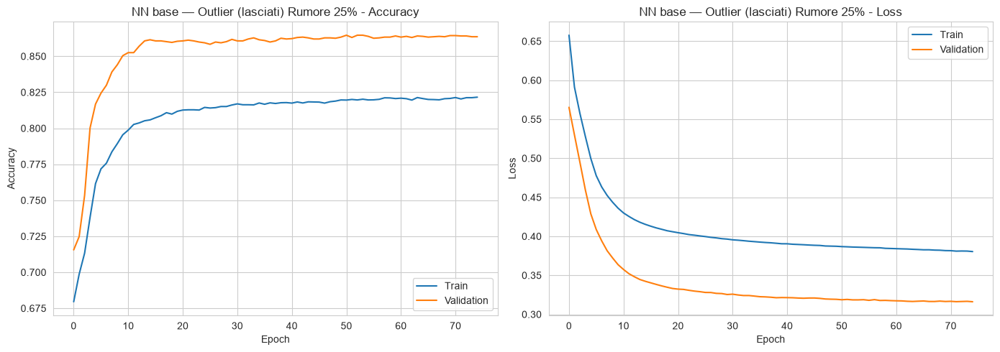

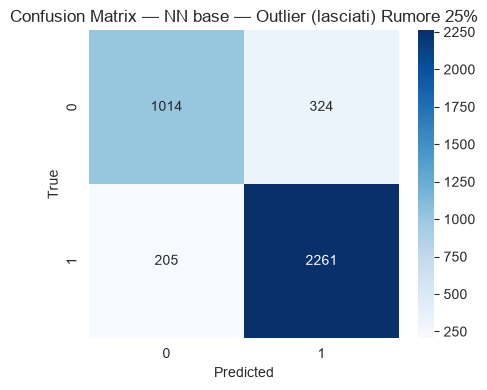

AUC: 0.9162

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.83      0.76      0.79      1338
           1       0.87      0.92      0.90      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.84      0.84      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: NN pro — Outlier (lasciati) Rumore 25%
Test loss: 0.3415 - Test accuracy: 0.8591


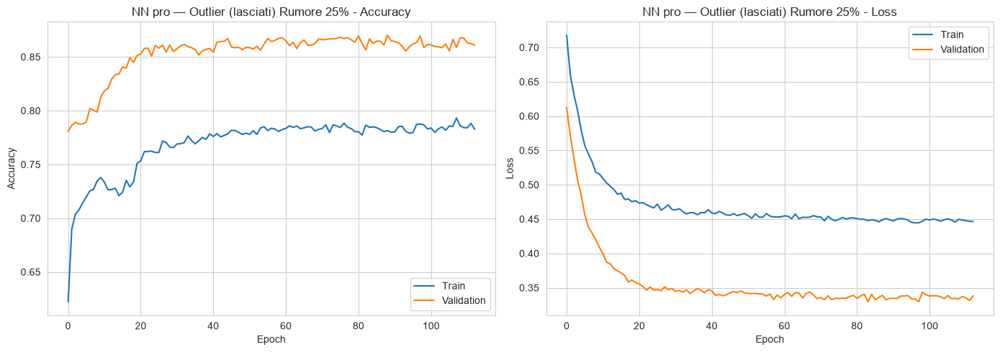

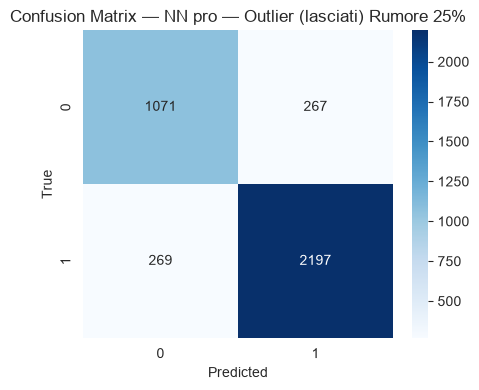

AUC: 0.9213

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.85      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Outlier (lasciati) Rumore 25%


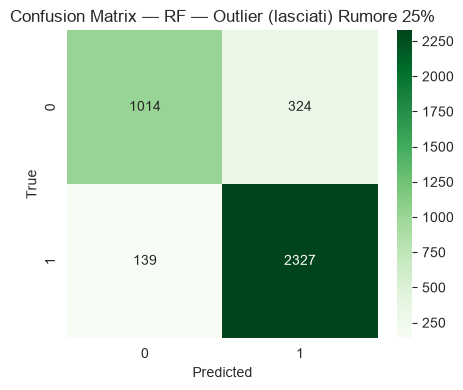

Accuracy: 0.8783
AUC: 0.9271

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.88      0.76      0.81      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.88      3804


 RISULTATI: NN base — Outlier (lasciati) Rumore 40%
Test loss: 0.3403 - Test accuracy: 0.8573


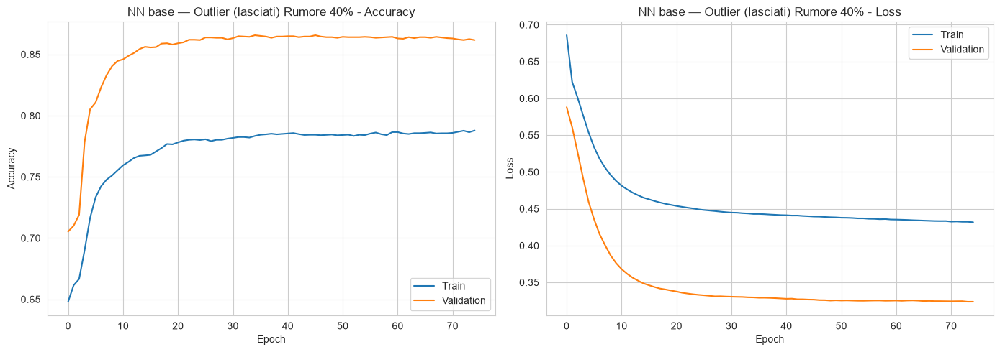

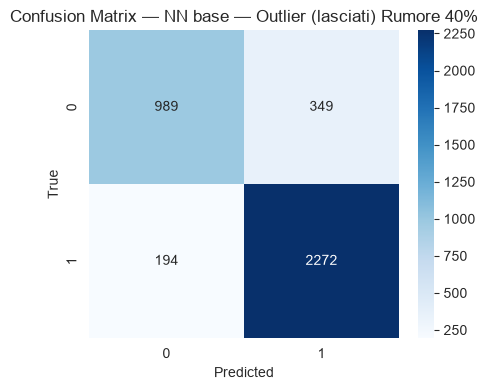

AUC: 0.9112

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.74      0.78      1338
           1       0.87      0.92      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.83      0.84      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: NN pro — Outlier (lasciati) Rumore 40%
Test loss: 0.3448 - Test accuracy: 0.8509


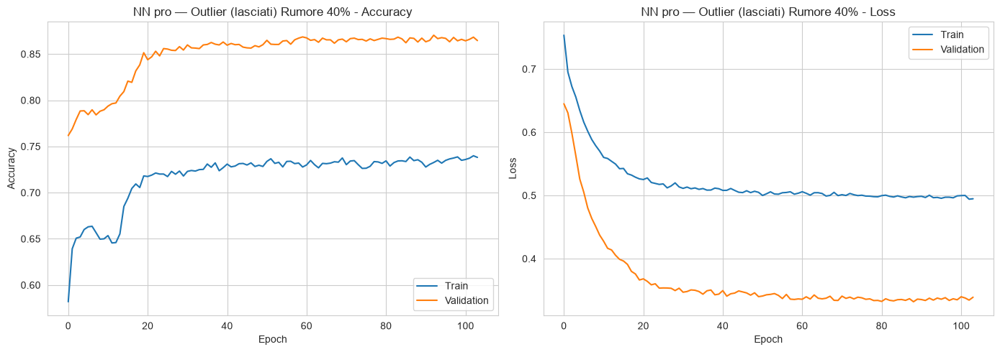

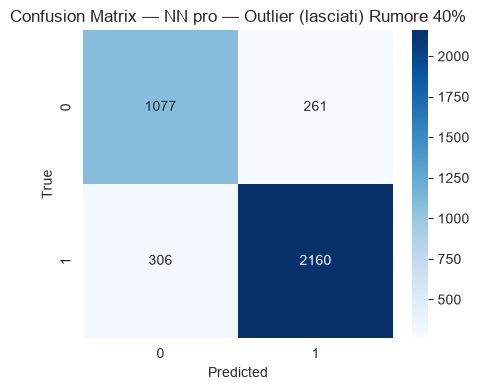

AUC: 0.9208

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.78      0.80      0.79      1338
           1       0.89      0.88      0.88      2466

    accuracy                           0.85      3804
   macro avg       0.84      0.84      0.84      3804
weighted avg       0.85      0.85      0.85      3804


 RISULTATI: RF — Outlier (lasciati) Rumore 40%


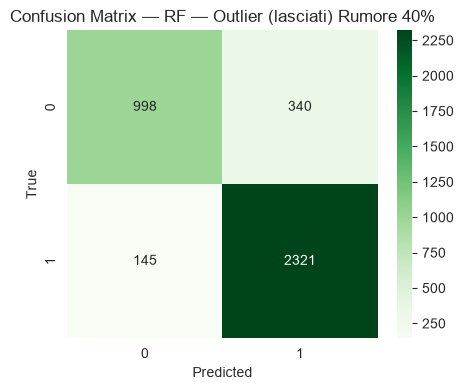

Accuracy: 0.8725
AUC: 0.9248

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.75      0.80      1338
           1       0.87      0.94      0.91      2466

    accuracy                           0.87      3804
   macro avg       0.87      0.84      0.85      3804
weighted avg       0.87      0.87      0.87      3804


>>> Confronto modelli — Outlier (lasciati)


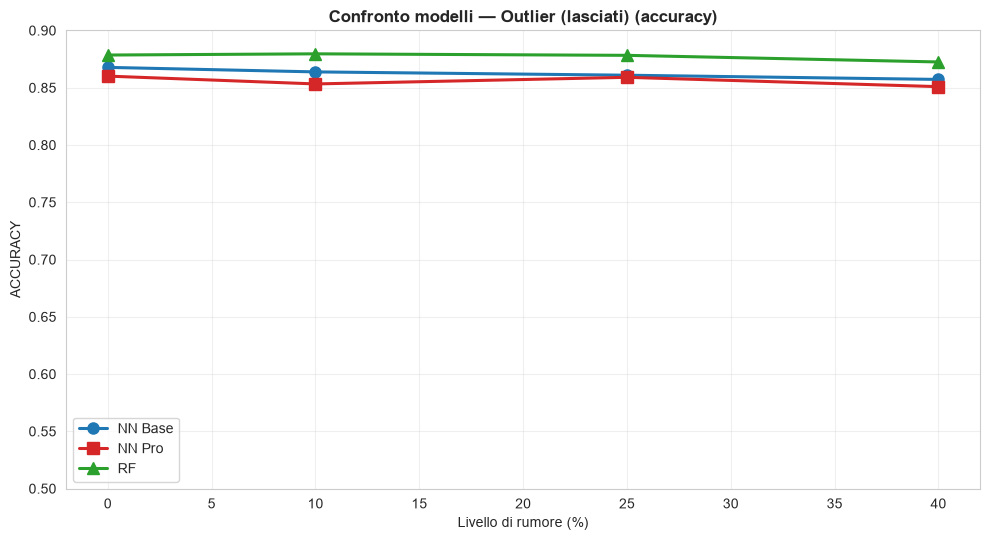

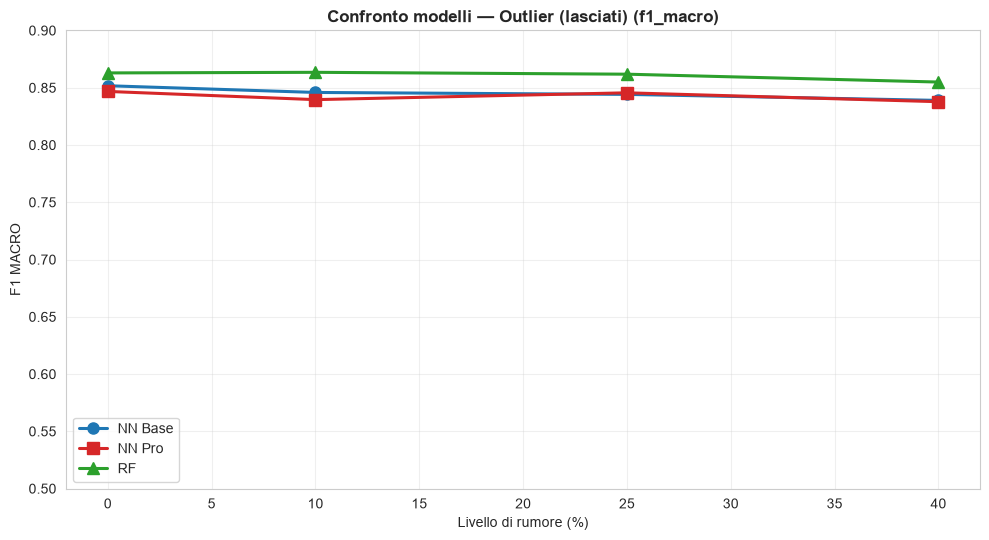

### Outlier — WINSORIZZAZIONE ###

 RISULTATI: NN base — Outlier (winsorizzazione) Baseline
Test loss: 0.3236 - Test accuracy: 0.8678


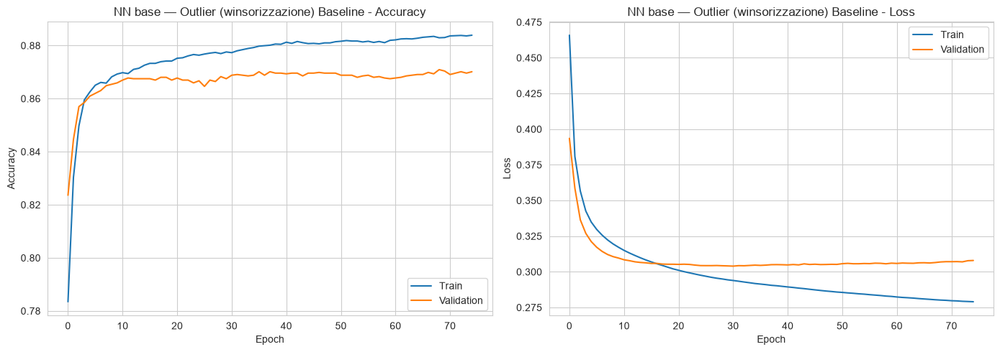

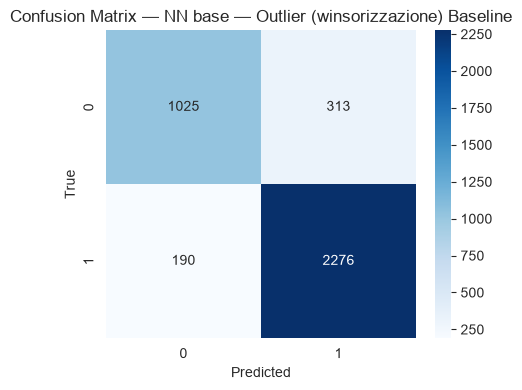

AUC: 0.9214

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.77      0.80      1338
           1       0.88      0.92      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.87      0.87      0.87      3804


 RISULTATI: NN pro — Outlier (winsorizzazione) Baseline
Test loss: 0.3321 - Test accuracy: 0.8601


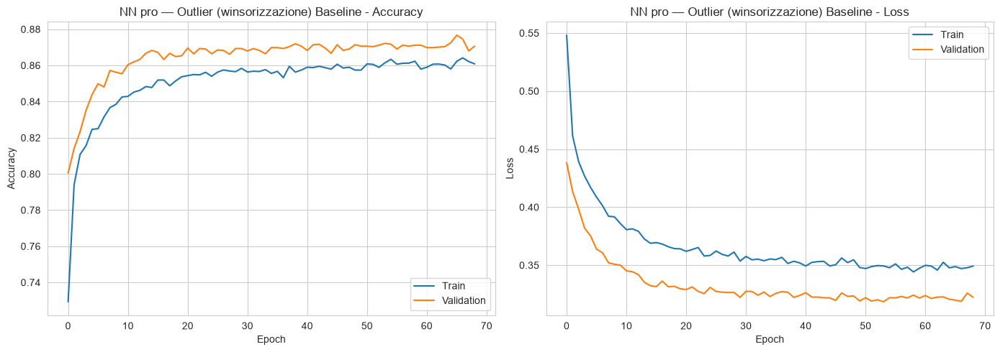

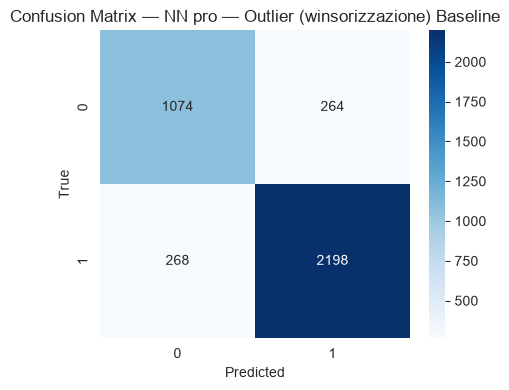

AUC: 0.9238

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.85      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Outlier (winsorizzazione) Baseline


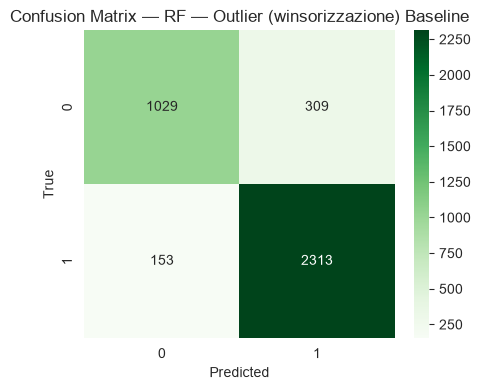

Accuracy: 0.8785
AUC: 0.9300

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.77      0.82      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.88      3804


 RISULTATI: NN base — Outlier (winsorizzazione) Rumore 10%
Test loss: 0.3237 - Test accuracy: 0.8657


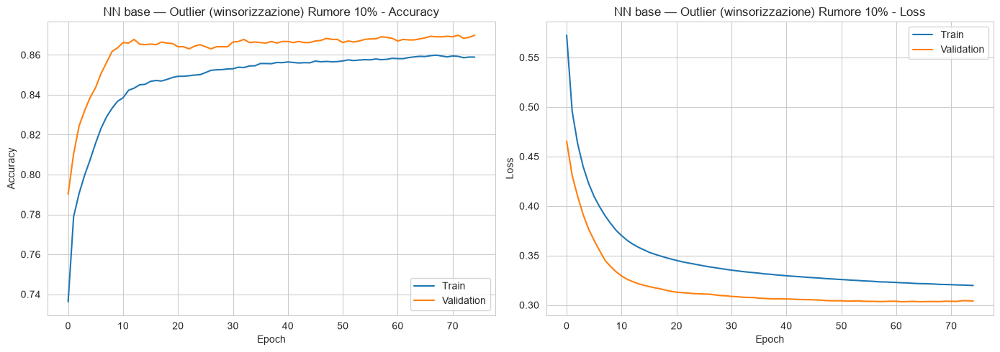

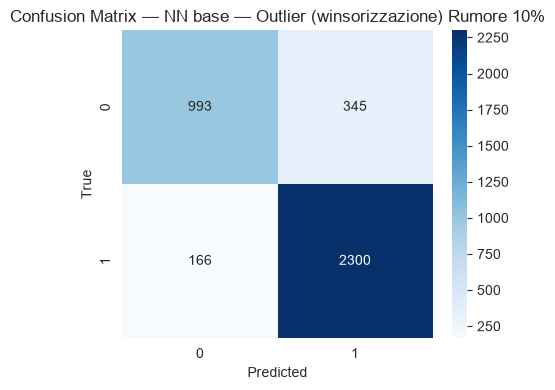

AUC: 0.9196

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.86      0.74      0.80      1338
           1       0.87      0.93      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.87      0.87      0.86      3804


 RISULTATI: NN pro — Outlier (winsorizzazione) Rumore 10%
Test loss: 0.3394 - Test accuracy: 0.8583


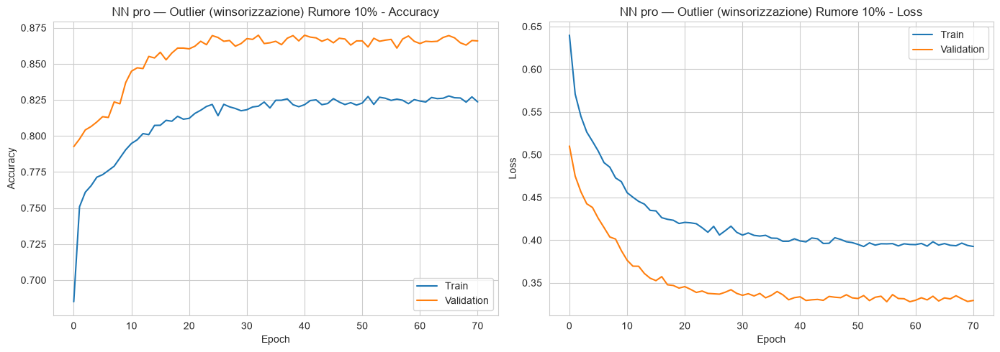

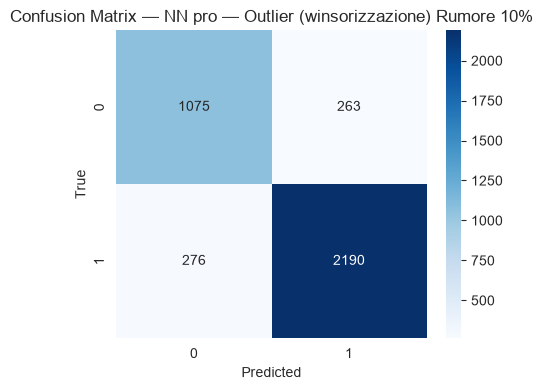

AUC: 0.9220

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.84      0.85      0.84      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Outlier (winsorizzazione) Rumore 10%


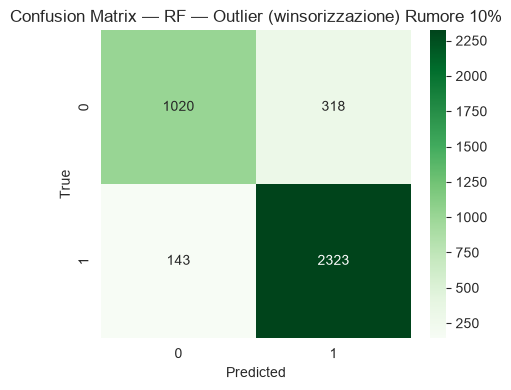

Accuracy: 0.8788
AUC: 0.9295

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.88      0.76      0.82      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.88      3804


 RISULTATI: NN base — Outlier (winsorizzazione) Rumore 25%
Test loss: 0.3299 - Test accuracy: 0.8628


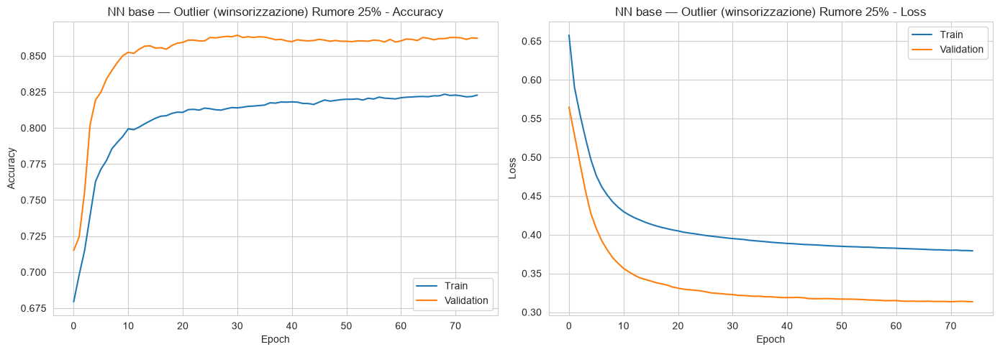

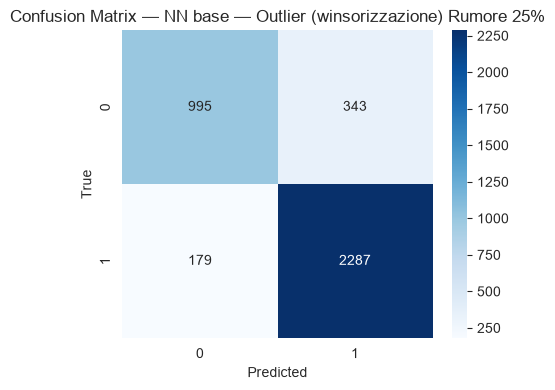

AUC: 0.9160

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.85      0.74      0.79      1338
           1       0.87      0.93      0.90      2466

    accuracy                           0.86      3804
   macro avg       0.86      0.84      0.84      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: NN pro — Outlier (winsorizzazione) Rumore 25%
Test loss: 0.3526 - Test accuracy: 0.8441


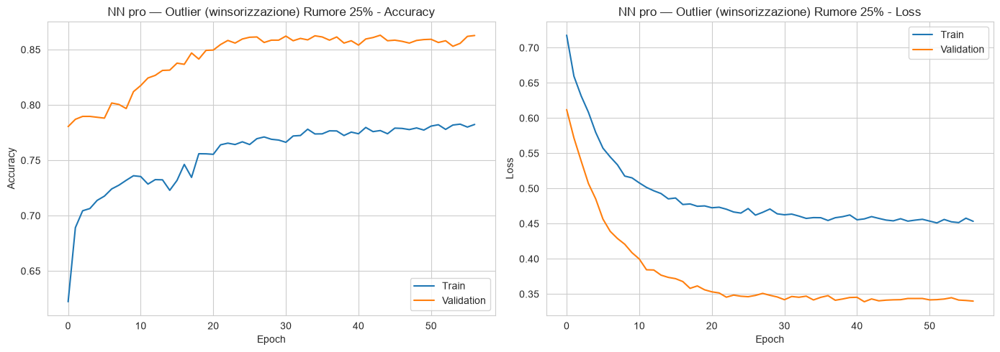

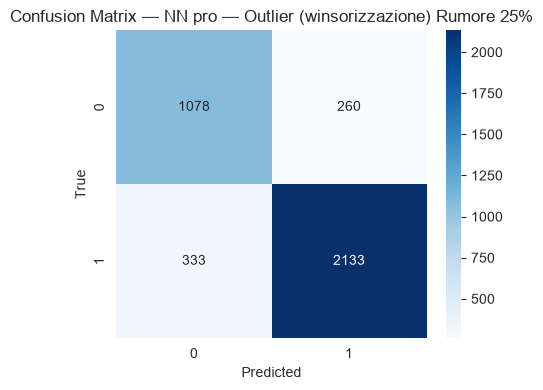

AUC: 0.9173

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.76      0.81      0.78      1338
           1       0.89      0.86      0.88      2466

    accuracy                           0.84      3804
   macro avg       0.83      0.84      0.83      3804
weighted avg       0.85      0.84      0.85      3804


 RISULTATI: RF — Outlier (winsorizzazione) Rumore 25%


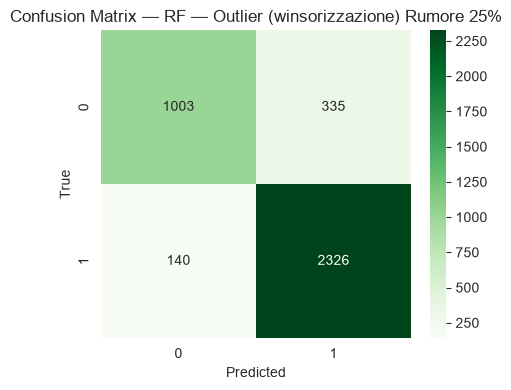

Accuracy: 0.8751
AUC: 0.9267

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.88      0.75      0.81      1338
           1       0.87      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.87      3804


 RISULTATI: NN base — Outlier (winsorizzazione) Rumore 40%
Test loss: 0.3387 - Test accuracy: 0.8615


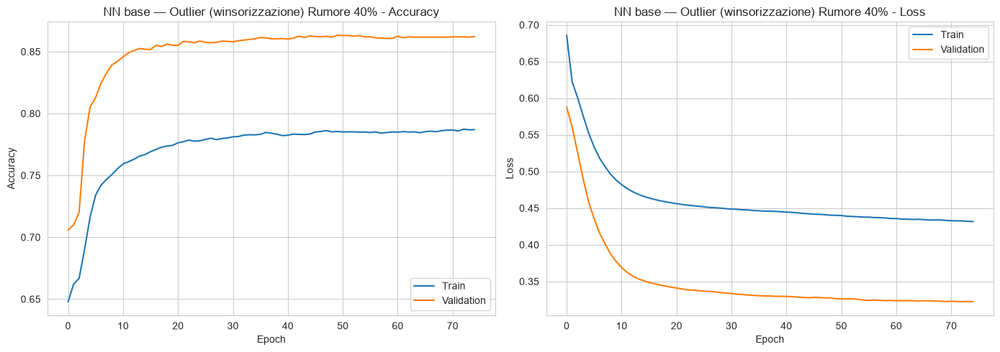

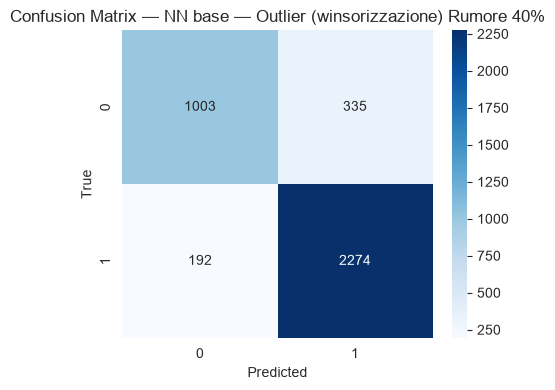

AUC: 0.9116

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.75      0.79      1338
           1       0.87      0.92      0.90      2466

    accuracy                           0.86      3804
   macro avg       0.86      0.84      0.84      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: NN pro — Outlier (winsorizzazione) Rumore 40%
Test loss: 0.3439 - Test accuracy: 0.8541


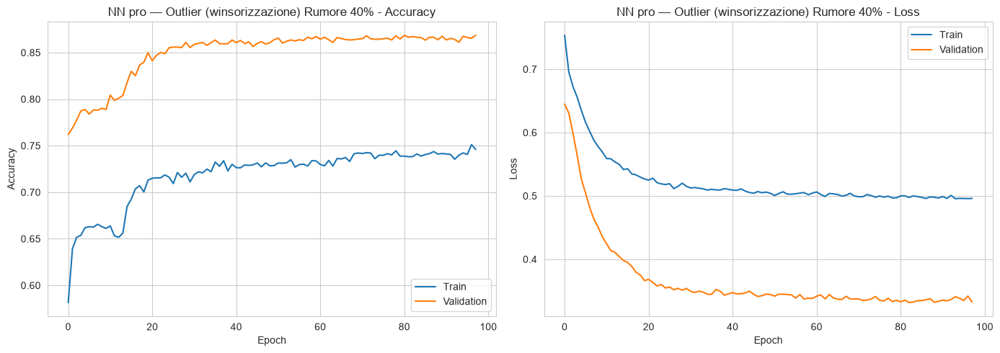

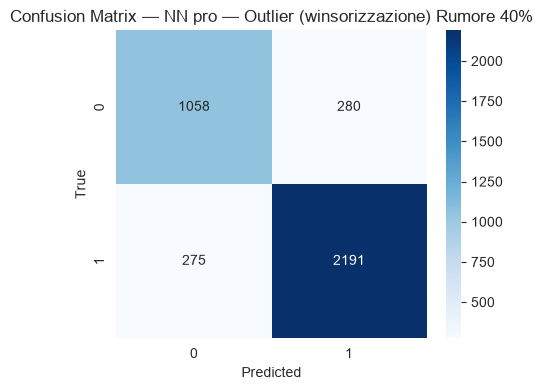

AUC: 0.9201

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.79      0.79      0.79      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.85      3804
   macro avg       0.84      0.84      0.84      3804
weighted avg       0.85      0.85      0.85      3804


 RISULTATI: RF — Outlier (winsorizzazione) Rumore 40%


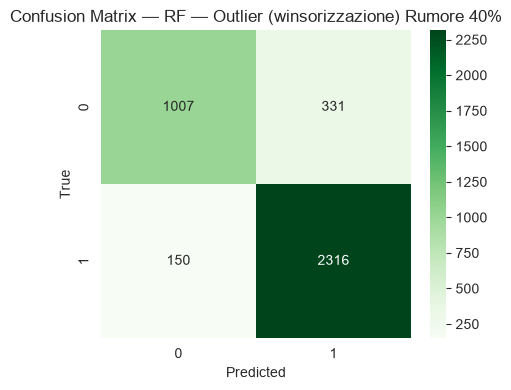

Accuracy: 0.8736
AUC: 0.9250

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.75      0.81      1338
           1       0.87      0.94      0.91      2466

    accuracy                           0.87      3804
   macro avg       0.87      0.85      0.86      3804
weighted avg       0.87      0.87      0.87      3804


>>> Confronto modelli — Outlier (winsorizzazione)


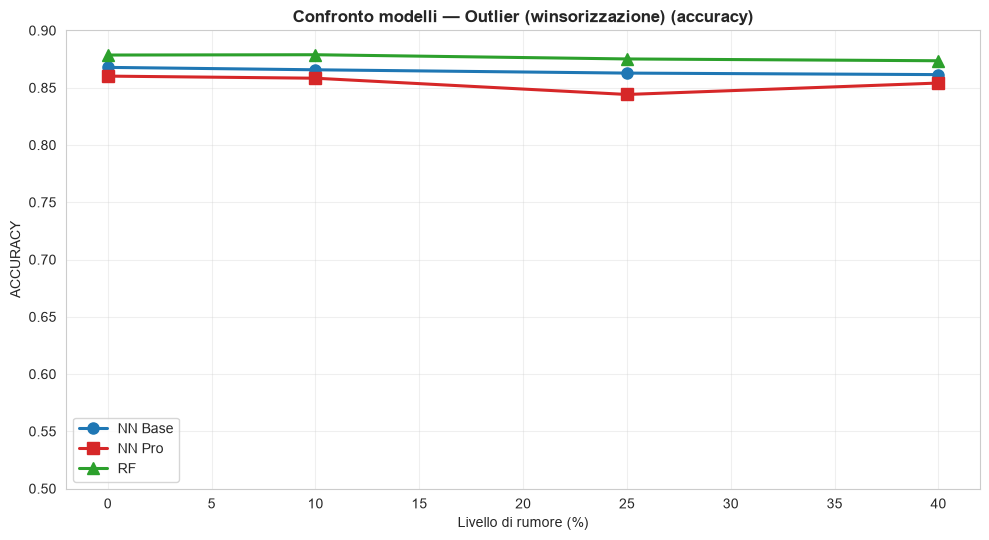

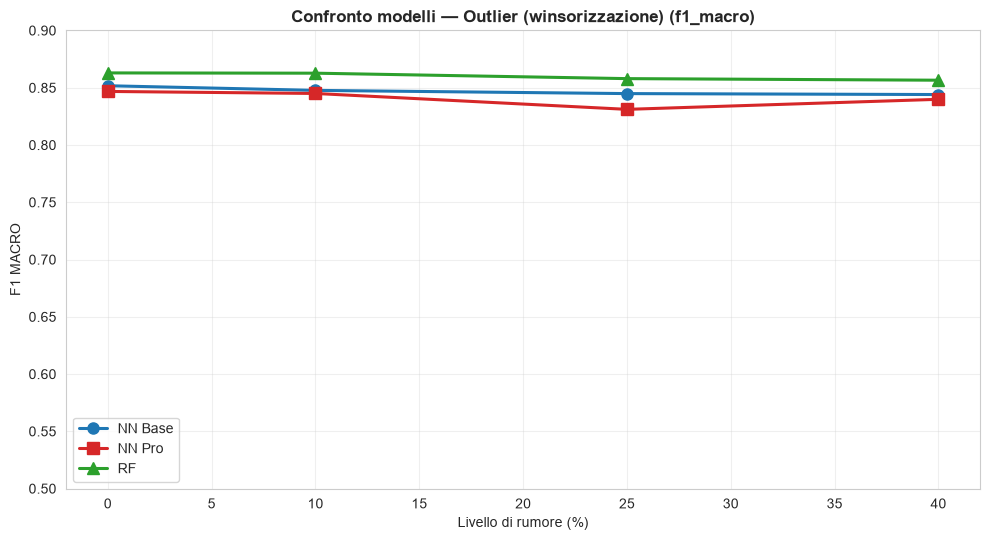

### Outlier — IMPUTAZIONE ###

 RISULTATI: NN base — Outlier (imputazione) Baseline
Test loss: 0.3236 - Test accuracy: 0.8678


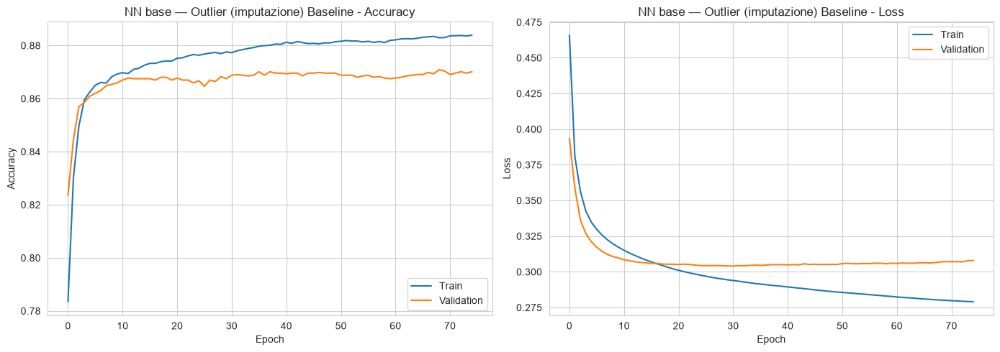

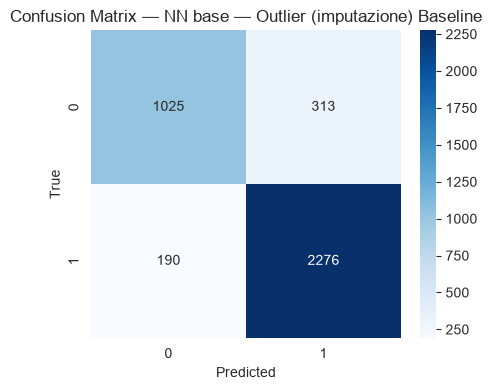

AUC: 0.9214

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.77      0.80      1338
           1       0.88      0.92      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.87      0.87      0.87      3804


 RISULTATI: NN pro — Outlier (imputazione) Baseline
Test loss: 0.3321 - Test accuracy: 0.8601


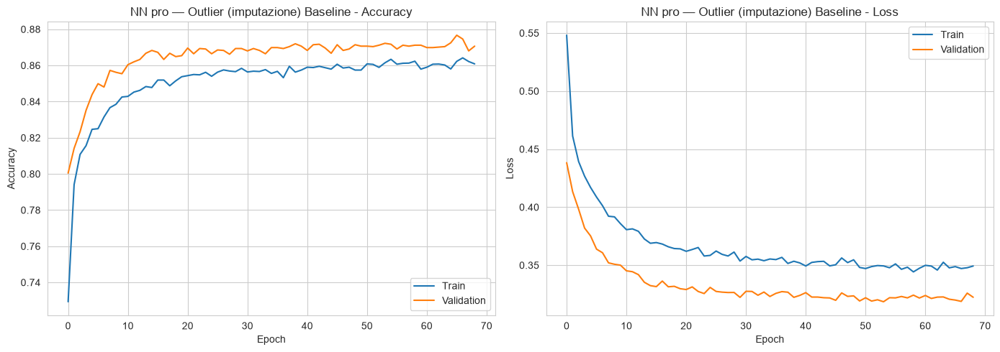

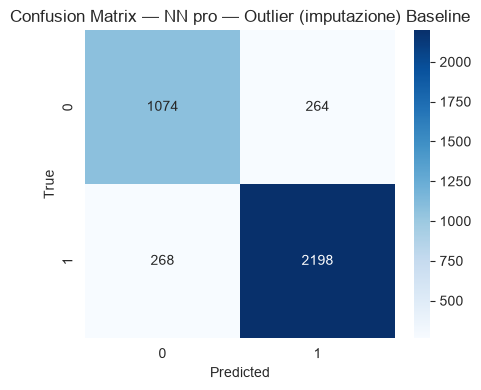

AUC: 0.9238

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.85      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Outlier (imputazione) Baseline


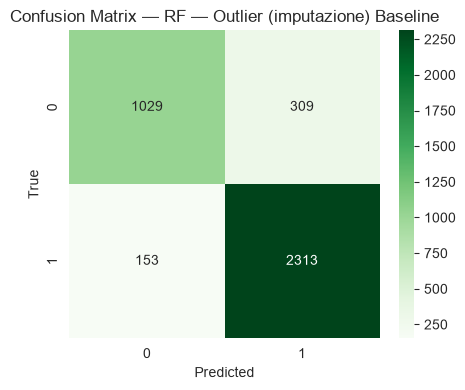

Accuracy: 0.8785
AUC: 0.9300

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.77      0.82      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.88      3804


 RISULTATI: NN base — Outlier (imputazione) Rumore 10%
Test loss: 0.3277 - Test accuracy: 0.8670


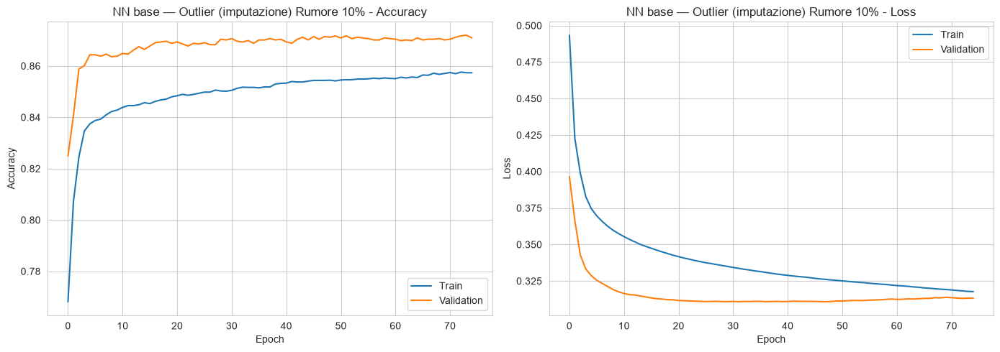

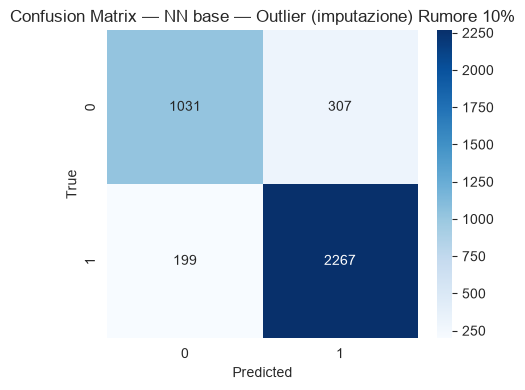

AUC: 0.9210

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.77      0.80      1338
           1       0.88      0.92      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.87      0.87      0.87      3804


 RISULTATI: NN pro — Outlier (imputazione) Rumore 10%
Test loss: 0.3391 - Test accuracy: 0.8591


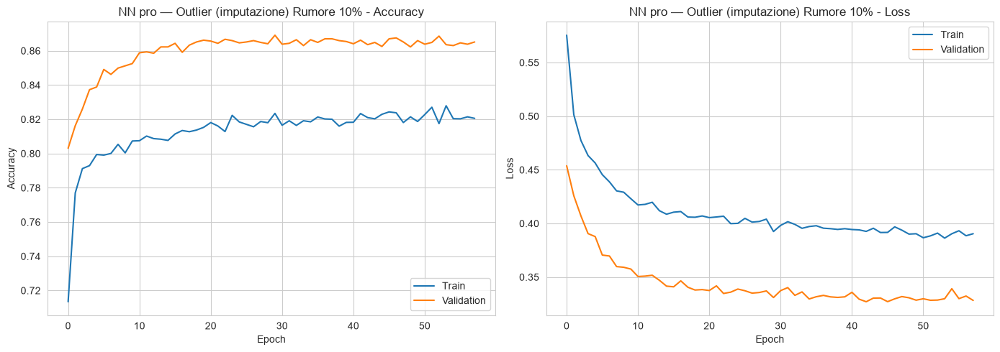

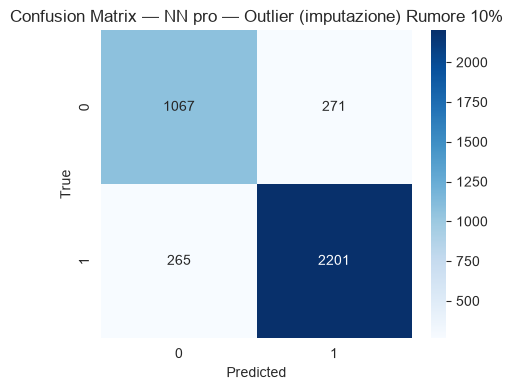

AUC: 0.9209

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.84      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Outlier (imputazione) Rumore 10%


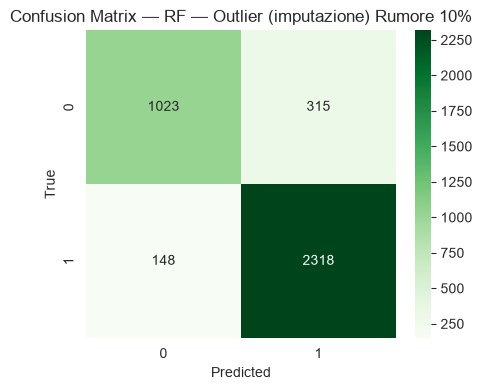

Accuracy: 0.8783
AUC: 0.9285

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.76      0.82      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.88      3804


 RISULTATI: NN base — Outlier (imputazione) Rumore 25%
Test loss: 0.3312 - Test accuracy: 0.8665


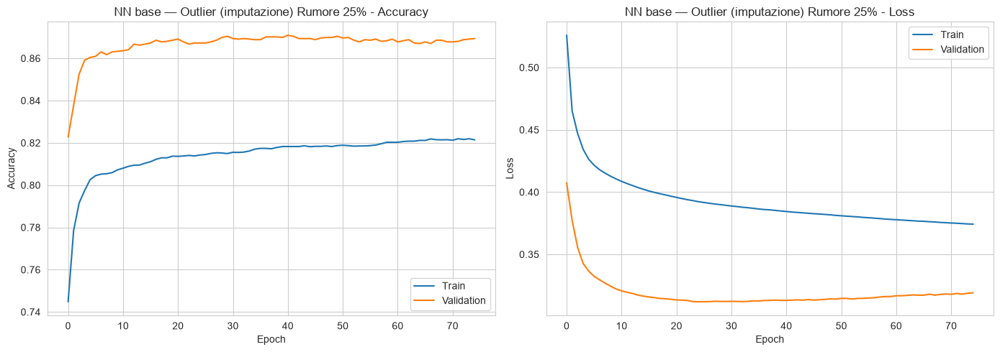

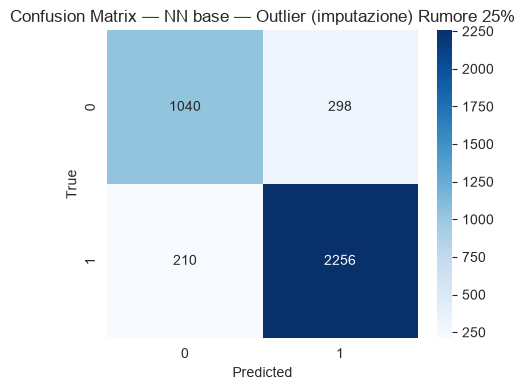

AUC: 0.9198

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.83      0.78      0.80      1338
           1       0.88      0.91      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.86      0.85      0.85      3804
weighted avg       0.87      0.87      0.87      3804


 RISULTATI: NN pro — Outlier (imputazione) Rumore 25%
Test loss: 0.3384 - Test accuracy: 0.8604


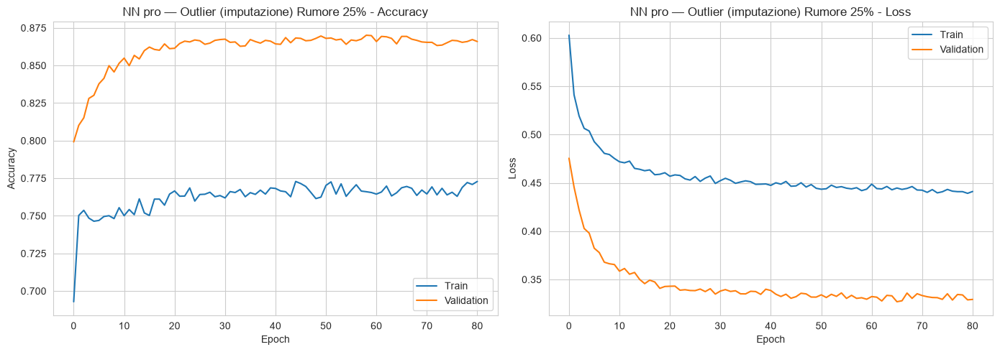

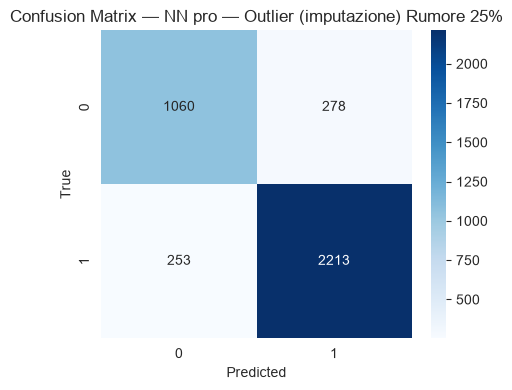

AUC: 0.9216

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.81      0.79      0.80      1338
           1       0.89      0.90      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.84      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Outlier (imputazione) Rumore 25%


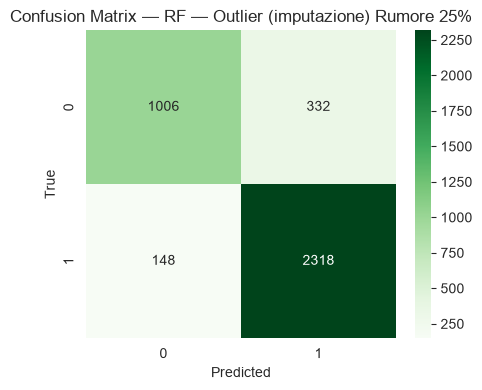

Accuracy: 0.8738
AUC: 0.9259

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.75      0.81      1338
           1       0.87      0.94      0.91      2466

    accuracy                           0.87      3804
   macro avg       0.87      0.85      0.86      3804
weighted avg       0.87      0.87      0.87      3804


 RISULTATI: NN base — Outlier (imputazione) Rumore 40%
Test loss: 0.3342 - Test accuracy: 0.8633


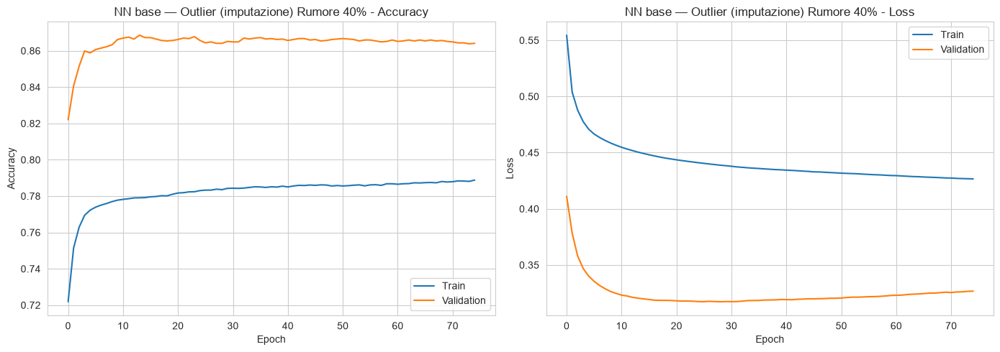

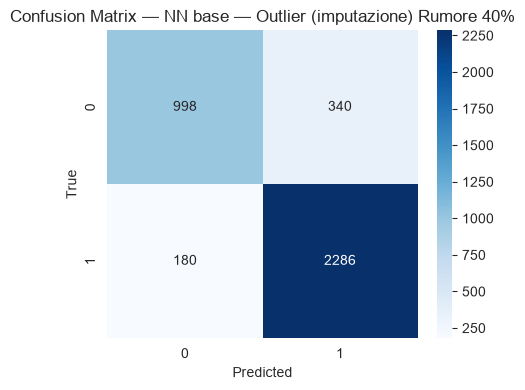

AUC: 0.9159

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.85      0.75      0.79      1338
           1       0.87      0.93      0.90      2466

    accuracy                           0.86      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: NN pro — Outlier (imputazione) Rumore 40%
Test loss: 0.3401 - Test accuracy: 0.8630


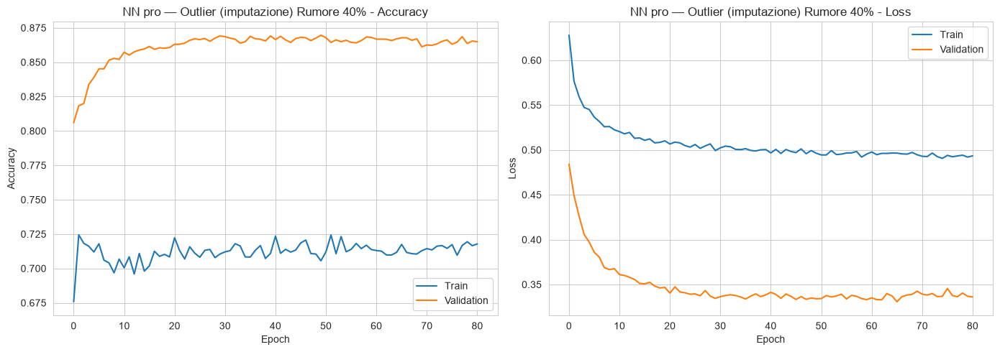

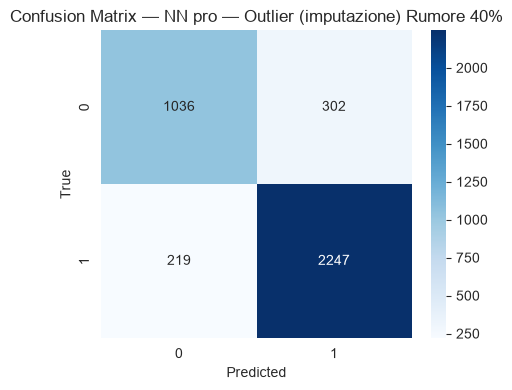

AUC: 0.9195

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.83      0.77      0.80      1338
           1       0.88      0.91      0.90      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.84      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Outlier (imputazione) Rumore 40%


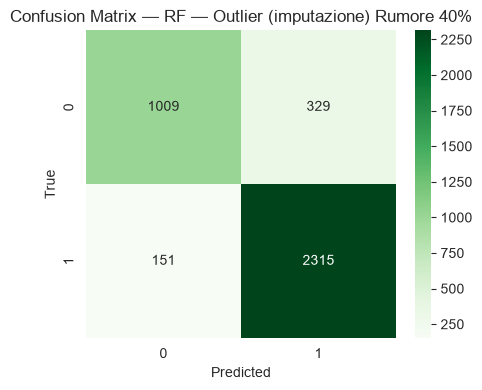

Accuracy: 0.8738
AUC: 0.9223

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.75      0.81      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.87      3804
   macro avg       0.87      0.85      0.86      3804
weighted avg       0.87      0.87      0.87      3804


>>> Confronto modelli — Outlier (imputazione)


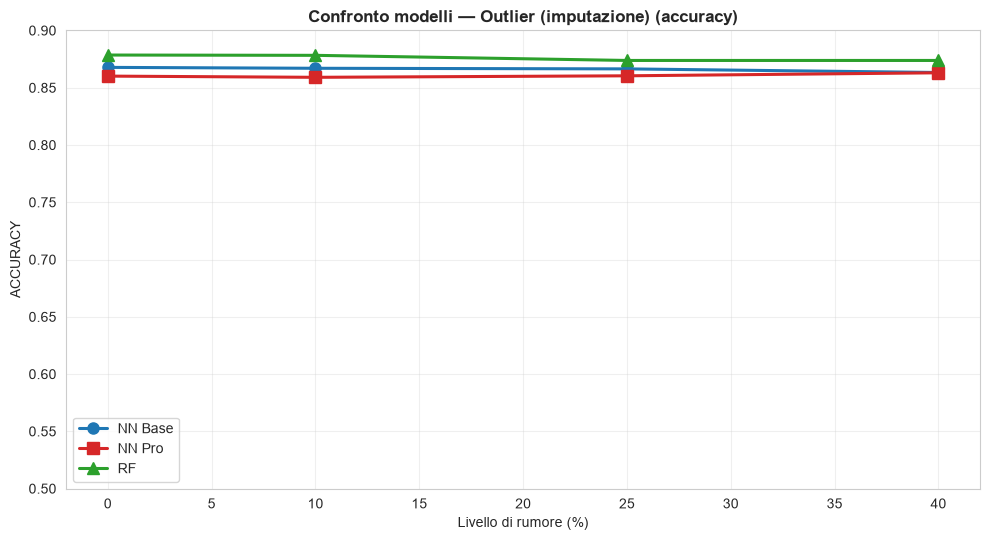

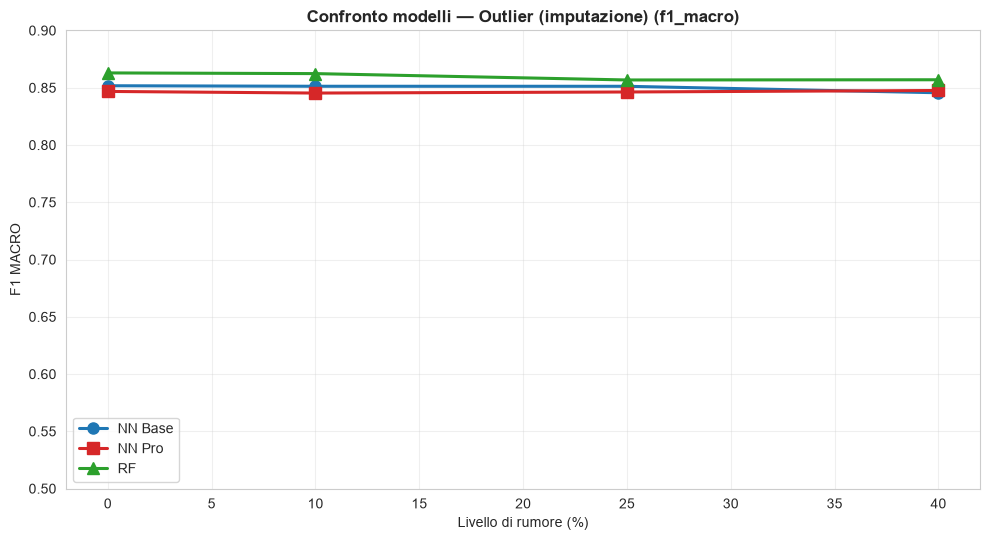

In [21]:
def make_outlier(strategy):
    def _f(lvl, s):
        if lvl == 0:
            return X_train_scaled, np.array(y_train), X_val_scaled, np.array(y_val), X_test_scaled, np.array(y_test)
        Xtr = add_outliers(X_train_scaled, outlier_rate=lvl, magnitude=5.0, seed=s)
        if strategy == 'winsorize':
            Xtr = winsorize_features(Xtr)
        elif strategy == 'impute':
            Xtr = impute_outliers(Xtr)
        # 'leave' -> nessuna correzione
        return Xtr, np.array(y_train), X_val_scaled, np.array(y_val), X_test_scaled, np.array(y_test)
    return _f

print('### Outlier — LASCIATI ###')
dfs_out_leave = run_noise_section('Outlier (lasciati)',        make_outlier('leave'),     seed=seed)
print('### Outlier — WINSORIZZAZIONE ###')
dfs_out_wins  = run_noise_section('Outlier (winsorizzazione)', make_outlier('winsorize'), seed=seed)
print('### Outlier — IMPUTAZIONE ###')
dfs_out_imp   = run_noise_section('Outlier (imputazione)',     make_outlier('impute'),    seed=seed)

for m in AGG:
    AGG[m]['Outlier'] = dfs_out_wins[m]  # variante canonica = winsorizzazione

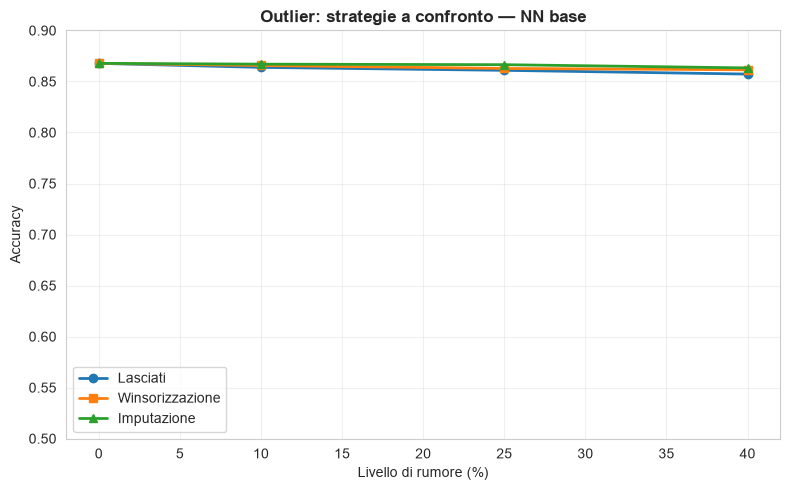

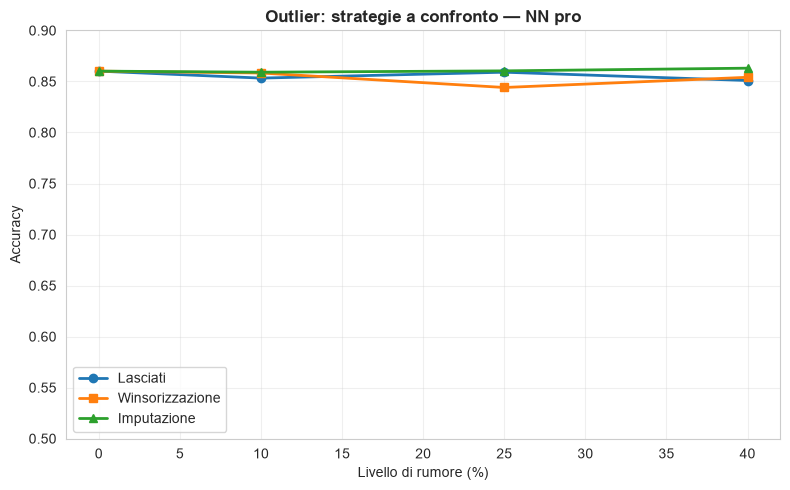

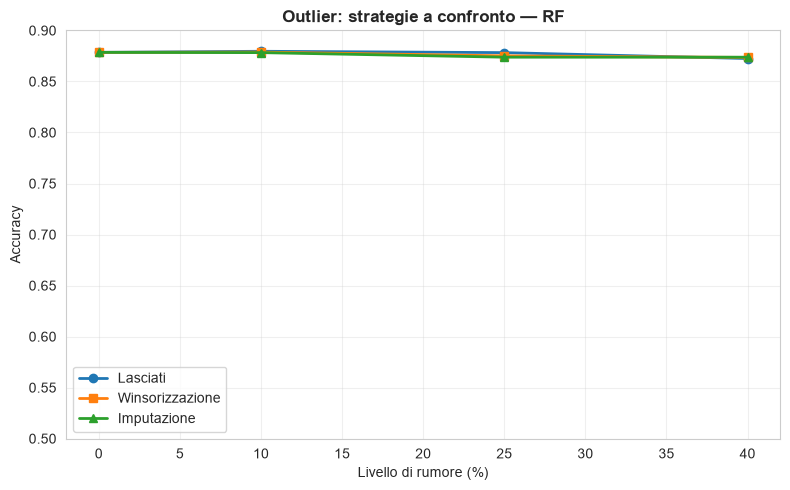

In [22]:
# Confronto diretto delle tre strategie sugli outlier (accuracy) per modello
for m in ['NN base', 'NN pro', 'RF']:
    plt.figure(figsize=(8, 5))
    plt.plot(dfs_out_leave[m]['livello'], dfs_out_leave[m]['accuracy'], marker='o', lw=2, label='Lasciati')
    plt.plot(dfs_out_wins[m]['livello'],  dfs_out_wins[m]['accuracy'],  marker='s', lw=2, label='Winsorizzazione')
    plt.plot(dfs_out_imp[m]['livello'],   dfs_out_imp[m]['accuracy'],   marker='^', lw=2, label='Imputazione')
    plt.xlabel('Livello di rumore (%)'); plt.ylabel('Accuracy')
    plt.ylim(*YLIM_CONFRONTO)
    plt.title(f'Outlier: strategie a confronto — {m}', fontweight='bold')
    plt.grid(alpha=0.3); plt.legend(); plt.tight_layout(); plt.show()

# Sezione F — Missing Feature (sensore guasto)

  livello 0% -> rimosse 0 feature: []

 RISULTATI: NN base — Missing feature Baseline
Test loss: 0.3236 - Test accuracy: 0.8678


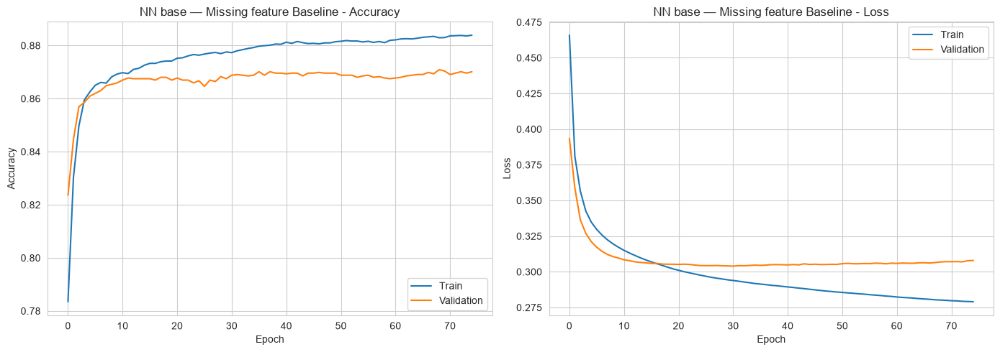

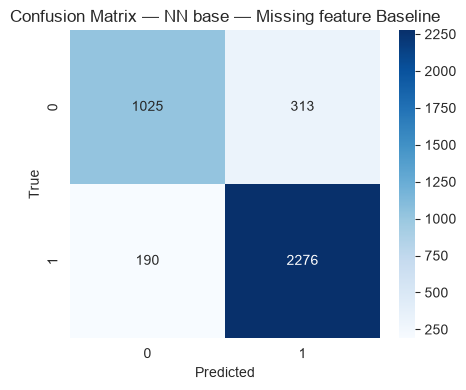

AUC: 0.9214

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.84      0.77      0.80      1338
           1       0.88      0.92      0.90      2466

    accuracy                           0.87      3804
   macro avg       0.86      0.84      0.85      3804
weighted avg       0.87      0.87      0.87      3804


 RISULTATI: NN pro — Missing feature Baseline
Test loss: 0.3321 - Test accuracy: 0.8601


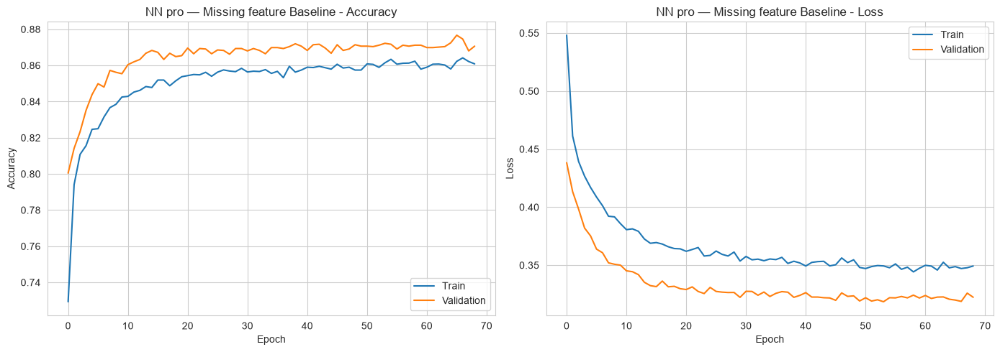

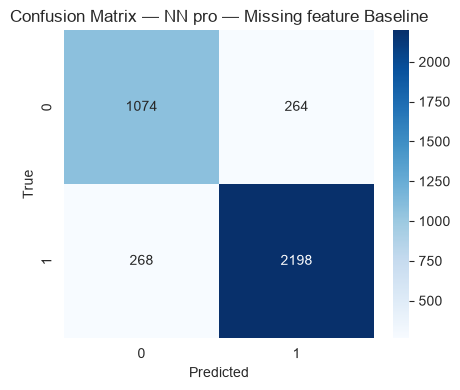

AUC: 0.9238

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.80      0.80      1338
           1       0.89      0.89      0.89      2466

    accuracy                           0.86      3804
   macro avg       0.85      0.85      0.85      3804
weighted avg       0.86      0.86      0.86      3804


 RISULTATI: RF — Missing feature Baseline


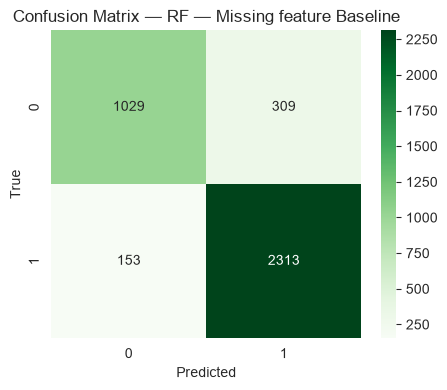

Accuracy: 0.8785
AUC: 0.9300

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.87      0.77      0.82      1338
           1       0.88      0.94      0.91      2466

    accuracy                           0.88      3804
   macro avg       0.88      0.85      0.86      3804
weighted avg       0.88      0.88      0.88      3804

  livello 10% -> rimosse 1 feature: ['fAlpha']

 RISULTATI: NN base — Missing feature Rumore 10%
Test loss: 0.4061 - Test accuracy: 0.8215


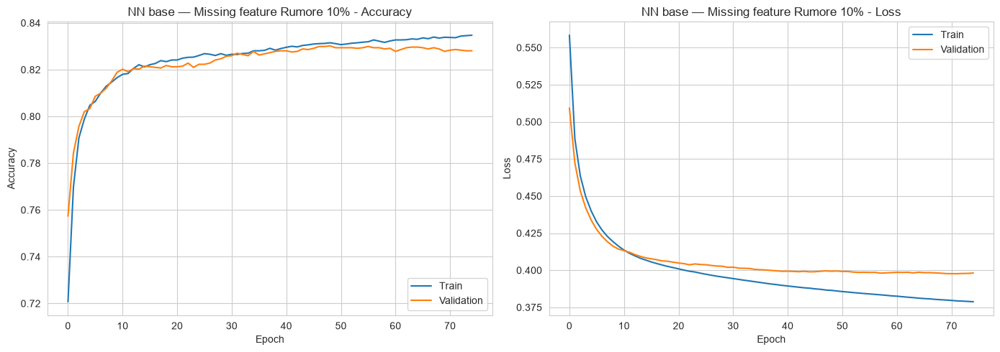

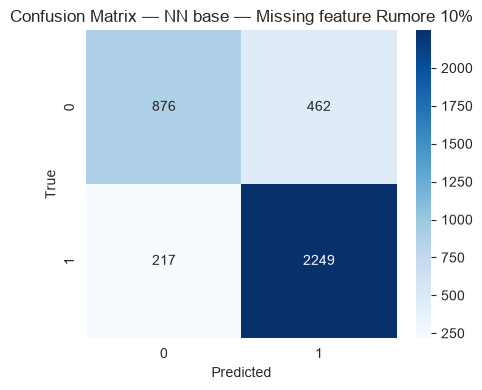

AUC: 0.8675

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.80      0.65      0.72      1338
           1       0.83      0.91      0.87      2466

    accuracy                           0.82      3804
   macro avg       0.82      0.78      0.79      3804
weighted avg       0.82      0.82      0.82      3804


 RISULTATI: NN pro — Missing feature Rumore 10%
Test loss: 0.4297 - Test accuracy: 0.8052


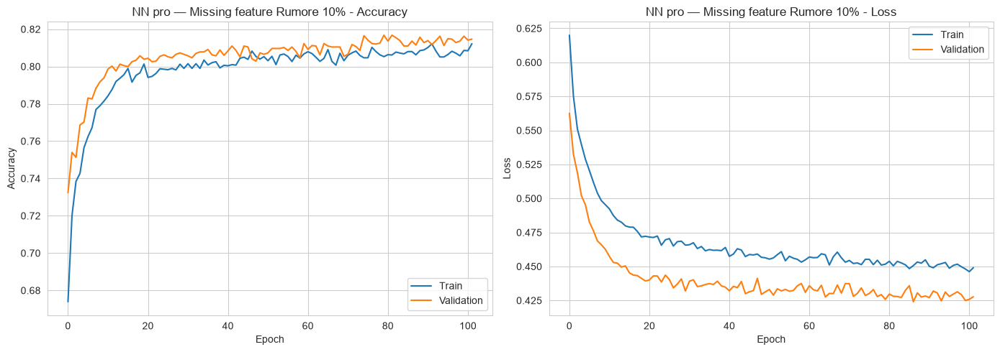

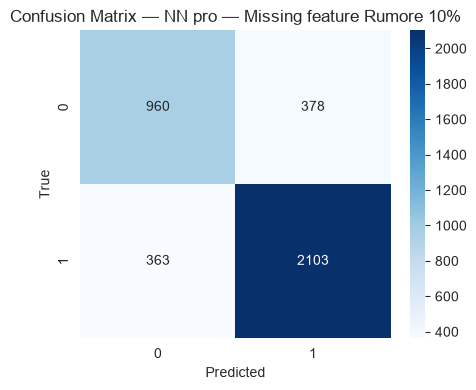

AUC: 0.8716

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.73      0.72      0.72      1338
           1       0.85      0.85      0.85      2466

    accuracy                           0.81      3804
   macro avg       0.79      0.79      0.79      3804
weighted avg       0.80      0.81      0.80      3804


 RISULTATI: RF — Missing feature Rumore 10%


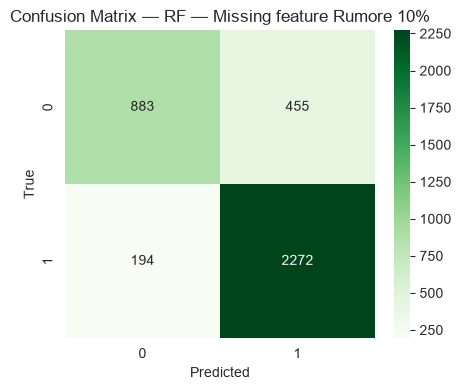

Accuracy: 0.8294
AUC: 0.8788

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.82      0.66      0.73      1338
           1       0.83      0.92      0.88      2466

    accuracy                           0.83      3804
   macro avg       0.83      0.79      0.80      3804
weighted avg       0.83      0.83      0.82      3804

  livello 25% -> rimosse 3 feature: ['fAlpha', 'fLength', 'fWidth']

 RISULTATI: NN base — Missing feature Rumore 25%
Test loss: 0.4857 - Test accuracy: 0.7773


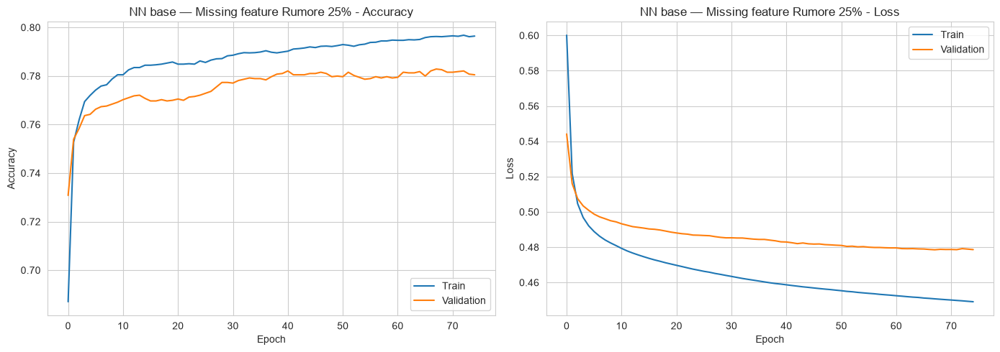

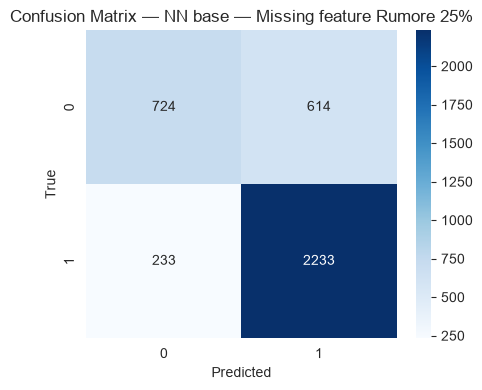

AUC: 0.8007

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.76      0.54      0.63      1338
           1       0.78      0.91      0.84      2466

    accuracy                           0.78      3804
   macro avg       0.77      0.72      0.74      3804
weighted avg       0.77      0.78      0.77      3804


 RISULTATI: NN pro — Missing feature Rumore 25%
Test loss: 0.5061 - Test accuracy: 0.7574


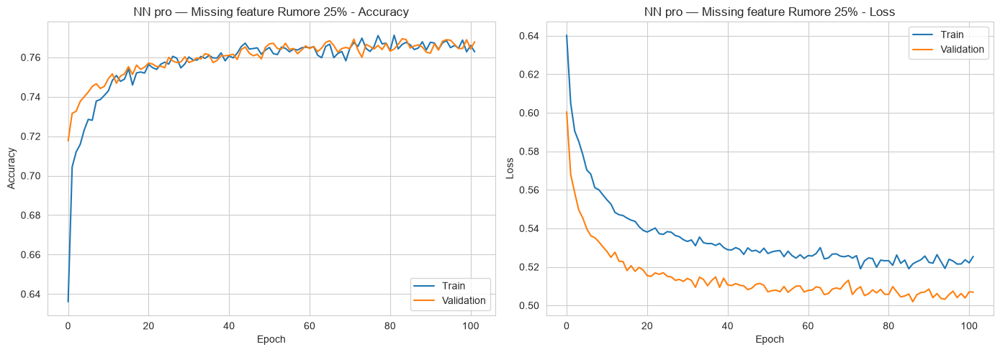

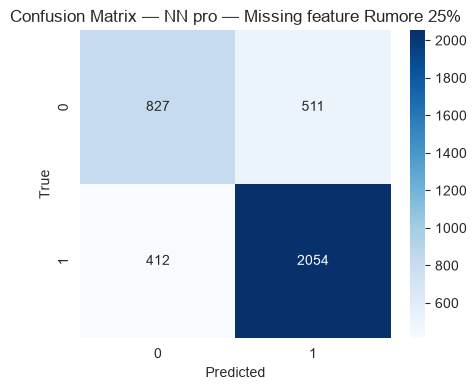

AUC: 0.7991

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.67      0.62      0.64      1338
           1       0.80      0.83      0.82      2466

    accuracy                           0.76      3804
   macro avg       0.73      0.73      0.73      3804
weighted avg       0.75      0.76      0.76      3804


 RISULTATI: RF — Missing feature Rumore 25%


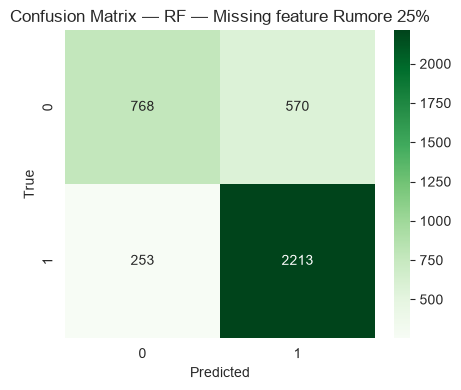

Accuracy: 0.7836
AUC: 0.8195

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.75      0.57      0.65      1338
           1       0.80      0.90      0.84      2466

    accuracy                           0.78      3804
   macro avg       0.77      0.74      0.75      3804
weighted avg       0.78      0.78      0.78      3804

  livello 40% -> rimosse 5 feature: ['fAlpha', 'fLength', 'fWidth', 'fSize', 'fM3Long']

 RISULTATI: NN base — Missing feature Rumore 40%
Test loss: 0.5441 - Test accuracy: 0.7303


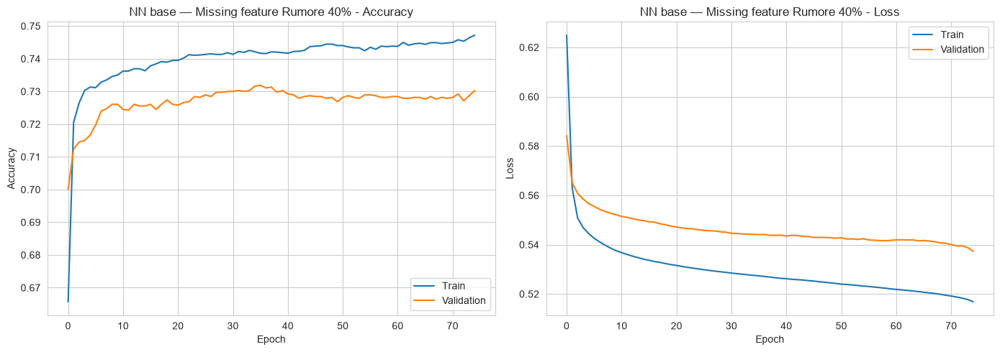

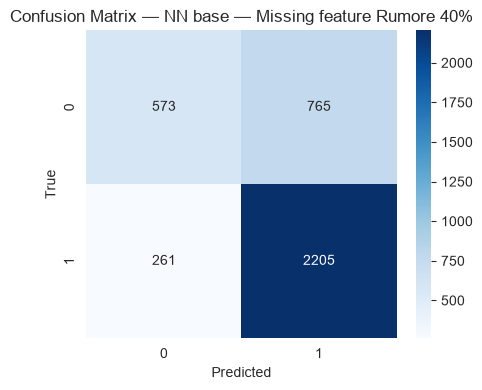

AUC: 0.7413

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.69      0.43      0.53      1338
           1       0.74      0.89      0.81      2466

    accuracy                           0.73      3804
   macro avg       0.71      0.66      0.67      3804
weighted avg       0.72      0.73      0.71      3804


 RISULTATI: NN pro — Missing feature Rumore 40%
Test loss: 0.5774 - Test accuracy: 0.6995


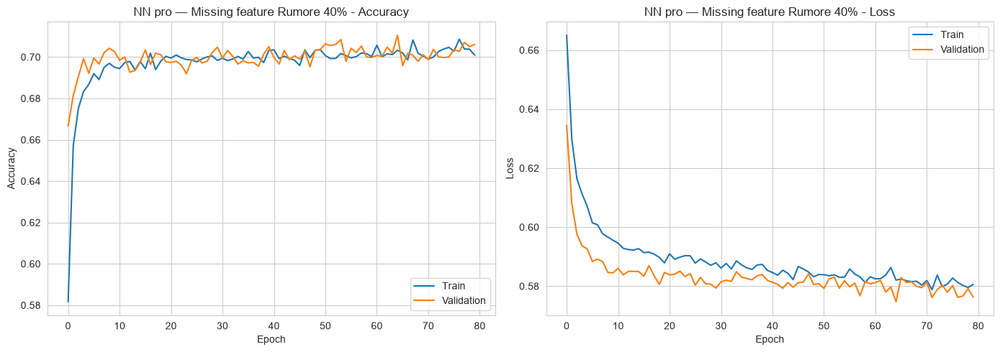

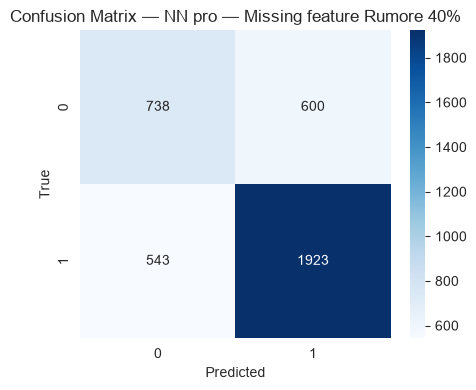

AUC: 0.7347

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.58      0.55      0.56      1338
           1       0.76      0.78      0.77      2466

    accuracy                           0.70      3804
   macro avg       0.67      0.67      0.67      3804
weighted avg       0.70      0.70      0.70      3804


 RISULTATI: RF — Missing feature Rumore 40%


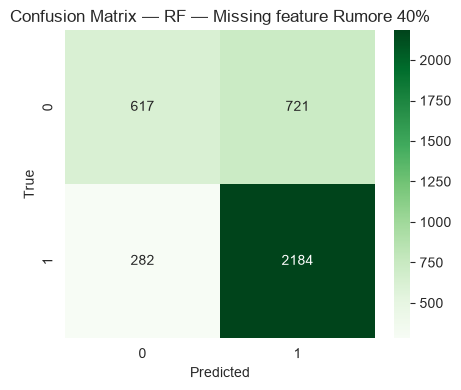

Accuracy: 0.7363
AUC: 0.7494

Report di Classificazione:
              precision    recall  f1-score   support

           0       0.69      0.46      0.55      1338
           1       0.75      0.89      0.81      2466

    accuracy                           0.74      3804
   macro avg       0.72      0.67      0.68      3804
weighted avg       0.73      0.74      0.72      3804


>>> Confronto modelli — Missing feature


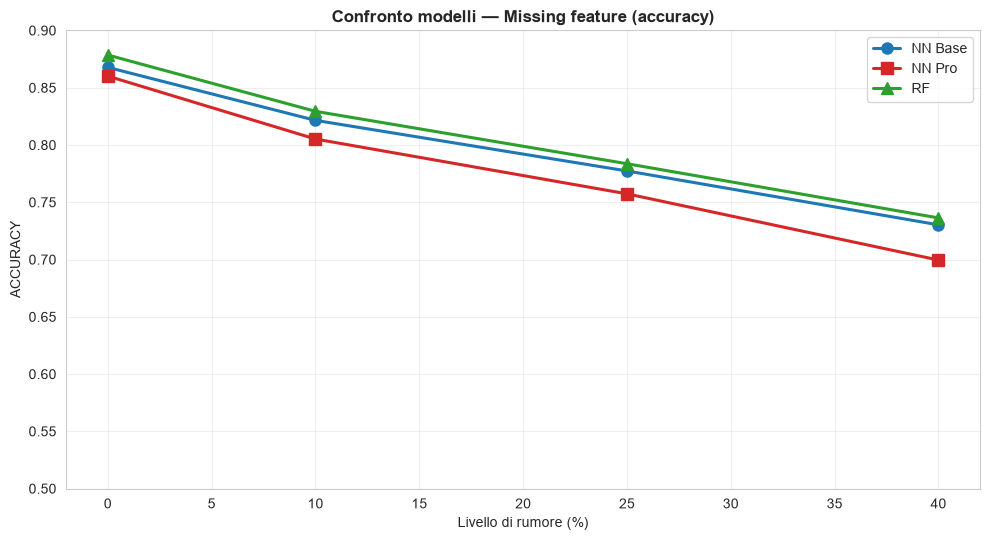

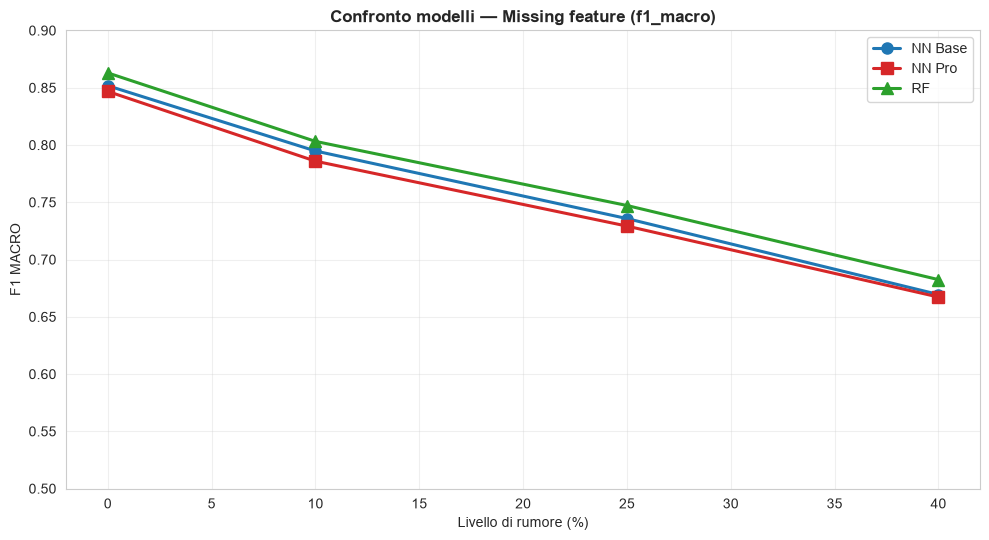

In [23]:
top_feats = list(fi.index)                  # feature ordinate per importanza (desc)
LEVEL_TO_K = {0: 0, 10: 1, 25: 3, 40: 5}    # livello% -> n. feature rimosse

def make_missfeat(lvl, s):
    k = LEVEL_TO_K[int(round(lvl * 100))]
    idxs = [feature_names.index(f) for f in top_feats[:k]]
    Xtr  = delete_feature(X_train_scaled, idxs) if idxs else X_train_scaled
    Xval = delete_feature(X_val_scaled,   idxs) if idxs else X_val_scaled
    Xte  = delete_feature(X_test_scaled,  idxs) if idxs else X_test_scaled
    print(f'  livello {int(round(lvl*100))}% -> rimosse {k} feature: {top_feats[:k]}')
    return Xtr, np.array(y_train), Xval, np.array(y_val), Xte, np.array(y_test)

dfs_mf = run_noise_section('Missing feature', make_missfeat, seed=seed)
for m in AGG:
    AGG[m]['Missing feature'] = dfs_mf[m]

# Confronto Aggregato Finale (modello per modello)

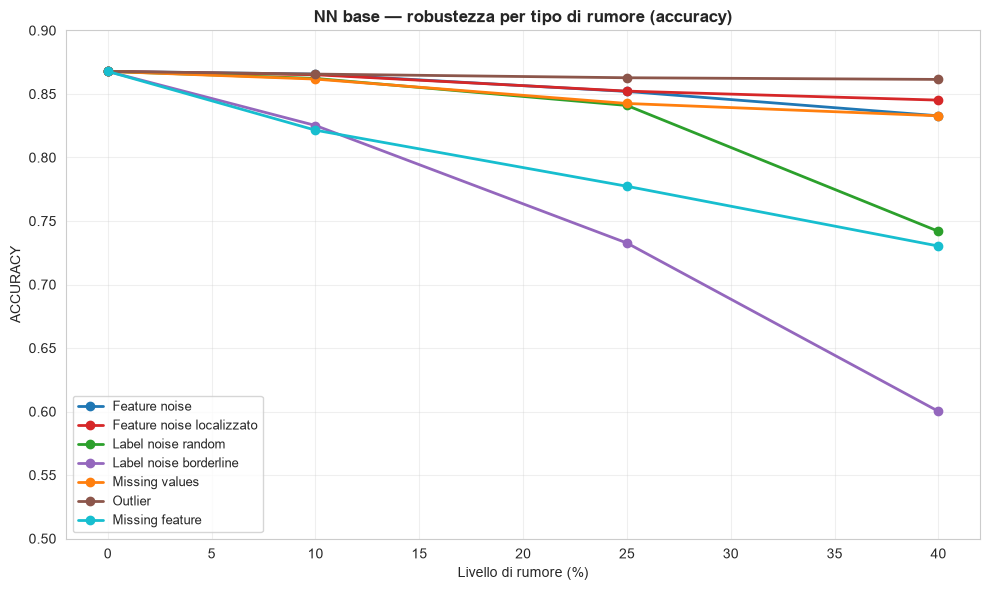

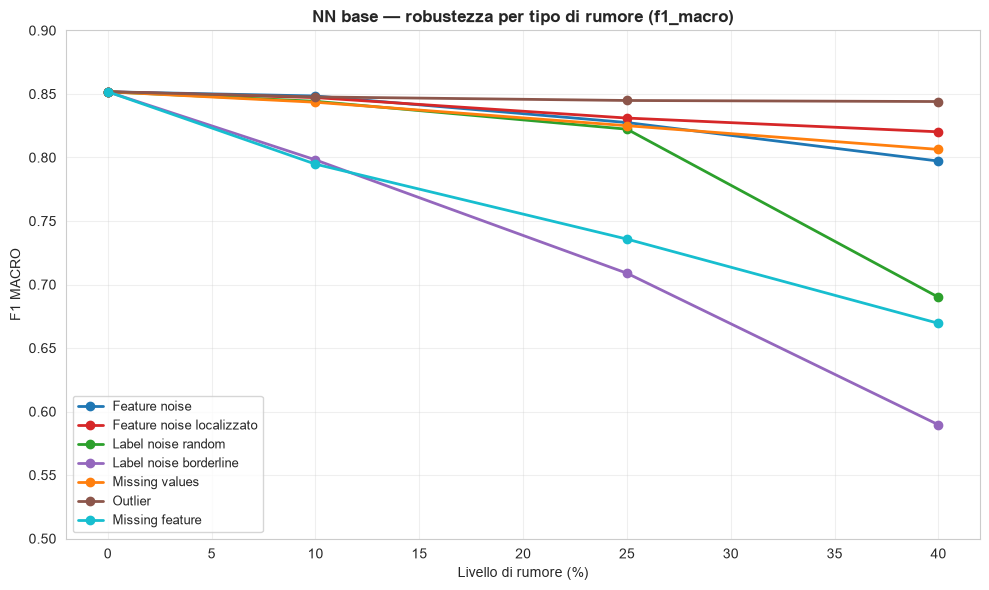

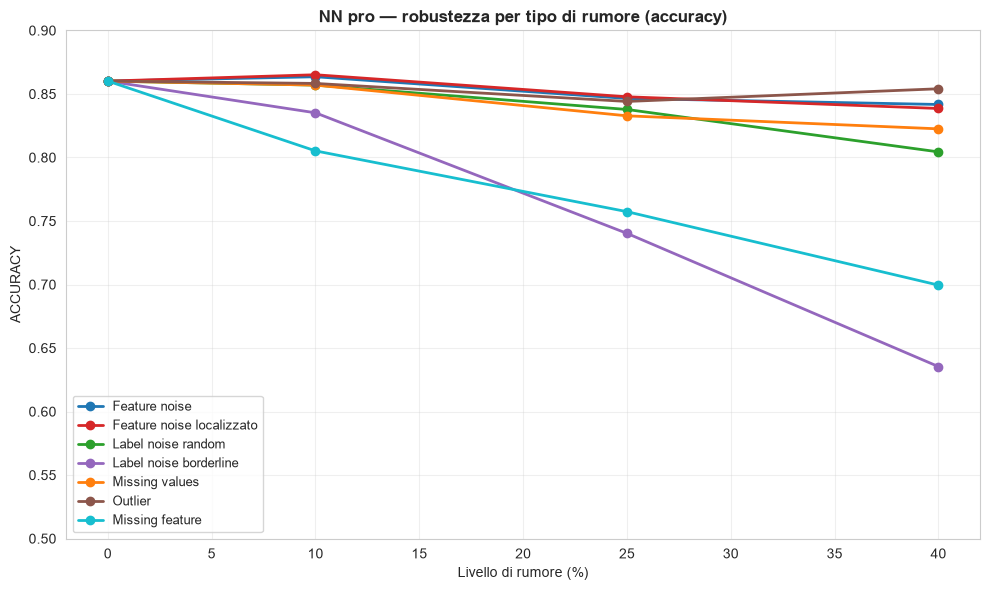

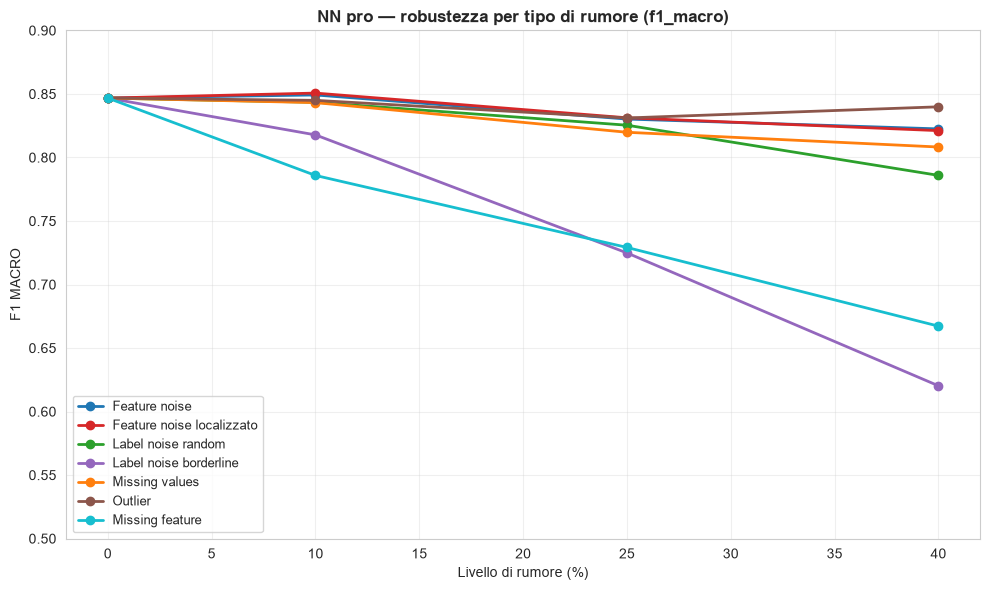

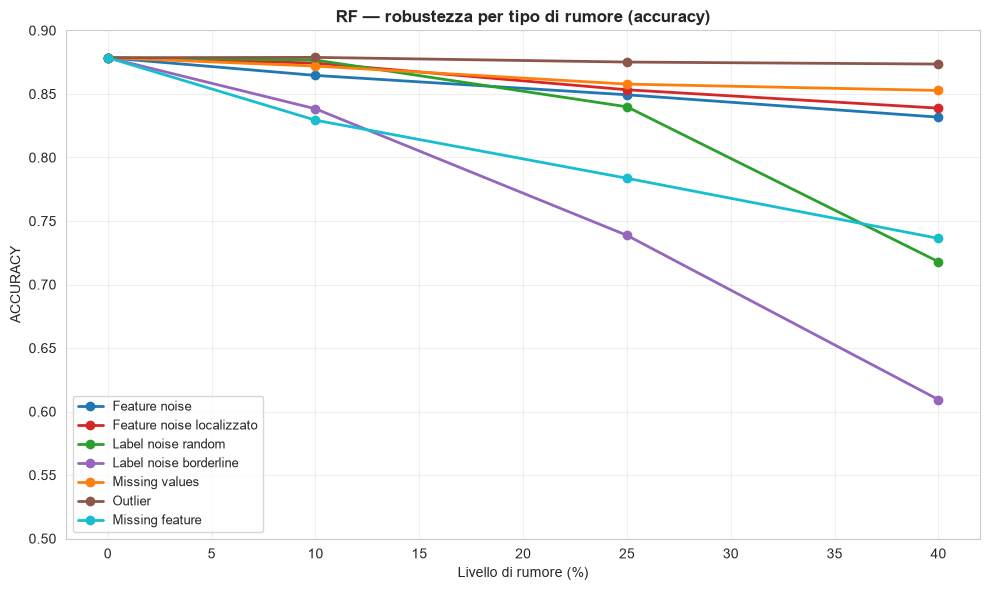

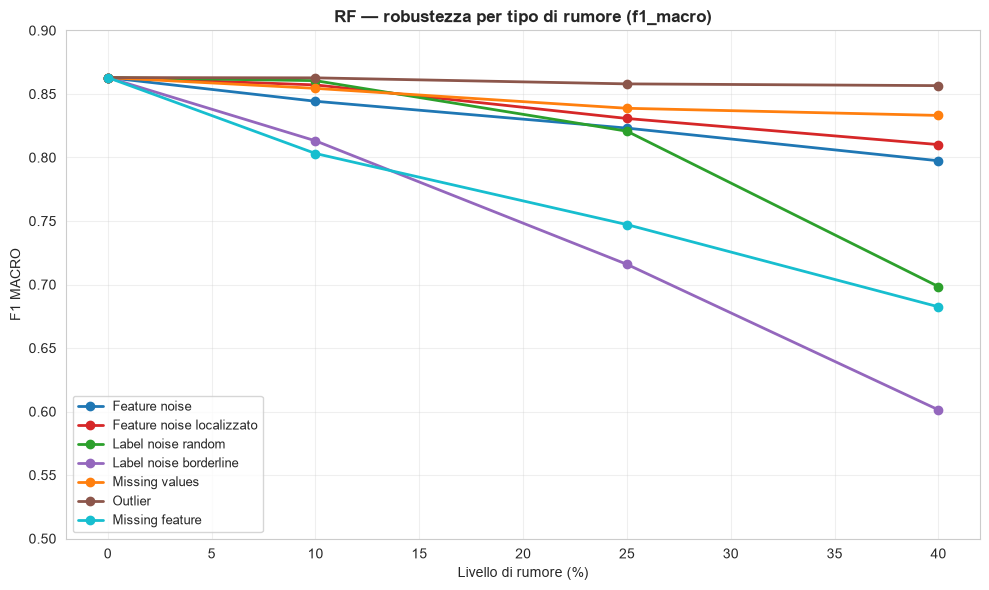

In [24]:
for m in ['NN base', 'NN pro', 'RF']:
    plot_aggregate_per_model(m, AGG[m], 'accuracy')
    plot_aggregate_per_model(m, AGG[m], 'f1_macro')

## Tabella riassuntiva e grafici sintetici

In [25]:
def get_val(df, livello, metric):
    r = df[df['livello'] == livello]
    return float(r[metric].iloc[0]) if len(r) else float('nan')

summary_rows = []
for m in ['NN base', 'NN pro', 'RF']:
    for noise, df_ in AGG[m].items():
        for metric in ['accuracy', 'f1_macro', 'auc']:
            v0, v40 = get_val(df_, 0, metric), get_val(df_, 40, metric)
            summary_rows.append({'Modello': m, 'Rumore': noise, 'Metrica': metric,
                                 '@0%': f'{v0:.4f}', '@40%': f'{v40:.4f}', 'Delta': f'{v40 - v0:+.4f}'})

df_summary = pd.DataFrame(summary_rows)
print('=== TABELLA RIASSUNTIVA — Baseline (0%) vs Caso Peggiore (40%) ===')
print(df_summary.to_string(index=False))
df_summary.to_csv('risultati_summary.csv', index=False)
print('\nSalvata in risultati_summary.csv')

=== TABELLA RIASSUNTIVA — Baseline (0%) vs Caso Peggiore (40%) ===
Modello                    Rumore  Metrica    @0%   @40%   Delta
NN base             Feature noise accuracy 0.8678 0.8328 -0.0350
NN base             Feature noise f1_macro 0.8517 0.7972 -0.0545
NN base             Feature noise      auc 0.9214 0.8941 -0.0273
NN base Feature noise localizzato accuracy 0.8678 0.8452 -0.0226
NN base Feature noise localizzato f1_macro 0.8517 0.8202 -0.0315
NN base Feature noise localizzato      auc 0.9214 0.8991 -0.0223
NN base        Label noise random accuracy 0.8678 0.7419 -0.1259
NN base        Label noise random f1_macro 0.8517 0.6900 -0.1618
NN base        Label noise random      auc 0.9214 0.7513 -0.1701
NN base    Label noise borderline accuracy 0.8678 0.6002 -0.2676
NN base    Label noise borderline f1_macro 0.8517 0.5896 -0.2622
NN base    Label noise borderline      auc 0.9214 0.6656 -0.2558
NN base            Missing values accuracy 0.8678 0.8328 -0.0350
NN base            Miss

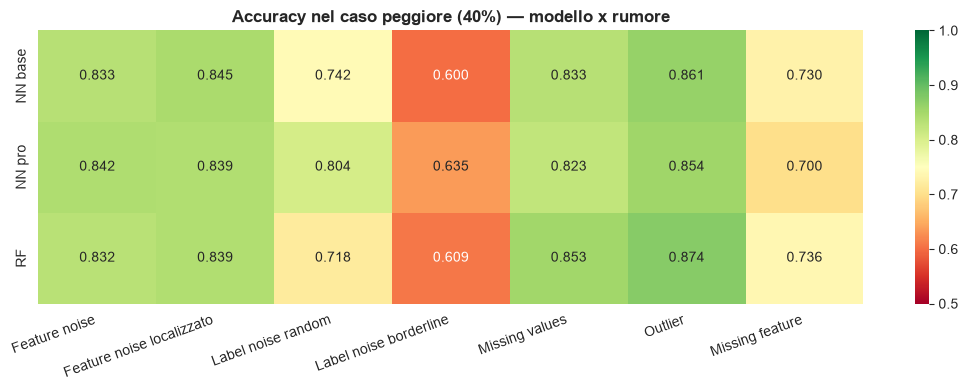

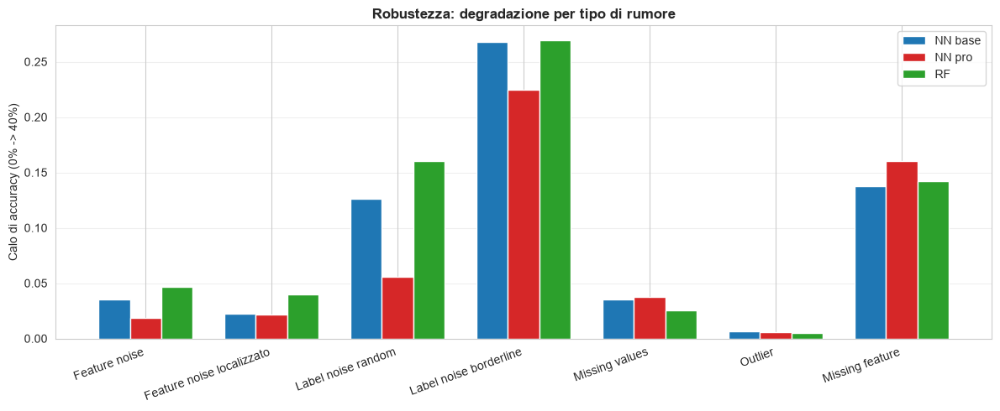

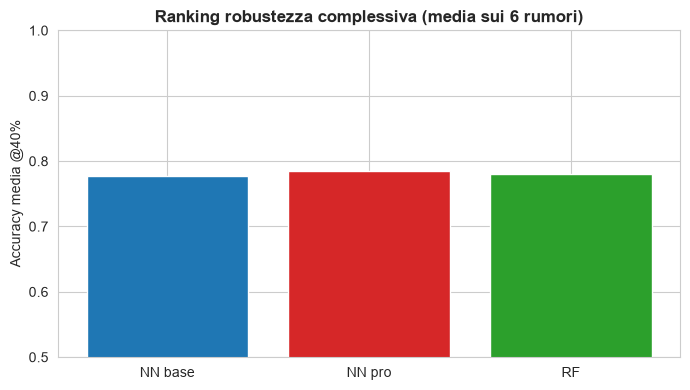

In [26]:
noises = list(AGG['NN base'].keys())
models = ['NN base', 'NN pro', 'RF']

# 1) Heatmap accuracy @40% (modello x rumore)
mat = np.array([[get_val(AGG[m][n], 40, 'accuracy') for n in noises] for m in models])
plt.figure(figsize=(11, 4))
sns.heatmap(mat, annot=True, fmt='.3f', cmap='RdYlGn', vmin=0.5, vmax=1.0,
            xticklabels=noises, yticklabels=models)
plt.title('Accuracy nel caso peggiore (40%) — modello x rumore', fontweight='bold')
plt.xticks(rotation=20, ha='right'); plt.tight_layout(); plt.show()

# 2) Degradazione (acc@0 - acc@40)
x = np.arange(len(noises)); width = 0.25
fig, ax = plt.subplots(figsize=(12, 5))
for i, m in enumerate(models):
    deg = [get_val(AGG[m][n], 0, 'accuracy') - get_val(AGG[m][n], 40, 'accuracy') for n in noises]
    ax.bar(x + i * width, deg, width, label=m, color=PALETTE[i])
ax.set_xticks(x + width); ax.set_xticklabels(noises, rotation=20, ha='right')
ax.set_ylabel('Calo di accuracy (0% -> 40%)')
ax.set_title('Robustezza: degradazione per tipo di rumore', fontweight='bold')
ax.legend(); ax.grid(axis='y', alpha=0.3); plt.tight_layout(); plt.show()

# 3) Ranking robustezza complessiva (accuracy media @40% sui rumori)
rank = {m: float(np.mean([get_val(AGG[m][n], 40, 'accuracy') for n in noises])) for m in models}
plt.figure(figsize=(7, 4))
plt.bar(list(rank.keys()), list(rank.values()), color=PALETTE[:3])
plt.ylabel('Accuracy media @40%'); plt.ylim(0.5, 1.0)
plt.title('Ranking robustezza complessiva (media sui 7 esperimenti)', fontweight='bold')
plt.tight_layout(); plt.show()

## ROC: dati puliti vs 40% Feature Noise

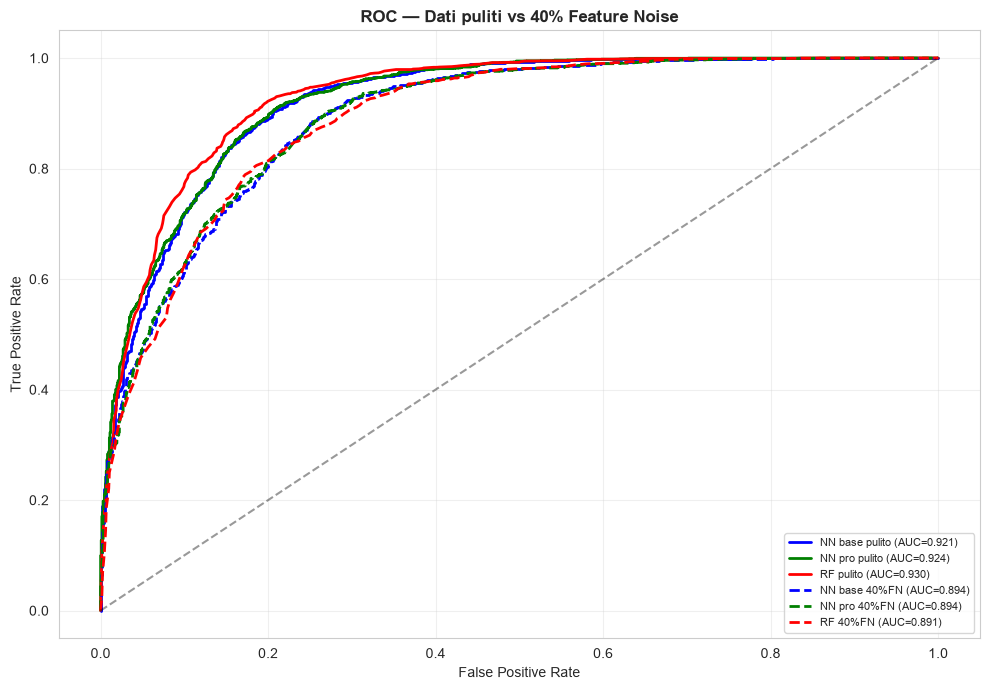

In [27]:
X_fn40 = add_gaussian_noise(X_train_scaled, noise_level=0.40, seed=seed)
mb40, _ = train_base_network(X_fn40, y_train, X_val_scaled, y_val, random_state=seed)
mp40, _ = train_pro_network(X_fn40, y_train, X_val_scaled, y_val, random_state=seed)
rf40    = train_random_forest(X_fn40, y_train, random_state=seed)

pairs = [
    ('NN base pulito', m_base_clean, 'blue',  '-'),
    ('NN pro pulito',  m_pro_clean,  'green', '-'),
    ('RF pulito',      rf_clean,     'red',   '-'),
    ('NN base 40%FN',  mb40,         'blue',  '--'),
    ('NN pro 40%FN',   mp40,         'green', '--'),
    ('RF 40%FN',       rf40,         'red',   '--'),
]
plt.figure(figsize=(10, 7))
for name, model, c, ls in pairs:
    sc = model_proba(model, X_test_scaled)
    fpr, tpr, _ = roc_curve(y_test, sc)
    plt.plot(fpr, tpr, color=c, ls=ls, lw=2, label=f'{name} (AUC={roc_auc_score(y_test, sc):.3f})')
plt.plot([0, 1], [0, 1], 'k--', alpha=0.4)
plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
plt.title('ROC — Dati puliti vs 40% Feature Noise', fontweight='bold')
plt.legend(loc='lower right', fontsize=8); plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

# Controllo multi-seed (Feature noise)

### Controllo multi-seed su Feature noise | seed = (42, 7, 123, 2024, 99) ###


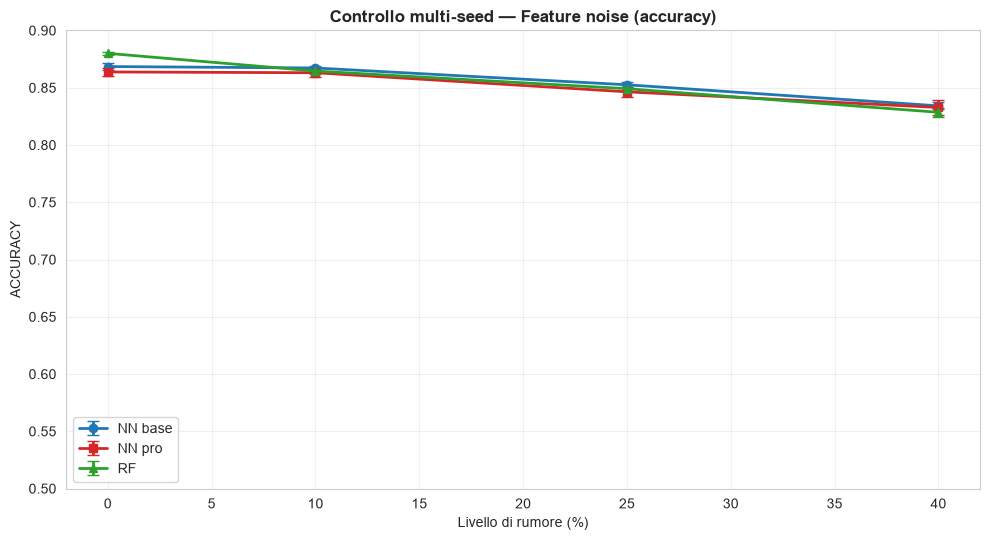

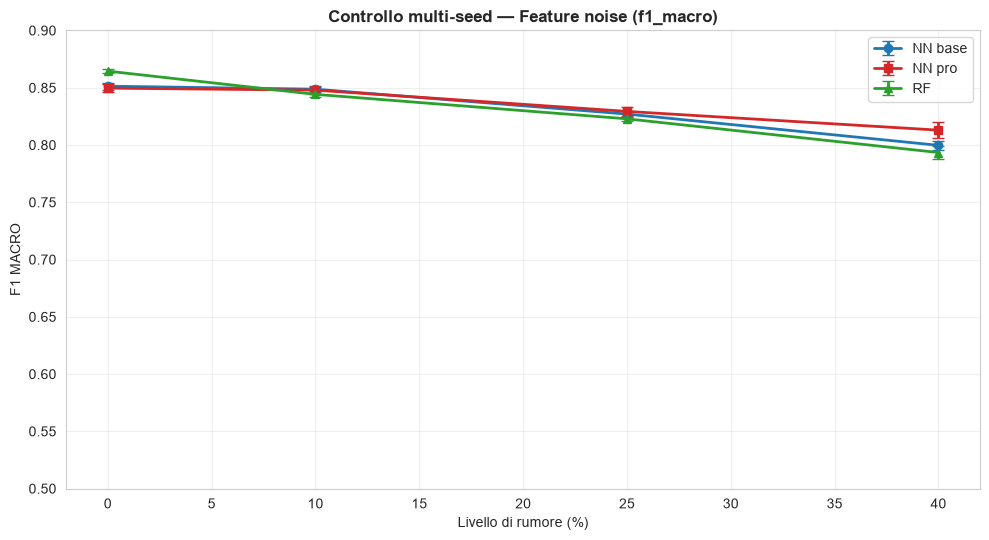

accuracy         f1_macro             auc        
                    mean     std     mean     std    mean     std
modello livello                                                  
NN base 0         0.8685  0.0027   0.8514  0.0029  0.9220  0.0015
        10        0.8672  0.0018   0.8487  0.0025  0.9198  0.0014
        25        0.8526  0.0020   0.8270  0.0024  0.9068  0.0016
        40        0.8342  0.0031   0.7997  0.0040  0.8924  0.0027
NN pro  0         0.8638  0.0035   0.8497  0.0032  0.9241  0.0010
        10        0.8631  0.0036   0.8479  0.0030  0.9204  0.0012
        25        0.8464  0.0045   0.8293  0.0036  0.9056  0.0016
        40        0.8328  0.0068   0.8130  0.0070  0.8924  0.0012
RF      0         0.8800  0.0013   0.8645  0.0014  0.9308  0.0009
        10        0.8646  0.0024   0.8442  0.0026  0.9198  0.0015
        25        0.8492  0.0016   0.8228  0.0016  0.9042  0.0018
        40        0.8285  0.0037   0.7934  0.0055  0.8881  0.0028

In [28]:
# --- ESTENSIONE: controllo multi-seed (feature noise) -------------------------
# Driver leggero: ripete l'esperimento su piu' seed e aggrega media/std.
# Non chiama evaluate_network/plot_three_models -> nessun report per-chiamata.
def run_multiseed(noise_name, make_data, seeds=(42, 7, 123, 2024, 99), levels=NOISE_LEVELS):
    rec = []
    for sd in seeds:
        for lvl in [0.0] + list(levels):
            Xtr, ytr, Xval, yval, Xte, yte = make_data(lvl, sd)
            mb, _ = train_base_network(Xtr, ytr, Xval, yval, random_state=sd)
            mp, _ = train_pro_network(Xtr, ytr, Xval, yval, random_state=sd)
            mr    = train_random_forest(Xtr, ytr, random_state=sd)
            for name, model in [('NN base', mb), ('NN pro', mp), ('RF', mr)]:
                rec.append({'seed': sd, 'modello': name, 'livello': int(round(lvl * 100)),
                            **compute_metrics(model, Xte, yte)})
    return pd.DataFrame(rec)


def plot_multiseed(df, metric='accuracy', noise_name=''):
    plt.figure(figsize=(10, 5.5))
    for name, color, mark in [('NN base', PALETTE[0], 'o'), ('NN pro', PALETTE[1], 's'), ('RF', PALETTE[2], '^')]:
        g = df[df['modello'] == name].groupby('livello')[metric]
        plt.errorbar(g.mean().index, g.mean().values, yerr=g.std().values,
                     marker=mark, lw=2, capsize=4, color=color, label=name)
    plt.xlabel('Livello di rumore (%)'); plt.ylabel(metric.replace('_', ' ').upper())
    plt.ylim(*YLIM_CONFRONTO)
    plt.title(f'Controllo multi-seed — {noise_name} ({metric})', fontweight='bold')
    plt.grid(alpha=0.3); plt.legend(); plt.tight_layout(); plt.show()


SEEDS_CTRL = (42, 7, 123, 2024, 99)
print(f'### Controllo multi-seed su Feature noise | seed = {SEEDS_CTRL} ###')
df_ms = run_multiseed('Feature noise', make_fn, seeds=SEEDS_CTRL)
plot_multiseed(df_ms, 'accuracy', 'Feature noise')
plot_multiseed(df_ms, 'f1_macro', 'Feature noise')

tab_ms = (df_ms.groupby(['modello', 'livello'])[['accuracy', 'f1_macro', 'auc']]
                .agg(['mean', 'std']).round(4))
display(tab_ms)

# Modello Non Supervisionato (K-Means)

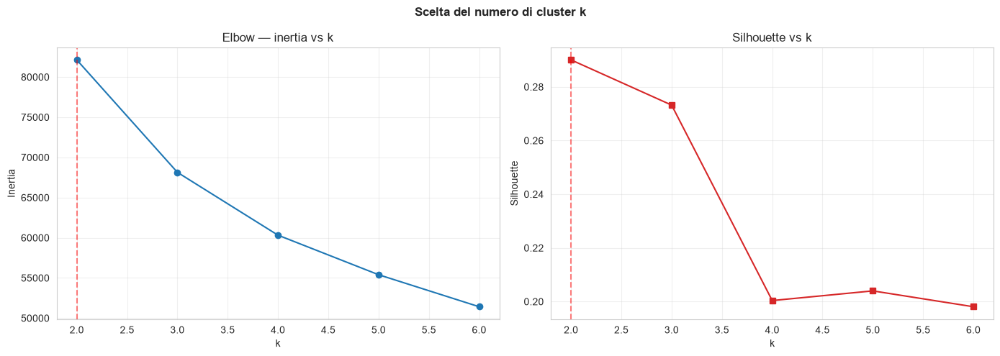

k con silhouette massima: 2  ->  procediamo con k=2, coerente con le due classi note.


In [29]:
# --- Scelta del numero di cluster k: elbow (inertia) + silhouette ---------------
# Verifichiamo a posteriori, sui soli dati, che k=2 sia una scelta sensata.
ks = list(range(2, 7))
inertias, silhouettes = [], []
for kk in ks:
    km = KMeans(n_clusters=kk, n_init=10, random_state=seed).fit(X_train_scaled)
    inertias.append(km.inertia_)
    silhouettes.append(silhouette_score(X_train_scaled, km.labels_, sample_size=2000, random_state=seed))

fig, ax = plt.subplots(1, 2, figsize=(14, 5))
ax[0].plot(ks, inertias, marker='o', color=PALETTE[0]); ax[0].set_title('Elbow — inertia vs k')
ax[0].set_xlabel('k'); ax[0].set_ylabel('Inertia')
ax[1].plot(ks, silhouettes, marker='s', color=PALETTE[1]); ax[1].set_title('Silhouette vs k')
ax[1].set_xlabel('k'); ax[1].set_ylabel('Silhouette')
for a in ax:
    a.axvline(2, color='red', ls='--', alpha=0.5); a.grid(alpha=0.3)
plt.suptitle('Scelta del numero di cluster k', fontweight='bold')
plt.tight_layout(); plt.show()

best_k = ks[int(np.argmax(silhouettes))]
print(f'k con silhouette massima: {best_k}  ->  procediamo con k=2, coerente con le due classi note.')

In [30]:
def cluster_quality(X_scaled, y_true, k=2, random_state=42):
    km = KMeans(n_clusters=k, n_init=10, random_state=random_state)
    labels = km.fit_predict(X_scaled)
    y_arr = np.array(y_true)
    purity = sum(np.bincount(y_arr[labels == c]).max() for c in np.unique(labels)) / len(y_arr)
    metrics = {
        'ARI':        adjusted_rand_score(y_arr, labels),
        'AMI':        adjusted_mutual_info_score(y_arr, labels),
        'NMI':        normalized_mutual_info_score(y_arr, labels),
        'purezza':    purity,
        'silhouette': silhouette_score(X_scaled, labels, sample_size=2000, random_state=random_state),
    }
    return metrics, labels, km

q_clean, labels_clean, _ = cluster_quality(X_train_scaled, y_train)
print('K-means (k=2) dati puliti:')
for m, v in q_clean.items():
    print(f'  {m:11s}: {v:.4f}')

K-means (k=2) dati puliti:
  ARI        : 0.0064
  AMI        : 0.0014
  NMI        : 0.0015
  purezza    : 0.6484
  silhouette : 0.2900


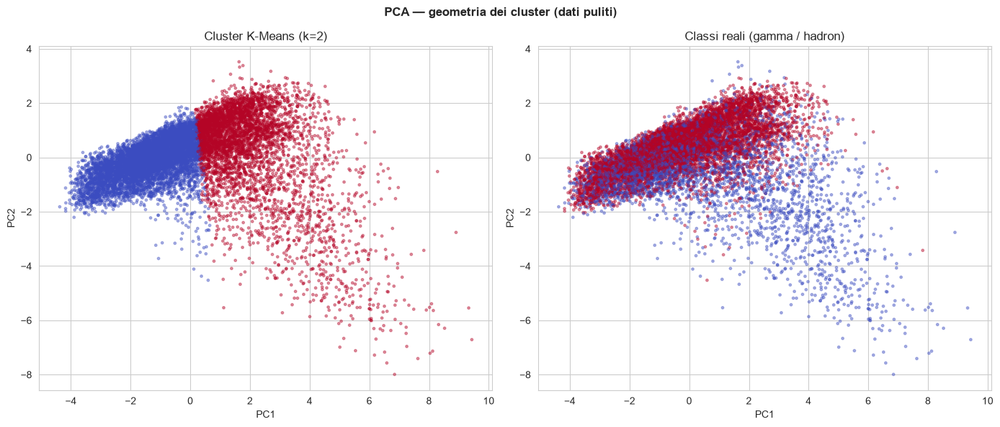

In [31]:
pc = PCA(n_components=2, random_state=seed).fit_transform(X_train_scaled)
fig, ax = plt.subplots(1, 2, figsize=(14, 6))
ax[0].scatter(pc[:, 0], pc[:, 1], c=labels_clean, cmap='coolwarm', s=6, alpha=0.4)
ax[0].set_title('Cluster K-Means (k=2)')
ax[1].scatter(pc[:, 0], pc[:, 1], c=np.array(y_train), cmap='coolwarm', s=6, alpha=0.4)
ax[1].set_title('Classi reali (gamma / hadron)')
for a in ax:
    a.set_xlabel('PC1'); a.set_ylabel('PC2')
plt.suptitle('PCA — geometria dei cluster (dati puliti)', fontweight='bold')
plt.tight_layout(); plt.show()

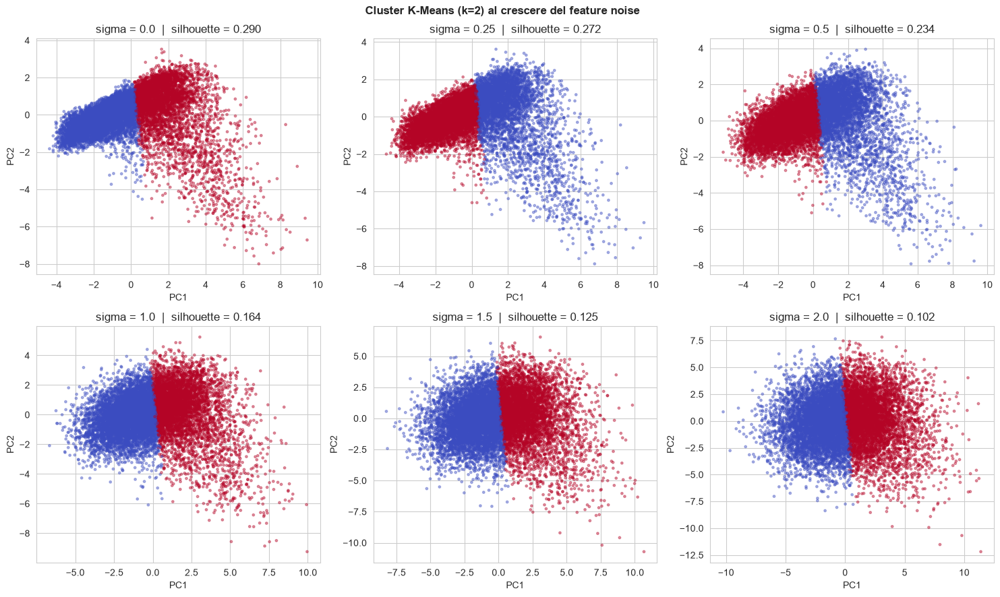

In [ ]:
# Visualizzazione dei cluster K-Means al crescere del feature noise (proiezione PCA comune)
pca_clean = PCA(n_components=2, random_state=seed).fit(X_train_scaled)
noise_show = [0.0, 0.25, 0.5, 1.0, 1.5, 2.0]
fig, axes = plt.subplots(2, 3, figsize=(15, 9))
for ax, lvl in zip(axes.ravel(), noise_show):
    Xn = X_train_scaled if lvl == 0 else add_gaussian_noise(X_train_scaled, noise_level=lvl, seed=seed)
    labels = KMeans(n_clusters=2, n_init=10, random_state=seed).fit_predict(Xn)
    pc = pca_clean.transform(Xn)
    ax.scatter(pc[:, 0], pc[:, 1], c=labels, cmap='coolwarm', s=6, alpha=0.4)
    sil = silhouette_score(Xn, labels, sample_size=2000, random_state=seed)
    ax.set_title(f'sigma = {lvl}  |  silhouette = {sil:.3f}')
    ax.set_xlabel('PC1'); ax.set_ylabel('PC2')
plt.suptitle('Cluster K-Means (k=2) al crescere del feature noise', fontweight='bold')
plt.tight_layout(); plt.show()

--- Effetto del Feature Noise su K-Means ---
 sigma     ARI     AMI  silhouette   purezza
  0.00   0.006   0.001       0.290     0.648
  0.25   0.008   0.002       0.272     0.648
  0.50   0.009   0.002       0.234     0.648
  1.00   0.006   0.002       0.164     0.648
  1.50   0.005   0.002       0.125     0.648
  2.00   0.003   0.001       0.102     0.648


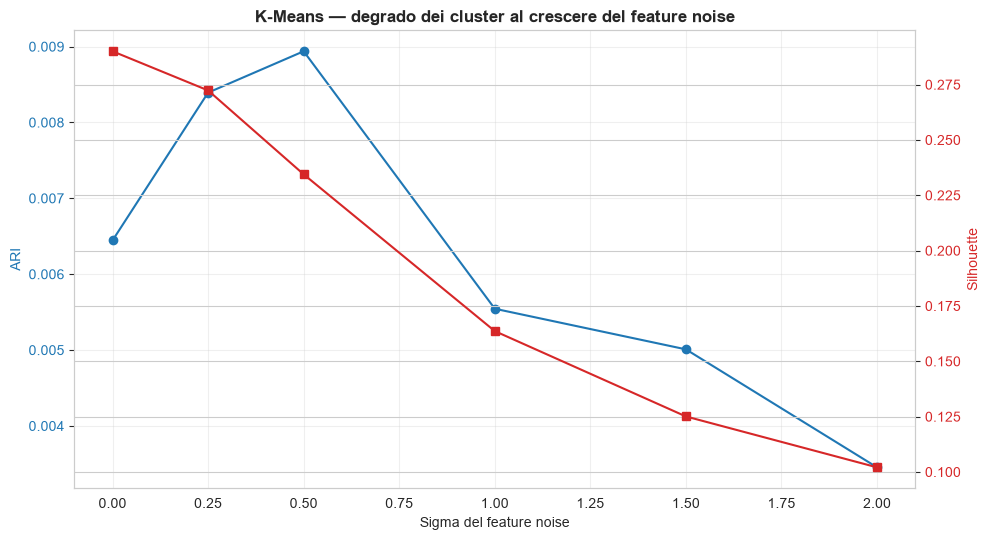


ARI(clustering pulito, clustering label-noise 40%) = 1.000
K-Means non riceve y in fit_predict -> il Label Noise non sposta i cluster (ARI=1.0).


In [32]:
feature_levels = [0.0, 0.25, 0.5, 1.0, 1.5, 2.0]
print('--- Effetto del Feature Noise su K-Means ---')
print(f'{"sigma":>6}{"ARI":>8}{"AMI":>8}{"silhouette":>12}{"purezza":>10}')
ari_list, sil_list = [], []
for lvl in feature_levels:
    X_noisy = add_gaussian_noise(X_train_scaled, noise_level=lvl, seed=seed)
    q, _, _ = cluster_quality(X_noisy, y_train)
    ari_list.append(q['ARI']); sil_list.append(q['silhouette'])
    print(f'{lvl:>6.2f}{q["ARI"]:>8.3f}{q["AMI"]:>8.3f}{q["silhouette"]:>12.3f}{q["purezza"]:>10.3f}')

# Grafico del degrado: ARI (accordo con le classi reali) e silhouette (coesione interna) vs sigma
fig, ax1 = plt.subplots(figsize=(10, 5.5))
ax1.plot(feature_levels, ari_list, marker='o', color=PALETTE[0], label='ARI (vs classi reali)')
ax1.set_xlabel('Sigma del feature noise'); ax1.set_ylabel('ARI', color=PALETTE[0])
ax1.tick_params(axis='y', labelcolor=PALETTE[0]); ax1.grid(alpha=0.3)
ax2 = ax1.twinx()
ax2.plot(feature_levels, sil_list, marker='s', color=PALETTE[1], label='Silhouette (coesione)')
ax2.set_ylabel('Silhouette', color=PALETTE[1]); ax2.tick_params(axis='y', labelcolor=PALETTE[1])
plt.title('K-Means — degrado dei cluster al crescere del feature noise', fontweight='bold')
fig.tight_layout(); plt.show()

y_train_flip = add_label_noise_random(y_train, noise_level=0.40, seed=seed)
_, labels_lab, _ = cluster_quality(X_train_scaled, y_train_flip)
print(f'\nARI(clustering pulito, clustering label-noise 40%) = {adjusted_rand_score(labels_clean, labels_lab):.3f}')
print('K-Means non riceve y in fit_predict -> il Label Noise non sposta i cluster (ARI=1.0).')